In [1]:
# General
import sys
import os
import os.path as op
import glob
from copy import deepcopy
from time import time
from collections import OrderedDict as od
from importlib import reload
from glob import glob
import itertools
import warnings
from cluster_helper.cluster import cluster_view

# Scientific
import numpy as np
import xarray
import pandas as pd
pd.options.display.max_rows = 200
pd.options.display.max_columns = 999
from scipy import signal
from scipy.io import loadmat
import h5py

# Stats
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import astropy.stats.circstats as circstats
import pycircstat
import random
from sklearn.decomposition import PCA
import scikits.bootstrap as boot

# Plots
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
plt.style.use('/home1/dscho/code/general/preferred.mplstyle')
import seaborn as sns
from matplotlib.lines import Line2D
import matplotlib.path as mpath
import matplotlib.patches as patches
from matplotlib.backends.backend_pdf import PdfPages

# Neuro
import mne
from fooof import FOOOF, FOOOFGroup
from fooof.objs.utils import combine_fooofs
#import neurodsp

# Personal
sys.path.append('/home1/dscho/code/general')
sys.path.append('/home1/dscho/code/projects')
from formatting import *
from helper_funcs import *
import data_io as dio
import array_operations as aop
from eeg_plotting import plot_trace, plot_trace2
from time_cells import spike_sorting, spike_preproc, events_preproc, events_proc, time_bin_analysis
from phase_locking import eeg_preproc, spectral_analysis, unit_lfp_comparison

# Colors
colors, palettes = get_colors()
co = colors
mpl.rcParams['axes.prop_cycle'] = mpl.cycler('color', palettes['economist'])

colws = od([(1, 1.555118),
            (2, 3.169291),
            (3, 6.456693)])

proj_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta'

In [2]:
def gmean_sem(vals,
              decimals=2):
    """Return geometric mean ± standard error."""
    log_vals = np.log10(vals)
    _mean = 10**np.nanmean(log_vals)
    _sem = 10**stats.sem(log_vals, nan_policy='omit')
    string = '{:.{_}f} ± {:.{_}f}'.format(_mean, _sem, _=decimals)
    return string

# Load data

In [3]:
# Get sessions.
sessions = np.unique([op.basename(f).split('-')[0] 
                      for f in glob(op.join('/data7', 'goldmine', 'analysis', 'events', '*.pkl'))])
print('{} subjects, {} sessions'.format(len(np.unique([x.split('_')[0] for x in sessions])), len(sessions)))

10 subjects, 12 sessions


In [9]:
# Load spikes.
fr_thresh = 0.2
nspike_thresh = 0
n_rois = 6
expmts = ['ycab', 'goldmine']

# ----------------------
spikes = []
for expmt in expmts:
    print(expmt)
    spikes.append(unit_lfp_comparison.load_all_unit_spikes(fr_thresh=fr_thresh,
                                                           nspike_thresh=nspike_thresh,
                                                           n_rois=n_rois,
                                                           expmt=expmt))
    spikes[-1].insert(0, 'expmt', expmt)
spikes = pd.concat(spikes, axis=0).reset_index(drop=True)

if 'subj_sess_unit' not in spikes:
    spikes.insert(1, 'subj_sess_unit', spikes.apply(lambda x: '{}-{}-{}'.format(x['subj_sess'], x['chan'], x['unit']), axis=1))
    
n_rois = 8
roi_map = spike_preproc.roi_mapping(n_rois)
spikes['roi_gen'] = spikes['hemroi'].apply(lambda x: roi_map[x[1:]])

print('spikes:', spikes.shape)

ycab
spikes: (1633, 10)
Ran in 51.5s
goldmine
10 subjects, 12 sessions
spikes: (448, 10)
Ran in 30.6s
spikes: (2081, 12)


In [10]:
expmts = ['ycab', 'goldmine']
data_dir = {'ycab': '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/ycab/phase_locking/10000perm',
            'goldmine': '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine/nav/phase_locking/10000perm'}
freqs = np.arange(1, 31)
n_rois = 8
min_spikes = 50
alpha = 0.05
verbose = False

# -----------------------
timer = Timer()

output_file = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta/dataframes',
                      'pl_mrls-28subjs_55sessions_1651neurons.pkl')
if op.exists(output_file):
    pl_mrls = dio.open_pickle(output_file)
else:
    try:
        mask_idx = dio.open_pickle(glob(op.join(data_dir['goldmine'], '*.pkl'))[0]).columns.tolist().index('mask')
    except ValueError:
        mask_idx = 13

    pl_files = []
    pl_mrls = []
    for expmt in expmts:
        pl_files.append(glob(op.join(data_dir[expmt], '*.pkl')))
        pl_mrls.append(pd.concat([dio.open_pickle(f) for f in pl_files[-1]])                     
                         .sort_values(['subj_sess', 'unit', 'lfp_roi_gen'])
                         .reset_index(drop=True))
        pl_mrls[-1].insert(0, 'expmt', expmt)
        if 'mask' not in pl_mrls[-1]:
            pl_mrls[-1].insert(mask_idx, 'mask', 'all')

    pl_mrls = pd.concat(pl_mrls).reset_index(drop=True)
    pl_mrls.insert(1,
                   'subj_sess_unit',
                   pl_mrls.apply(lambda x: '{}-{}'.format(x['subj_sess'], x['unit']), axis=1))
    pl_mrls.insert(pl_mrls.columns.tolist().index('edge')+1,
                   'is_local',
                   pl_mrls['unit_hemroi'] == pl_mrls['lfp_hemroi'])
    pl_mrls.insert(pl_mrls.columns.tolist().index('n_spikes_mask')+1,
                   'max_n_spikes_mask',
                   pl_mrls['n_spikes_mask'].apply(lambda x: np.nanmax(x)))
    pl_mrls.insert(pl_mrls.columns.tolist().index('n_spikes_mask_null')+1,
                   'max_n_spikes_mask_null',
                   pl_mrls['n_spikes_mask_null'].apply(lambda x: np.nanmean(np.nanmax(x, axis=1))))
    pl_mrls.insert(pl_mrls.columns.tolist().index('mrls')+1,
                   'max_mrl',
                   pl_mrls['mrls'].apply(lambda x: np.nanmax(x)))
    pl_mrls.insert(pl_mrls.columns.tolist().index('mrls')+2,
                   'max_mrl_freq',
                   pl_mrls['mrls'].apply(lambda x: freqs[np.nanargmax(x)]))
    pl_mrls.insert(pl_mrls.columns.tolist().index('mrls_null')+1,
                   'max_mrl_null',
                   pl_mrls['mrls_null'].apply(lambda x: np.nanmean(np.nanmax(x, axis=1))))
    pl_mrls.insert(pl_mrls.columns.tolist().index('mrls_null')+2,
                   'max_mrl_freq_null',
                   pl_mrls['mrls_null'].apply(lambda x: freqs[stats.mode(np.nanargmax(x, axis=1), nan_policy='omit').mode[0]]))
    pl_mrls.insert(pl_mrls.columns.tolist().index('pref_phases')+1,
                   'max_pref_phase',
                   pl_mrls.apply(lambda x: x['pref_phases'][np.nanargmax(x['mrls'])], axis=1))
    pl_mrls.insert(pl_mrls.columns.tolist().index('pref_phases')+2,
                   'max_z_pref_phase',
                   pl_mrls.apply(lambda x: x['pref_phases'][np.nanargmax(x['z_mrls'])], axis=1))
    pl_mrls.insert(pl_mrls.columns.tolist().index('max_z_mrl_freq')+1,
                   'max_z_mrl_null',
                   pl_mrls['mrls_null'].apply(lambda x: np.nanmean(np.nanmax(stats.zscore(x, axis=0, nan_policy='omit'), axis=1))))
    pl_mrls.insert(pl_mrls.columns.tolist().index('max_z_mrl_freq')+2,
                   'max_z_mrl_freq_null',
                   pl_mrls['mrls_null'].apply(lambda x: freqs[stats.mode(np.nanargmax(stats.zscore(x, axis=0, nan_policy='omit'), axis=1), nan_policy='omit').mode[0]]))
    pl_mrls.drop(columns=['n_spikes_mask_null', 'mrls_null'], inplace=True)

    # Reformat regions.
    roi_map = spike_preproc.roi_mapping(n_rois)
    spikes['roi_gen'] = spikes['hemroi'].apply(lambda x: roi_map[x[1:]])
    for cxn in ['unit', 'lfp']:
        pl_mrls['{}_roi_gen'.format(cxn)] = pl_mrls['{}_hemroi'.format(cxn)].apply(lambda x: roi_map[x[1:]])

    # Drop unwanted regions.
    drop_idx = pl_mrls.loc[np.isin(pl_mrls['unit_roi_gen'], 'Other') | np.isin(pl_mrls['lfp_roi_gen'], 'Other')].index
    pl_mrls = pl_mrls.drop(index=drop_idx).reset_index(drop=True)

    drop_rois = ['MC', 'PC', 'TP']
    hpc_rois = ['AH', 'MH', 'PH']
    mtl_rois = ['A', 'EC']
    gen_rois = ['HPC', 'EC', 'AMY', 'PHG', 'STG', 'OFC', 'ACC']
    gen_rois2 = ['HPC', 'MTL', 'CTX']
    for cxn in ['unit', 'lfp']:
        pl_mrls.insert(pl_mrls.columns.tolist().index('{}_hemroi'.format(cxn))+1,
                       '{}_roi'.format(cxn),
                       pl_mrls['{}_hemroi'.format(cxn)].apply(lambda x: x[1:]))
        pl_mrls = pl_mrls.query("({}_roi!={})".format(cxn, drop_rois)).reset_index(drop=True)

        pl_mrls['{}_roi_gen'.format(cxn)] = pl_mrls['{}_roi_gen'.format(cxn)].astype(str)
        pl_mrls.loc[pl_mrls['{}_roi_gen'.format(cxn)]=='CC', '{}_roi_gen'.format(cxn)] = 'ACC'
        pl_mrls.loc[pl_mrls['{}_roi_gen'.format(cxn)]=='LTC', '{}_roi_gen'.format(cxn)] = 'STG'
        pl_mrls['{}_roi_gen'.format(cxn)] = pl_mrls['{}_roi_gen'.format(cxn)].astype(pd.CategoricalDtype(gen_rois, ordered=True))

        pl_mrls.insert(pl_mrls.columns.tolist().index('{}_roi_gen'.format(cxn))+1, '{}_roi_gen2'.format(cxn), '')
        pl_mrls.loc[np.isin(pl_mrls['{}_hemroi'.format(cxn)].apply(lambda x: x[1:]), hpc_rois), '{}_roi_gen2'.format(cxn)] = 'HPC'
        pl_mrls.loc[np.isin(pl_mrls['{}_hemroi'.format(cxn)].apply(lambda x: x[1:]), mtl_rois), '{}_roi_gen2'.format(cxn)] = 'MTL'
        pl_mrls.loc[~np.isin(pl_mrls['{}_hemroi'.format(cxn)].apply(lambda x: x[1:]), hpc_rois + mtl_rois), '{}_roi_gen2'.format(cxn)] = 'CTX'
        pl_mrls['{}_roi_gen2'.format(cxn)] = pl_mrls['{}_roi_gen2'.format(cxn)].astype(pd.CategoricalDtype(gen_rois2, ordered=True))

    pl_mrls.insert(pl_mrls.columns.tolist().index('lfp_hemroi')+1, 'lfp_hpc_div', '')
    pl_mrls.loc[np.isin(pl_mrls['lfp_hemroi'], ['LAH', 'RAH']), 'lfp_hpc_div'] = 'ant'
    pl_mrls.loc[np.isin(pl_mrls['lfp_hemroi'], ['LMH', 'LPH', 'RMH', 'RPH']), 'lfp_hpc_div'] = 'post'

    # Drop repeat connections .
    mult_edge_neurons = (pl_mrls
                         .query("(edge==['ctx-hpc', 'hpc-hpc'])")
                         .groupby(['mask', 'subj_sess_unit', 'lfp_roi_gen'])
                         .size()
                         .reset_index()
                         .rename(columns={0: 'n_edges'})
                         .query("(n_edges>1)")['subj_sess_unit']
                         .unique()
                         .tolist())
    qry = "(edge==['ctx-hpc', 'hpc-hpc']) & (subj_sess_unit=={})".format(mult_edge_neurons)
    drop_idx = np.concatenate([unit_lfp_comparison.axe_connections(df)
                               for (idx, df) in pl_mrls.query(qry).groupby('subj_sess_unit')])
    pl_mrls = pl_mrls.drop(index=drop_idx).reset_index(drop=True)

    # Drop contralateral connections.
    pl_mrls = pl_mrls.query("(same_hem==True)").reset_index(drop=True)

    # Drop neurons with too few spikes.
    pl_mrls = pl_mrls.query("(max_n_spikes_mask>={})".format(min_spikes)).reset_index(drop=True)

    # Drop nonlocal connections within the same general region.
    drop_idx = pl_mrls.query("(same_roi_gen==True) & (is_local==False)").index.tolist()
    pl_mrls.drop(index=drop_idx, inplace=True)

    # Keep only local connections and connections to hippocampal LFPs.
    pl_mrls = pl_mrls.query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])").reset_index(drop=True)

    # FDR correct p-values, separately within each unit-to-LFP region pair.
    pl_mrls.drop(columns=[col for col in list(set(['pval_fdr', 'sig_fdr']) & set(pl_mrls.columns))], inplace=True)
    pl_mrls.insert(pl_mrls.columns.tolist().index('sig')+1, 'pval_fdr', np.nan)
    pl_mrls.insert(pl_mrls.columns.tolist().index('sig')+2, 'sig_fdr', np.nan)

    grp_cols = ['mask', 'is_local', 'unit_roi_gen', 'lfp_roi_gen']
    for (mask, is_local, unit_roi_gen, lfp_roi_gen), df in pl_mrls.groupby(grp_cols, observed=True):
        if mask == 'all_matched':
            idx = (pl_mrls
                   .query("(is_local=={}) & (unit_roi_gen=='{}') & (lfp_roi_gen=='{}')"
                          .format(is_local, unit_roi_gen, lfp_roi_gen))
                   .query("((expmt=='goldmine') & (mask=='all_matched')) | ((expmt=='ycab') & (mask=='all'))")
                   .index)
        else:
            idx = df.index
        sig_fdr, pval_fdr, *_ = sm.stats.multipletests(pl_mrls.loc[idx, 'pval'],
                                                       alpha=alpha,
                                                       method='fdr_tsbky')
        pl_mrls.loc[idx, 'pval_fdr'] = pval_fdr
        pl_mrls.loc[idx, 'sig_fdr'] = sig_fdr

        if verbose:
            print('{:>11}, {:>3}, {:>3}: {:>3} neurons'.format(mask, unit_roi_gen, lfp_roi_gen, len(idx)))
    
    print('{} saved files'.format(np.sum([len(x) for x in pl_files])))
    
print('pl_mrls: {}'.format(pl_mrls.shape))
print('{} subjects, {} sessions, {} neurons'
      .format(pl_mrls['subj'].unique().size,
              pl_mrls['subj_sess'].unique().size,
              pl_mrls['subj_sess_unit'].unique().size))
print(timer)

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/scipy/stats/stats.py:2494: RuntimeWarning: Mean of empty slice
  mns = np.nanmean(a=a, axis=axis, keepdims=True)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1665: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


1942 saved files
pl_mrls: (3169, 48)
28 subjects, 55 sessions, 1854 neurons
Ran in 59.7s


In [ ]:
# Save the pl_mrls dataframe.
save_output = 0
overwrite = 0

if save_output:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta/dataframes',
                       'pl_mrls-{}subjs_{}sessions_{}neurons.pkl'
                       .format(pl_mrls['subj'].unique().size,
                               pl_mrls['subj_sess'].unique().size,
                               pl_mrls['subj_sess_unit'].unique().size))
    if overwrite or not op.exists(filename):
        dio.save_pickle(pl_mrls, filename)

In [50]:
pl_mrls_full = pl_mrls.copy() # before dropping neurons w/ insufficient spike no.

# How many neurons?

In [10]:
# How many units for each region?
print(spikes['roi_gen'].value_counts())
print(len(spikes))

AMY      439
HPC      390
EC       341
PHG      217
CC       198
OFC      193
LTC      162
Other    141
Name: roi_gen, dtype: int64
2081


In [34]:
print('Firing rate across {} neurons: {:.1f} ({:.1f}, {:.1f})'
      .format(pl_mrls['subj_sess_unit'].nunique(),
              pl_mrls.drop_duplicates('subj_sess_unit')['fr'].median(),
              np.percentile(pl_mrls.drop_duplicates('subj_sess_unit')['fr'], 25),
              np.percentile(pl_mrls.drop_duplicates('subj_sess_unit')['fr'], 75)))

Firing rate across 1854 neurons: 2.0 (0.8, 5.0)


In [54]:
print('Firing rate across {} neurons: {:.1f} ({:.1f}, {:.1f})'
      .format(pl_mrls['subj_sess_unit'].nunique(),
              pl_mrls.drop_duplicates('subj_sess_unit')['fr'].median(),
              np.percentile(pl_mrls.drop_duplicates('subj_sess_unit')['fr'], 25),
              np.percentile(pl_mrls.drop_duplicates('subj_sess_unit')['fr'], 75)))

Firing rate across 1651 neurons: 2.5 (1.1, 5.5)


In [48]:
pl_mrls.drop_duplicates('subj_sess').groupby(['subj']).size().mean()

1.9642857142857142

In [43]:
pl_mrls.insert(4, 'chan', pl_mrls['unit'].apply(lambda x: x.split('-')[0]))

In [45]:
pl_mrls.drop_duplicates('subj_sess_unit').groupby(['subj_sess', 'chan']).size().max()

8

In [46]:
((43 * 25.4) + (12 * 62.9)) / 55

33.58181818181818

In [31]:
(pl_mrls
 .drop_duplicates('subj_sess_unit')
 .groupby('unit_roi_gen')
 .agg({'subj': lambda x: len(np.unique(x)),
       'unit': len,
       'fr': lambda x: median_q(x, 1)}))

,subj,unit,fr
unit_roi_gen,,,
HPC,27,391,"1.6 (0.6, 4.7)"
EC,19,341,"2.3 (1.0, 5.5)"
AMY,23,439,"1.5 (0.6, 3.7)"
PHG,15,217,"2.2 (0.8, 4.5)"
STG,5,139,"3.4 (1.4, 8.6)"
OFC,15,193,"2.0 (0.9, 4.9)"
ACC,8,134,"3.1 (1.4, 6.8)"


In [33]:
pl_mrls.drop_duplicates('subj_sess_unit')['subj'].nunique()

28

In [ ]:
pl_mrls.drop_duplicates('subj_sess_unit')

In [24]:
print('{}-{} neurons per subject (median = {})'
      .format(np.min(pl_mrls.drop_duplicates('subj_sess_unit').groupby('subj_sess').size()),
              np.max(pl_mrls.drop_duplicates('subj_sess_unit').groupby('subj_sess').size()),
              np.median(pl_mrls.drop_duplicates('subj_sess_unit').groupby('subj_sess').size())))

10-71 neurons per subject (median = 30.0)


In [14]:
pl_mrls.sort_values('max_n_spikes_mask').head(20)

,expmt,subj_sess_unit,subj,subj_sess,unit,unit_hemroi,unit_roi,unit_roi_gen,unit_roi_gen2,n_spikes,fr,lfp_hemroi,lfp_hpc_div,lfp_roi,lfp_roi_gen,lfp_roi_gen2,lfp_chans,edge,is_local,same_hem,mask,same_roi_gen,peps,max_pep,max_pep_freq,n_spikes_mask,max_n_spikes_mask,max_n_spikes_mask_null,mrls,max_mrl,max_mrl_freq,max_mrl_null,max_mrl_freq_null,mean_mrls_null,std_mrls_null,pref_phases,max_pref_phase,max_z_pref_phase,z_n_spikes_mask,z_mrls,max_z_mrl,max_z_mrl_freq,max_z_mrl_null,max_z_mrl_freq_null,pval,sig,pval_fdr,sig_fdr
151,ycab,U369_ses2-33-29,U369,U369_ses2,33-29,LA,A,AMY,MTL,213,0.308696,LA,,A,AMY,MTL,"[34, 35, 36, 37, 38, 39, 40]",ctx-local,True,True,all,True,"[0.9627950310559007, 2.9156935817805385, 1.152...",2.915694,2,"[1.2857143, 5.0, 1.4285715, 1.0, 1.1428572, 1....",5.428571,6.909128,"[0.7742241, 0.5431046, 0.69242764, 0.8439952, ...",0.894194,23,0.913578,5,"[0.7616533400312067, 0.4112325904235244, 0.665...","[0.12143627538402477, 0.09501307662787621, 0.1...","[-2.3221295, 2.798181, 2.9642053, 2.401972, -0...",2.400549,0.861404,"[-0.56092304, -1.0979859, -1.1857743, -0.64974...","[0.10351735859932248, 1.3879352531483897, 0.19...",1.468442,7,1.648736,1,0.639436,False,0.588003,False
154,ycab,U369_ses2-35-30,U369,U369_ses2,35-30,LA,A,AMY,MTL,236,0.342029,LMH,post,MH,HPC,HPC,"[41, 42, 43, 44, 45, 46, 48]",ctx-hpc,False,True,all,False,"[0.615983436853002, 2.6289648033126296, 1.5829...",2.936894,7,"[2.4285715, 5.714286, 1.8571428, 2.2857144, 2....",5.714286,7.271214,"[0.65719485, 0.639389, 0.94415754, 0.61054295,...",0.968030,22,0.889791,1,"[0.6551686540480703, 0.4527118932574987, 0.584...","[0.16640965446861547, 0.09779949869322889, 0.1...","[-0.48641717, 0.38274136, -2.4294994, -2.71419...",-3.049460,-2.429499,"[1.5906357, -0.31879103, -2.0992694, -0.264222...","[0.012175968920669123, 1.9087734366548295, 3.1...",3.153835,3,1.754845,2,0.001700,True,0.007660,True
143,ycab,U369_ses2-30-25,U369,U369_ses2,30-25,RPS,PS,STG,CTX,220,0.318841,RMH,post,MH,HPC,HPC,"[9, 10, 11, 12, 13, 14, 15, 16]",ctx-hpc,False,True,all,False,"[2.9817391304347827, 4.9486594202898555, 1.987...",4.948659,2,"[3.875, 6.375, 5.375, 3.875, 2.875, 1.5, 0.0, ...",6.375000,9.562463,"[0.6368765, 0.554545, 0.7718125, 0.6453574, 0....",1.000000,10,0.990334,7,"[0.5460097541932016, 0.4623339910238981, 0.555...","[0.1416919872749175, 0.10339820307105, 0.14962...","[3.061002, -1.9552357, 1.3277799, -1.253217, -...",0.314900,1.022864,"[-0.8233851, -0.91053295, 0.06454352, 0.176082...","[0.6412978676431069, 0.8918046110248282, 1.447...",1.687526,28,1.680724,4,0.459654,False,0.901726,False
153,ycab,U369_ses2-35-30,U369,U369_ses2,35-30,LA,A,AMY,MTL,236,0.342029,LA,,A,AMY,MTL,"[33, 34, 36, 37, 38, 39, 40]",ctx-local,True,True,all,True,"[0.8817805383022774, 2.9143064182194616, 1.136...",2.914306,2,"[2.142857, 6.428571, 2.142857, 1.0, 1.1428572,...",6.428571,7.003186,"[0.8201737, 0.35118243, 0.76207334, 0.85283875...",0.852839,4,0.895706,5,"[0.6604801729202271, 0.41143209536224606, 0.66...","[0.12206788321191278, 0.09535668213852411, 0.1...","[1.8359399, 2.1008751, 0.46342626, 0.3469976, ...",0.346998,-0.142807,"[-0.46191868, 0.014510384, -0.37336355, -0.868...","[1.3082352512401583, -0.6318347390918236, 0.67...",1.594189,7,1.668165,2,0.561444,False,0.542956,False
152,ycab,U369_ses2-33-29,U369,U369_ses2,33-29,LA,A,AMY,MTL,213,0.308696,LMH,post,MH,HPC,HPC,"[41, 42, 43, 44, 45, 46, 48]",ctx-hpc,False,True,all,False,"[0.615983436853002, 2.6289648033126296, 1.5829...",2.936894,7,"[1.1428572, 4.285714, 2.0, 1.0, 1.7142857, 6.0...",7.428571,6.882757,"[0.96601546, 0.6237219, 0.8075703, 0.80144954,...",0.966015,1,0.912461,1,"[0.6931400476701558, 0.4639163665652275, 0.614...","[0.1451336363160592, 0.10044449043342982, 0.12...","[1.2616737, -1.8246177, -2.630656, -3.0515554,...",1.261674,1.261674,"[-0.99005747, -1.1160046, -1.3770498, -1.74977...","[1.880166564851961, 1.5909835407325388, 1.5458...",1.880167,1,1.718991,2,0.364564,False,0.518926,False
1908,ycab,U385_ses4-14-11,U3

In [13]:
print('{} subjects, {} sessions, {} neurons'
      .format(pl_mrls['subj'].unique().size,
              pl_mrls['subj_sess'].unique().size,
              pl_mrls['subj_sess_unit'].unique().size))

28 subjects, 55 sessions, 1854 neurons


In [11]:
print('{} subjects, {} sessions, {} neurons'
      .format(pl_mrls['subj'].unique().size,
              pl_mrls['subj_sess'].unique().size,
              pl_mrls['subj_sess_unit'].unique().size))

28 subjects, 55 sessions, 1651 neurons


In [12]:
# How many neurons over how many subjects in each region,
# and what were their median (IQR) firing rates?
table = (pl_mrls
         .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
         .drop_duplicates('subj_sess_unit')
         .groupby('unit_roi_gen')
         .agg({'subj': lambda x: np.unique(x).size,
               'unit': len,
               'fr': median_q})
         .reset_index())
col_sums = (pl_mrls
            .query("(edge==['ctx-hpc', 'hpc-local'])")
            .drop_duplicates('subj_sess_unit')
            .groupby('same_hem')
            .agg({'unit_roi_gen': lambda x: 'Sum',
                  'subj': lambda x: np.unique(x).size,
                  'unit': len,
                  'fr': median_q}))
table = pd.concat((table, col_sums), axis=0).set_index('unit_roi_gen')
table

,subj,unit,fr
unit_roi_gen,,,
HPC,26,334,"2.05 (0.91, 5.30)"
EC,19,313,"2.91 (1.24, 5.79)"
AMY,23,380,"1.89 (0.86, 4.22)"
OFC,15,171,"2.68 (1.24, 5.49)"
PHG,15,198,"2.55 (1.02, 4.78)"
ACC,8,125,"3.25 (1.73, 7.13)"
STG,5,130,"3.71 (1.77, 9.24)"
Sum,28,1485,"2.57 (1.15, 5.53)"


In [13]:
# How many units for each subject, for each region?
(pl_mrls
 .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
 .drop_duplicates('subj_sess_unit')
 .groupby(['subj', 'unit_roi_gen'])
 .size()
 .unstack('subj')
 .fillna(0)
 .astype(int))

subj,U369,U370,U371,U372,U373,U374,U379,U380,U381,U384,U385,U387,U390,U392,U393,U394,U395,U396,U518,U521,U526,U527,U530,U532,U536,U537,U539,U540
unit_roi_gen,,,,,,,,,,,,,,,,,,,,,,,,,,,,
HPC,3,2,47,6,0,15,9,15,1,29,28,20,30,8,7,13,17,15,15,4,11,8,11,0,9,2,2,7
EC,0,1,32,9,41,16,0,41,9,30,27,1,0,0,0,0,10,6,5,0,1,7,42,18,14,0,3,0
AMY,18,8,49,5,25,0,17,0,59,34,0,23,0,2,13,11,29,5,6,0,4,6,16,22,12,9,4,3
OFC,0,7,0,0,7,0,0,0,31,55,11,14,0,8,0,10,0,1,0,0,0,8,3,1,7,1,0,7
PHG,0,0,32,9,27,0,0,3,0,0,0,4,16,0,13,3,21,1,23,17,0,0,0,15,7,0,0,7
ACC,0,0,0,0,0,23,16,0,31,0,33,2,0,0,0,0,0,0,0,0,1,0,4,0,15,0,0,0
STG,51,0,0,0,0,0,0,47,0,0,0,0,0,0,2,9,0,0,0,0,0,0,21,0,0,0,0,0


In [14]:
# How many neurons over how many subjects in each region,
# and what were their median (IQR) firing rates?
cols = ['subj', 'subj_sess_unit', 'unit', 'unit_hemroi', 'unit_roi_gen', 'same_hem', 'edge', 'fr', 'sig', 'sig_fdr']
df = pl_mrls.query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])").loc[:, cols].copy()
df.insert(4, 'unit_roi', df['unit_hemroi'].apply(lambda x: x[1:]))
table = (df
         .drop_duplicates('subj_sess_unit')
         .groupby('unit_roi')
         .agg({'subj': lambda x: np.unique(x).size,
               'unit': len,
               'fr': median_q})
         .reset_index())
col_sums = (df
            .drop_duplicates('subj_sess_unit')
            .groupby('same_hem')
            .agg({'unit_roi': lambda x: 'Sum',
                  'subj': lambda x: np.unique(x).size,
                  'unit': len,
                  'fr': median_q}))
table = pd.concat((table, col_sums), axis=0).set_index('unit_roi')
table

,subj,unit,fr
unit_roi,,,
A,23,380,"1.89 (0.86, 4.22)"
AC,8,125,"3.25 (1.73, 7.13)"
AH,18,233,"1.93 (0.97, 5.39)"
EC,19,313,"2.91 (1.24, 5.79)"
FSG,2,21,"2.54 (0.76, 4.07)"
HGa,1,21,"6.82 (2.95, 13.25)"
MH,11,75,"2.80 (0.87, 5.22)"
MST,1,34,"2.95 (1.32, 4.92)"
OF,15,171,"2.68 (1.24, 5.49)"


In [15]:
# How many units for each subject, for each region?
(df
 .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
 .drop_duplicates('subj_sess_unit')
 .groupby(['subj', 'unit_roi'])
 .size()
 .unstack('subj')
 .fillna(0)
 .astype(int))

subj,U369,U370,U371,U372,U373,U374,U379,U380,U381,U384,U385,U387,U390,U392,U393,U394,U395,U396,U518,U521,U526,U527,U530,U532,U536,U537,U539,U540
unit_roi,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A,18,8,49,5,25,0,17,0,59,34,0,23,0,2,13,11,29,5,6,0,4,6,16,22,12,9,4,3
AC,0,0,0,0,0,23,16,0,31,0,33,2,0,0,0,0,0,0,0,0,1,0,4,0,15,0,0,0
AH,0,2,16,0,0,15,9,15,1,29,28,20,30,8,7,13,17,6,0,0,11,0,0,0,0,2,0,4
EC,0,1,32,9,41,16,0,41,9,30,27,1,0,0,0,0,10,6,5,0,1,7,42,18,14,0,3,0
FSG,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,0,0,0,7
HGa,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,21,0,0,0,0,0
MH,3,0,5,6,0,0,0,0,0,0,0,0,0,0,0,0,0,9,15,4,0,8,11,0,9,0,2,3
MST,0,0,0,0,0,0,0,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
OF,0,7,0,0,7,0,0,0,31,55,11,14,0,8,0,10,0,1,0,0,0,8,3,1,7,1,0,7


In [16]:
# How many neuron-LFP connections do we have between each pair of regions?
(pl_mrls
 .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
 .groupby(['unit_roi_gen', 'lfp_roi_gen'])
 .size()
 .unstack('lfp_roi_gen'))

lfp_roi_gen,HPC,EC,AMY,OFC,PHG,ACC,STG
unit_roi_gen,,,,,,,
HPC,334,0,0,0,0,0,0
EC,260,304,0,0,0,0,0
AMY,335,0,366,0,0,0,0
OFC,157,0,0,167,0,0,0
PHG,166,0,0,0,182,0,0
ACC,106,0,0,0,0,125,0
STG,127,0,0,0,0,0,126


In [1316]:
# How many subjects have neuron-LFP connections between each pair of regions?
(pl_mrls
 .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
 .groupby(['unit_roi_gen', 'lfp_roi_gen'])
 ['subj'].apply(lambda x: len(np.unique(x)))
 .unstack('lfp_roi_gen')
 .fillna(0)
 .astype(int))

lfp_roi_gen,HPC,EC,AMY,PHG,STG,OFC,ACC
unit_roi_gen,,,,,,,
HPC,26,0,0,0,0,0,0
EC,17,19,0,0,0,0,0
AMY,22,0,23,0,0,0,0
PHG,15,0,0,14,0,0,0
STG,5,0,0,0,5,0,0
OFC,14,0,0,0,0,14,0
ACC,7,0,0,0,0,0,8


In [1288]:
# How many microwire bundles in each region?
qry = "(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])"
pl_mrls.query(qry).drop_duplicates(['subj', 'lfp_hemroi']).groupby('lfp_roi_gen').size()

lfp_roi_gen
HPC    53
EC     27
AMY    36
PHG    18
STG     9
OFC    18
ACC    13
dtype: int64

In [1289]:
# Where are the neurons in each general region coming from, more precisely?
for roi in ['HPC', 'PHG', 'STG']:
    print(roi, '-'*len(roi),
          (pl_mrls
           .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
           .drop_duplicates(['subj_sess_unit'])
           .query("(unit_roi_gen=='{}')".format(roi))
           ['unit_hemroi'].apply(lambda x: x[1:])
           .value_counts()
           .reset_index()),
          sep='\n', end='\n'*2)

HPC
---
  index  unit_hemroi
0    AH          233
1    MH           75
2    PH           26

PHG
---
  index  unit_hemroi
0    PG          129
1   PHG           48
2   FSG           21

STG
---
  index  unit_hemroi
0    ST           46
1   MST           34
2    PS           27
3   HGa           21
4   PST            2



In [266]:
# # Reconstruct spike times in each event from the flattened
# # (across events) spike times array.
# spike_event_divs = np.cumsum(event_time_spikes['spike_times'].apply(len).tolist())[:-1]
# spike_times = np.split(np.concatenate(event_time_spikes['spike_times'].tolist()), spike_event_divs)

# spike_phases = np.ma.concatenate(event_time_spikes.apply(lambda x: get_spike_phases(x['event_idx'],
#                                                                                     x['spike_times'],
#                                                                                     phase,
#                                                                                     osc_mask),
#                                                       axis=1).tolist(), axis=-1) # chan x freq x spike

# spikes_masked = np.array([[np.invert(spike_phases.mask[iChan, iFreq, :])
#                            for iFreq in range(spike_phases.shape[1])]
#                           for iChan in range(spike_phases.shape[0])]) # chan x freq x spike

# Phase-locking significance

In [64]:
def circmom(x):
    x = x.values[np.where(np.isfinite(x.values))[0]]
    return '{:.2f}, {:.2f}, p = {:.6f}'.format(*circstats.circmoment(x), circstats.rayleightest(x))

In [74]:
# Save the output table.
save_output = 1
overwrite = 0
table_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/tables'
# ------------------------

keep_cols = ['expmt', 'subj_sess_unit', 'subj', 'subj_sess', 'chan', 'unit',
             'unit_hemroi', 'unit_roi', 'unit_roi_gen', 'unit_roi_gen2', 'n_spikes',
             'fr', 'lfp_hemroi', 'lfp_hpc_div', 'lfp_roi', 'lfp_roi_gen',
             'lfp_roi_gen2', 'edge', 'is_local', 'same_hem',
             'same_roi_gen', 'max_pep', 'max_pep_freq',
             'max_n_spikes_mask', 'max_n_spikes_mask_null',
             'max_z_pref_phase', 'max_z_mrl', 'max_z_mrl_freq',
             'max_z_mrl_null', 'max_z_mrl_freq_null',
             'pval', 'sig', 'pval_fdr', 'sig_fdr']

filepath = op.join(table_dir, 'pl_mrls.csv')
if save_output:
    if overwrite or not op.exists(filepath):
        pl_mrls[keep_cols].to_csv(filepath)
        print('Saved {}'.format(filepath))

Saved /home1/dscho/projects/unit_activity_and_hpc_theta/tables/pl_mrls.csv


In [65]:
# Properties of phase-locked neurons.
keep_edges = ['ctx-hpc', 'ctx-local', 'hpc-local']
sig_col = 'sig_fdr'

def _nsig(nsig, n):
    return '{}/{} ({:.0%})'.format(nsig, n, nsig/n)

print('All phase-locked')
qry = "(edge=={}) & ({}==True)".format(keep_edges, sig_col)
tab = (pl_mrls.query(qry)
              .groupby(['is_local', 'unit_roi_gen', 'lfp_roi_gen'], observed=True)
              .agg({'unit': len,
                    'fr': mean_sem,
                    'max_n_spikes_mask_null': mean_sem,
                    'max_n_spikes_mask': mean_sem,
                    'max_pep': mean_sem,
                    'max_pep_freq': gmean_sem,
                    'max_z_mrl': mean_sem,
                    'max_z_mrl_freq': gmean_sem,
                    'max_z_pref_phase': circmom}))
qry = "(same_hem==True) & (edge=={})".format(keep_edges)
n_cells = pl_mrls.query(qry).groupby(['is_local', 'unit_roi_gen', 'lfp_roi_gen'], observed=True).size()
tab.insert(1,
           sig_col,
           tab.reset_index().apply(lambda x: _nsig(x['unit'], n_cells[(x['is_local'],
                                                                       x['unit_roi_gen'],
                                                                       x['lfp_roi_gen'])]),
                                   axis=1).tolist())
tab.drop(columns=['unit'], inplace=True)

tab

All phase-locked


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sig_fdr           fr  \
is_local unit_roi_gen lfp_roi_gen                               
False    EC           HPC          107/260 (41%)  5.82 ± 0.60   
         AMY          HPC           97/335 (29%)  4.63 ± 0.45   
         PHG          HPC             2/166 (1%)  2.78 ± 1.64   
         STG          HPC             4/127 (3%)  7.92 ± 3.85   
         OFC          HPC             5/157 (3%)  3.62 ± 1.01   
         ACC          HPC             1/106 (1%)  14.52 ± nan   
True     HPC          HPC          196/334 (59%)  5.24 ± 0.39   
         EC           EC           123/304 (40%)  5.65 ± 0.52   
         AMY          AMY          169/366 (46%)  4.72 ± 0.34   
         PHG          PHG           43/182 (24%)  5.80 ± 0.69   
         STG          STG           62/126 (49%)  8.63 ± 0.90   
         OFC          OFC           26/167 (16%)  6.76 ± 1.14   
         ACC          ACC             7/125 (6%)  3.11 ± 1.25   

                                  max_n_spikes_mask_null max_n_spikes_mask  \
is_local unit_roi_gen lfp_roi_gen                                            
False    EC           HPC               1518.26 ± 253.38  1507.99 ± 247.87   
         AMY          HPC                 837.89 ± 87.17    870.34 ± 89.75   
         PHG          HPC                303.08 ± 114.44   393.11 ± 209.39   
         STG          HPC                945.39 ± 565.88   970.03 ± 538.40   
         OFC          HPC                570.39 ± 122.94   542.63 ± 123.01   
         ACC          HPC                   376.14 ± nan      412.00 ± nan   
True     HPC          HPC                984.60 ± 123.56  1030.06 ± 123.25   
         EC           EC                1092.41 ± 175.31  1077.12 ± 169.35   
         AMY          AMY                 691.29 ± 53.90    727.95 ± 54.84   
         PHG          PHG               1212.41 ± 175.03  1119.30 ± 147.99   
         STG          STG               2281.72 ± 459.16  2284.39 ± 455.15   
         OFC          OFC               1664.21 ± 271.03  1600.88 ± 261.69   
         ACC          ACC               2139.89 ± 858.99  2067.73 ± 841.57   

                                         max_pep max_pep_freq     max_z_mrl  \
is_local unit_roi_gen lfp_roi_gen                                             
False    EC           HPC           14.33 ± 1.17  3.92 ± 1.05   8.46 ± 0.56   
         AMY          HPC           11.74 ± 0.75  3.38 ± 1.05   8.66 ± 0.59   
         PHG          HPC           14.19 ± 6.22  3.00 ± 1.00   7.94 ± 1.96   
         STG          HPC            8.96 ± 0.99  3.22 ± 1.07   6.20 ± 0.45   
         OFC          HPC           14.05 ± 3.32  2.55 ± 1.10   8.21 ± 1.02   
         ACC          HPC             2.60 ± nan   2.00 ± nan    7.62 ± nan   
True     HPC          HPC           10.73 ± 0.56  3.29 ± 1.04   9.89 ± 0.66   
         EC           EC             9.79 ± 0.53  3.15 ± 1.07   8.06 ± 0.59   
         AMY          AMY            9.55 ± 0.49  2.44 ± 1.03   8.91 ± 0.39   
         PHG          PHG           12.93 ± 1.32  4.98 ± 1.12  13.18 ± 1.53   
         STG          STG           22.82 ± 3.44  3.06 ± 1.11  10.03 ± 1.02   
         OFC          OFC           26.99 ± 4.27  2.44 ± 1.14  11.78 ± 2.09   
         ACC          ACC          39.11 ± 12.58  2.99 ± 1.38  20.36 ± 5.63   

                                  max_z_mrl_freq           max_z_pref_phase  
is_local unit_roi_gen lfp_roi_gen                                            
False    EC           HPC            5.90 ± 1.06  -0.16, 0.11, p = 0.288479  
         AMY          HPC            4.34 ± 1.07  -0.59, 0.15, p = 0.118327  
         PHG          HPC            5.66 ± 1.41  -1.11, 0.82, p = 0.302813  
         STG          HPC            4.28 ± 1.19   0.96, 0.73, p = 0.119849  
         OFC          HPC            3.96 ± 1.32  -0.26, 0.52, p = 0.271620  
         ACC          HPC             7.00 ± nan  -1.11, 1.00, p = 0.512221  
True     HPC          HPC            6.92 ± 1.06  -2.22, 0.16, p = 0.005508  
      

In [20]:
(pl_mrls
#  .query("((expmt=='ycab') & (mask=='all')) | ((expmt=='goldmine') & (mask=='all_matched'))")
 .query("(edge==['ctx-hpc', 'hpc-local', 'ctx-local'])")
 .groupby(['is_local', 'expmt', 'unit_roi_gen', 'lfp_roi_gen'], observed=True)
 .agg({'sig': count_pct,
       'sig_fdr': count_pct})
 .unstack('expmt'))

sig                   \
expmt                                   goldmine             ycab   
is_local unit_roi_gen lfp_roi_gen                                   
False    EC           HPC          35/65 (53.8%)   81/195 (41.5%)   
         AMY          HPC          29/66 (43.9%)   98/269 (36.4%)   
         OFC          HPC           5/27 (18.5%)   13/130 (10.0%)   
         PHG          HPC           6/40 (15.0%)   16/126 (12.7%)   
         ACC          HPC           2/19 (10.5%)      7/87 (8.0%)   
         STG          HPC            1/21 (4.8%)   13/106 (12.3%)   
True     HPC          HPC          42/69 (60.9%)  147/265 (55.5%)   
         EC           EC           59/90 (65.6%)   74/214 (34.6%)   
         AMY          AMY          42/80 (52.5%)  131/286 (45.8%)   
         OFC          OFC          12/27 (44.4%)   33/140 (23.6%)   
         PHG          PHG          39/63 (61.9%)   16/119 (13.4%)   
         ACC          ACC           7/20 (35.0%)   16/105 (15.2%)   
         STG          STG          15/21 (71.4%)   49/105 (46.7%)   

                                         sig_fdr                   
expmt                                   goldmine             ycab  
is_local unit_roi_gen lfp_roi_gen                                  
False    EC           HPC          31/65 (47.7%)   76/195 (39.0%)  
         AMY          HPC          24/66 (36.4%)   73/269 (27.1%)  
         OFC          HPC            0/27 (0.0%)     5/130 (3.8%)  
         PHG          HPC            0/40 (0.0%)     2/126 (1.6%)  
         ACC          HPC            0/19 (0.0%)      1/87 (1.1%)  
         STG          HPC            0/21 (0.0%)     4/106 (3.8%)  
True     HPC          HPC          45/69 (65.2%)  151/265 (57.0%)  
         EC           EC           55/90 (61.1%)   68/214 (31.8%)  
         AMY          AMY          42/80 (52.5%)  127/286 (44.4%)  
         OFC          OFC           5/27 (18.5%)   21/140 (15.0%)  
         PHG          PHG          34/63 (54.0%)     9/119 (7.6%)  
         ACC          ACC           4/20 (20.0%)     3/105 (2.9%)  
         STG          STG          15/21 (71.4%)   47/105 (44.8%)

In [3180]:
(pl_mrls
 .groupby(['unit_roi_gen', 'lfp_roi_gen'], observed=True)
 .agg({'sig': count_pct,
       'sig_fdr': count_pct})
 .unstack(['lfp_roi_gen']))

sig                                    \
lfp_roi_gen               HPC               EC              AMY   
unit_roi_gen                                                      
HPC           191/334 (57.2%)   58/192 (30.2%)   75/212 (35.4%)   
EC            118/260 (45.4%)  133/304 (43.8%)   55/197 (27.9%)   
AMY           129/335 (38.5%)   78/257 (30.4%)  173/366 (47.3%)   
PHG            22/166 (13.3%)     6/118 (5.1%)     9/156 (5.8%)   
STG            15/127 (11.8%)      4/55 (7.3%)    12/79 (15.2%)   
OFC            18/157 (11.5%)   12/108 (11.1%)    13/135 (9.6%)   
ACC             10/106 (9.4%)      7/89 (7.9%)     7/65 (10.8%)   

                                                                              \
lfp_roi_gen              PHG             STG             OFC             ACC   
unit_roi_gen                                                                   
HPC           39/153 (25.5%)    9/63 (14.3%)  20/151 (13.2%)     6/89 (6.7%)   
EC            19/139 (13.7%)   10/107 (9.3%)  26/139 (18.7%)  23/110 (20.9%)   
AMY           34/148 (23.0%)    8/67 (11.9%)  35/181 (19.3%)   11/136 (8.1%)   
PHG           56/182 (30.8%)    4/18 (22.2%)     0/47 (0.0%)     1/11 (9.1%)   
STG             5/40 (12.5%)  65/126 (51.6%)     1/30 (3.3%)     2/21 (9.5%)   
OFC            15/42 (35.7%)    5/25 (20.0%)  46/167 (27.5%)    7/55 (12.7%)   
ACC               0/9 (0.0%)     1/3 (33.3%)     7/76 (9.2%)  20/125 (16.0%)   

                      sig_fdr                                    \
lfp_roi_gen               HPC               EC              AMY   
unit_roi_gen                                                      
HPC           195/334 (58.4%)   50/192 (26.0%)   61/212 (28.8%)   
EC            110/260 (42.3%)  123/304 (40.5%)   39/197 (19.8%)   
AMY           100/335 (29.9%)   56/257 (21.8%)  168/366 (45.9%)   
PHG              0/166 (0.0%)     0/118 (0.0%)     0/156 (0.0%)   
STG              0/127 (0.0%)      0/55 (0.0%)      0/79 (0.0%)   
OFC              7/157 (4.5%)     0/108 (0.0%)     0/135 (0.0%)   
ACC              0/106 (0.0%)      4/89 (4.5%)      0/65 (0.0%)   

                                                                            
lfp_roi_gen              PHG             STG             OFC           ACC  
unit_roi_gen                                                                
HPC           30/153 (19.6%)     3/63 (4.8%)    7/151 (4.6%)   0/89 (0.0%)  
EC              6/139 (4.3%)    0/107 (0.0%)    4/139 (2.9%)  7/110 (6.4%)  
AMY           29/148 (19.6%)     6/67 (9.0%)  23/181 (12.7%)  0/136 (0.0%)  
PHG           43/182 (23.6%)    2/18 (11.1%)     0/47 (0.0%)   0/11 (0.0%)  
STG              0/40 (0.0%)  64/126 (50.8%)     0/30 (0.0%)   0/21 (0.0%)  
OFC            10/42 (23.8%)     0/25 (0.0%)  28/167 (16.8%)   0/55 (0.0%)  
ACC               0/9 (0.0%)      0/3 (0.0%)     4/76 (5.3%)  7/125 (5.6%)

In [1297]:
# How many neurons phase-lock to the hippocampus but not to local LFP?
sig_col = 'sig_fdr'

qry = "({}==True) & (edge=='{}')"
sig_cells = od([])
n_cells = od([])
for edge in ['ctx-hpc', 'ctx-local', 'hpc-local']:
    sig_cells[edge] = pl_mrls.query(qry.format(sig_col, edge))['subj_sess_unit'].unique().tolist()
    n_cells[edge] = (pl_mrls.query(qry.format(sig_col, edge).replace("({}==True) & ".format(sig_col), ""))
                                   ['subj_sess_unit'].unique().size)
    print('{}: {}/{} ({:.1%}) neurons sig'.format(edge,
                                                  len(sig_cells[edge]),
                                                  n_cells[edge],
                                                  len(sig_cells[edge])/n_cells[edge]))
    
edge = 'hpc-not-local'
sig_cells[edge] = list(set(sig_cells['ctx-hpc']) - set(sig_cells['ctx-local']))
print('{}: {}/{} ({:.1%}) neurons sig'.format(edge, len(sig_cells[edge]), n_cells['ctx-hpc'], len(sig_cells[edge])/n_cells['ctx-hpc']))

ctx-hpc: 217/1151 (18.9%) neurons sig
ctx-local: 433/1270 (34.1%) neurons sig
hpc-local: 195/334 (58.4%) neurons sig
hpc-not-local: 67/1151 (5.8%) neurons sig


In [1669]:
# Properties of phase-locked neurons.
keep_edges = ['ctx-hpc', 'ctx-local', 'hpc-local']
sig_col = 'sig_fdr'

def _nsig(nsig, n):
    return '{}/{} ({:.0%})'.format(nsig, n, nsig/n)

print('Phase-locked >20Hz')
qry = "(edge=={}) & ({}==True) & (21<=max_z_mrl_freq<=30)".format(keep_edges, sig_col)
tab = (pl_mrls.query(qry)
              .groupby(['is_local', 'unit_roi_gen', 'lfp_roi_gen'], observed=True)
              .agg({'unit': len,
                    'fr': mean_sem,
                    'max_n_spikes_mask_null': mean_sem,
                    'max_n_spikes_mask': mean_sem,
                    'max_pep': mean_sem,
                    'max_pep_freq': gmean_sem,
                    'max_z_mrl': mean_sem,
                    'max_z_mrl_freq': gmean_sem,
                    'max_z_pref_phase': circmom}))
qry = "(same_hem==True) & (edge=={})".format(keep_edges)
n_cells = pl_mrls.query(qry).groupby(['is_local', 'unit_roi_gen', 'lfp_roi_gen'], observed=True).size()
tab.insert(1,
           sig_col,
           tab.reset_index().apply(lambda x: _nsig(x['unit'], n_cells[(x['is_local'],
                                                                       x['unit_roi_gen'],
                                                                       x['lfp_roi_gen'])]),
                                   axis=1).tolist())
tab.drop(columns=['unit'], inplace=True)

tab

Phase-locked >20Hz


/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sig_fdr            fr  \
is_local unit_roi_gen lfp_roi_gen                               
False    AMY          HPC            5/335 (1%)   5.54 ± 2.22   
         OFC          HPC            1/157 (1%)    1.77 ± nan   
True     HPC          HPC           16/334 (5%)  10.93 ± 1.82   
         EC           EC             2/304 (1%)   2.03 ± 0.88   
         AMY          AMY          38/366 (10%)   7.14 ± 0.81   
         STG          STG            8/126 (6%)  10.97 ± 3.85   
         OFC          OFC            7/167 (4%)  14.09 ± 1.53   
         ACC          ACC            1/125 (1%)   10.27 ± nan   

                                  max_n_spikes_mask_null max_n_spikes_mask  \
is_local unit_roi_gen lfp_roi_gen                                            
False    AMY          HPC                 286.52 ± 86.32    292.88 ± 86.61   
         OFC          HPC                   315.79 ± nan      277.12 ± nan   
True     HPC          HPC               1295.69 ± 271.11  1241.77 ± 254.59   
         EC           EC                 350.92 ± 165.66   355.00 ± 161.29   
         AMY          AMY                791.45 ± 107.56   788.98 ± 105.32   
         STG          STG                776.00 ± 220.77   778.64 ± 221.10   
         OFC          OFC               2690.02 ± 401.89  2690.22 ± 401.34   
         ACC          ACC                   673.64 ± nan      663.43 ± nan   

                                        max_pep max_pep_freq    max_z_mrl  \
is_local unit_roi_gen lfp_roi_gen                                           
False    AMY          HPC           6.61 ± 1.52  1.89 ± 1.19  4.17 ± 0.27   
         OFC          HPC            8.69 ± nan   3.00 ± nan   4.94 ± nan   
True     HPC          HPC           6.51 ± 0.65  2.68 ± 1.14  4.84 ± 0.31   
         EC           EC           11.90 ± 8.18  4.24 ± 2.12  3.91 ± 0.11   
         AMY          AMY           7.09 ± 0.17  1.86 ± 1.04  9.03 ± 0.83   
         STG          STG           6.60 ± 0.63  2.02 ± 1.39  5.07 ± 0.69   
         OFC          OFC          11.47 ± 0.56  1.00 ± 1.00  5.03 ± 0.24   
         ACC          ACC            3.12 ± nan   2.00 ± nan   5.30 ± nan   

                                  max_z_mrl_freq            max_z_pref_phase  
is_local unit_roi_gen lfp_roi_gen                                             
False    AMY          HPC           22.08 ± 1.05   -1.37, 0.22, p = 0.794123  
         OFC          HPC            22.00 ± nan   -2.28, 1.00, p = 0.512221  
True     HPC          HPC           26.10 ± 1.03   -2.57, 0.32, p = 0.203702  
         EC           EC            21.98 ± 1.05   -2.65, 0.93, p = 0.191958  
         AMY          AMY           28.87 ± 1.01   -2.45, 0.91, p = 0.000000  
         STG          STG           24.85 ± 1.04  -3.09, 0.94, p = -0.000004  
         OFC          OFC           28.25 ± 1.02   -3.11, 0.95, p = 0.000111  
         ACC          ACC            28.00 ± nan   -2.54, 1.00, p = 0.512221

In [1645]:
# Properties of phase-locked neurons.
sig_col = 'sig_fdr'

def _nsig(nsig, n):
    return '{}/{} ({:.0%})'.format(nsig, n, nsig/n)

qry = "(edge=='ctx-hpc') & ({}==True)".format(sig_col)
tab = (pl_mrls.query(qry)
              .groupby(['unit_roi_gen', 'lfp_hpc_div'], observed=True)
              .agg({'subj': lambda x: len(np.unique(x)),
                    'unit': len,
                    'fr': mean_sem,
                    'max_n_spikes_mask_null': mean_sem,
                    'max_n_spikes_mask': mean_sem,
                    'max_pep': mean_sem,
                    'max_pep_freq': gmean_sem,
                    'max_z_mrl_null': mean_sem,
                    'max_z_mrl': mean_sem,
                    'max_z_mrl_freq': gmean_sem}))
n_cells = pl_mrls.groupby(['unit_roi_gen', 'lfp_hpc_div']).size()
tab.insert(0, sig_col, tab.reset_index().apply(lambda x: _nsig(x['unit'],
                                                               n_cells[(x['unit_roi_gen'],
                                                                        x['lfp_hpc_div'])]),
                                               axis=1).tolist())
tab.drop(columns=['unit'], inplace=True)
# tab = tab.unstack('lfp_hpc_div')

tab

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sig_fdr  subj           fr  \
unit_roi_gen lfp_hpc_div                                    
EC           ant          49/124 (40%)     7  7.85 ± 0.97   
             post         61/136 (45%)     8  4.32 ± 0.70   
AMY          ant          47/204 (23%)     8  4.93 ± 0.71   
             post         53/131 (40%)    10  4.18 ± 0.54   
OFC          ant            6/129 (5%)     3  4.05 ± 0.93   
             post            1/28 (4%)     1   1.77 ± nan   

                         max_n_spikes_mask_null max_n_spikes_mask  \
unit_roi_gen lfp_hpc_div                                            
EC           ant               1297.52 ± 257.46  1299.29 ± 256.33   
             post              1668.72 ± 394.79  1647.16 ± 384.47   
AMY          ant                765.27 ± 128.29   805.43 ± 129.32   
             post               867.66 ± 114.51   893.08 ± 120.33   
OFC          ant                685.52 ± 152.76   612.98 ± 122.62   
             post                  315.79 ± nan      277.12 ± nan   

                               max_pep max_pep_freq max_z_mrl_null  \
unit_roi_gen lfp_hpc_div                                             
EC           ant          10.92 ± 1.11  3.81 ± 1.08    2.10 ± 0.01   
             post         16.82 ± 1.79  3.97 ± 1.06    2.16 ± 0.02   
AMY          ant          12.59 ± 1.36  3.22 ± 1.07    2.08 ± 0.01   
             post         11.14 ± 0.72  3.56 ± 1.07    2.10 ± 0.01   
OFC          ant          14.95 ± 2.85  2.62 ± 1.09    2.09 ± 0.02   
             post           8.69 ± nan   3.00 ± nan     2.07 ± nan   

                            max_z_mrl max_z_mrl_freq  
unit_roi_gen lfp_hpc_div                              
EC           ant          8.73 ± 0.98    6.82 ± 1.08  
             post         8.07 ± 0.61    5.30 ± 1.07  
AMY          ant          7.45 ± 0.58    4.17 ± 1.12  
             post         9.48 ± 0.95    4.54 ± 1.09  
OFC          ant          7.73 ± 1.06    4.69 ± 1.33  
             post          4.94 ± nan    22.00 ± nan

In [1321]:
n = np.arange(1, 200)
pthresh = [[k,
            (alpha*k)/len(n),
            alpha/(len(n)-k+1)]
           for k in n]
pthresh = pd.DataFrame(pthresh, columns=['k', 'fdr_bh', 'holm'])
pthresh.head(10)

,k,fdr_bh,holm
0,1,0.000251,0.000251
1,2,0.000503,0.000253
2,3,0.000754,0.000254
3,4,0.001005,0.000255
4,5,0.001256,0.000256
5,6,0.001508,0.000258
6,7,0.001759,0.000259
7,8,0.002010,0.000260
8,9,0.002261,0.000262
9,10,0.002513,0.000263


# Phase-locking by band

In [ ]:
def band_sig(mrls,
             mrls_null,
             n_spikes_mask,
             bands=None,
             freqs=None,
             alpha=0.05):
    if bands is None:
        bands = od([('slow_theta', (2, 4)),
                    ('fast_theta', (6, 10)),
                    ('beta', (14, 20))])
    if freqs is None:
        freqs = np.arange(1, 31)
        assert freqs.size == mrls.size
        
    n_perm = mrls_null.shape[0]
    
    output = od([])
    cols = []
    band_n_spikes_mask = []
    z_mrls = []
    z_mrls_null = []
    for band, (low, high) in bands.items():
        iLow = np.where(freqs==low)[0][0]
        iHigh = np.where(freqs==high)[0][0] + 1
        
        band_n_spikes_mask.append(np.nanmean(n_spikes_mask[iLow:iHigh]))
        band_mrls_null = np.nanmean(mrls_null[:, iLow:iHigh], axis=1)
        mean_mrls_null = np.nanmean(band_mrls_null)
        std_mrls_null = np.nanstd(band_mrls_null)
        z_mrls.append((np.nanmean(mrls[iLow:iHigh]) - mean_mrls_null) / std_mrls_null)
        z_mrls_null.append((band_mrls_null - mean_mrls_null) / std_mrls_null)
      
    band_n_spikes_mask = band_n_spikes_mask[np.nanargmax(z_mrls)]
    max_z_mrls_null = np.nanmax(z_mrls_null, axis=0)
    max_z_mrl = np.nanmax(z_mrls)
    max_z_mrl_band = list(bands.keys())[np.nanargmax(z_mrls)]
    pval = (1 + np.nansum(max_z_mrls_null >= max_z_mrl)) / (1 + n_perm)
    sig = pval < alpha
    
    output['band'] = max_z_mrl_band
    output['band_freqs'] = '{}-{}Hz'.format(*bands[max_z_mrl_band])
    output['band_n_spikes_mask'] = band_n_spikes_mask
    output['band_z_mrl'.format(band)] = max_z_mrl
    output['band_pval'.format(band)] = pval
    output['band_sig'.format(band)] = sig    
    output = pd.Series(output)
    return output

In [ ]:
# def _bootstrap(data,
#                statistic=np.mean,
#                n_resamples=10000,
#                confidence_level=0.95,
#                thresh=None,
#                return_sample=False):
#     """Compute a two-sided bootstrap confidence interval of a statistic."""
#     n_obs = len(data)
#     sample_stats = np.array([statistic(np.random.choice(data, n_obs, replace=True))
#                              for _ in range(n_resamples)])
#     q = 100 * np.array((0.5 - (confidence_level/2), 0.5 + (confidence_level/2)))
#     conf_int = np.percentile(sample_stats, q)
    
#     output = od([])
#     output['ci'] = conf_int
#     if thresh is not None:
#         pval = (1 + np.count_nonzero(~(sample_stats > thresh))) / (1 + n_resamples)
#         output['pval'] = pval
#     if return_sample:
#         output['sample'] = sample_stats
        
#     return output

In [ ]:
bands = od([('slow_theta', (2, 4)),
            ('fast_theta', (6, 10)),
            ('beta', (14, 20))])

# -------------------
timer = Timer()

cols = pl_mrls.columns
band_res = pl_mrls.apply(lambda x: band_sig(x['mrls'], x['mrls_null'], x['n_spikes_mask'], bands=bands), axis=1)
cols = [col for col in cols if ~np.isin(col, band_res.columns.tolist())]
pl_mrls = pd.concat((pl_mrls[cols], band_res), axis=1)

# Perform mult comp correction.
pl_mrls['band_pval_fdr'] = np.nan
pl_mrls['band_sig_fdr'] = np.nan
qry = ("(max_n_spikes_mask>={})".format(min_spikes))
for (edge, same_hem, unit_roi_gen), df in pl_mrls.query(qry).groupby(['edge', 'same_hem', 'unit_roi_gen'], observed=True):
    sig_fdr, pval_fdr, *_ = sm.stats.multipletests(df['band_pval'], alpha=alpha, method='fdr_tsbky')
    pl_mrls.loc[df.index, 'band_pval_fdr'] = pval_fdr
    pl_mrls.loc[df.index, 'band_sig_fdr'] = sig_fdr
    
print(timer)

In [ ]:
# Properties of phase-locked neurons.
edges = ['ctx-hpc', 'ctx-local', 'hpc-local']

def _nsig(nsig, n):
    return '{}/{} ({:.0%})'.format(nsig, n, nsig/n)

tab = []
for band in bands:
    qry = "({}_sig==True) & (same_hem==True) & (edge=={}) & ({}_n_spikes_mask>={})".format(band, edges, band, min_spikes)
    tab.append(pl_mrls.query(qry)
                      .groupby(['edge', 'unit_roi_gen'], observed=True)
                      .agg({'unit': len,
                            'fr': mean_sem,
                            '{}_n_spikes_mask'.format(band): mean_sem,
                            '{}_z_mrl'.format(band): mean_sem}))
    qry = "(same_hem==True) & (edge=={}) & ({}_n_spikes_mask>={})".format(edges, band, min_spikes)
    n_cells = pl_mrls.query(qry).groupby(['edge', 'unit_roi_gen']).size()
    tab[-1].insert(1,
                   '{}_sig'.format(band),
                   tab[-1].reset_index().apply(lambda x: _nsig(x['unit'], n_cells[(x['edge'], x['unit_roi_gen'])]), axis=1).tolist())
    tab[-1].drop(columns=['unit'], inplace=True)
    tab[-1].rename(columns={'fr': '{}_fr'.format(band)}, inplace=True)

pd.concat(tab, axis=1)

Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/ctx-hpc_pct-sig.pdf


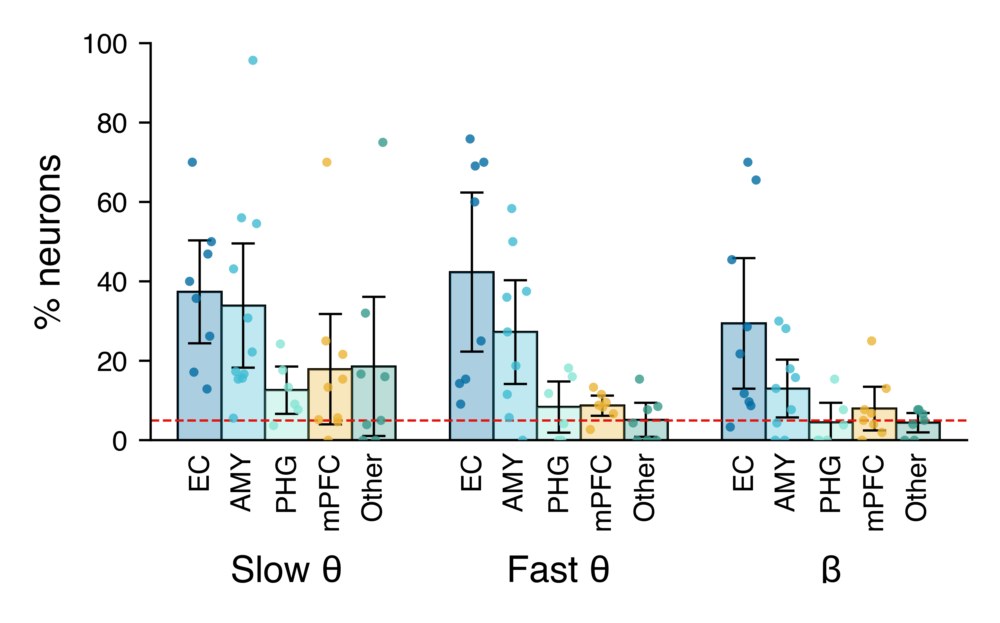

In [950]:
# Plot phase-locking percentage by band and region.
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 6, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 100
yticks = [0, 20, 40, 60, 80, 100]
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 3
palette = palettes['economist'][:5]
bar_alpha = 0.33
errbar_color = co['k']
stripsize = 2
stripalpha = 0.8
jitter = 0.25
capsize = 2.5
keep_edges = ['ctx-hpc']
keep_bands = ['slow_theta', 'fast_theta', 'beta']
band_labs = ['Slow θ', 'Fast θ', 'β']
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
roi_labs = ['EC', 'AMY', 'PHG', 'mPFC', 'Other']
min_spikes = 50
min_units = 10

# ----------------------------
# Get the data.
band_sigs = []
for band in keep_bands:
    band_sigs.append(pl_mrls
                     .query("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})".format(keep_edges, band, min_spikes))
                     .groupby(['subj', 'edge', 'unit_roi_gen'], observed=True)
                     .agg({'unit': len,
                           '{}_sig'.format(band): np.nanmean})
                     .query("(unit>={})".format(min_units))
                     .rename(columns={'{}_sig'.format(band): 'sig'}))
    band_sigs[-1].insert(0, 'band', band)
band_sigs = pd.concat(band_sigs, axis=0)
band_sigs = band_sigs.reset_index()
band_sigs['sig'] *= 100

dat = band_sigs.query("(edge=={}) & (band=={})".format(keep_edges, keep_bands)).copy()
dat['edge'] = band_sigs['edge'].astype(str)
dat['band'] = band_sigs['band'].astype(pd.CategoricalDtype(keep_bands, ordered=True))
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))
mean_dat = (dat
            .groupby(['band', 'unit_roi_gen'])
            .agg({'sig': [np.mean, stats.sem]}))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

# Add the Type 1 Error line.
_ax.axhline(5, lw=spine_lw, color=co['r'], ls='--')

# Add the bars.
_ax = sns.barplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
                  fill=False, lw=spine_lw, ec=errbar_color, ci=None)
_ax = sns.barplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
                  palette=palette, saturation=1, alpha=bar_alpha, lw=0, ci=None)

# Add the errorbars.
xoffsets = (np.arange(len(keep_rois)) - (len(keep_rois)/2) + 0.5) * (0.8 / len(keep_rois))
for iRoi, roi in enumerate(keep_rois):
    _ax.errorbar(np.arange(len(keep_bands)) + xoffsets[iRoi],
                 mean_dat.loc[(slice(None), roi), ('sig', 'mean')].values,
                 yerr=mean_dat.loc[(slice(None), roi), ('sig', 'sem')].values * 1.96,
                 ecolor=errbar_color, elinewidth=spine_lw, capsize=capsize,
                 capthick=spine_lw, linewidth=0)

# Plot the subject data points.
_ax = sns.stripplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
                    palette=palette, size=stripsize, linewidth=0,
                    alpha=stripalpha, dodge=True, jitter=jitter)

# Format the axis labels.
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(axis='x', which='major', labelsize=font['label'], pad=tickpad*10, length=0)
_ax.tick_params(axis='x', which='minor', rotation=90, labelsize=font['tick'], pad=tickpad, length=0)
_ax.tick_params(axis='y', labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.concatenate([xtick+xoffsets for xtick in np.arange(len(keep_bands))]), minor=True)
_ax.set_xticklabels(roi_labs*3, minor=True)
_ax.set_xticks(np.arange(len(keep_bands)), minor=False)
_ax.set_xticklabels(band_labs, minor=False)
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

# Save to file.
if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'ctx-hpc_pct-sig.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

mean: min = 4.1, max = 44.5
CI: min = 1.8, max = 50.8
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/ctx-hpc_pct-sig_across-1370-neurons.pdf


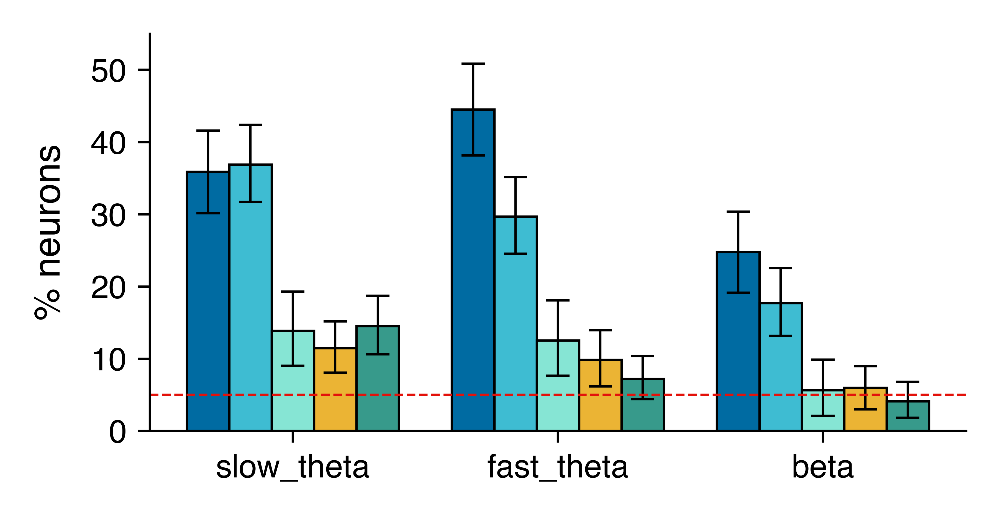

In [106]:
# Plot phase-locking percentage by band and region.
savefig = True
overwrite = False
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 55
yticks = [0, 10, 20, 30, 40, 50]  #[0, 20, 40, 60, 80, 100]
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
capsize = 2.5
palette = palettes['economist'][:5]
keep_edges = ['ctx-hpc']
keep_bands = ['slow_theta', 'fast_theta', 'beta']
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
min_spikes = 50
min_units = 5

# ----------------------------
# Get the data.
type1_err = 0.05
n_units = pd.concat([pl_mrls.query(("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})"
                            .format(keep_edges, band, min_spikes)))
                     for band in keep_bands])['subj_sess_unit'].unique().size
# band_sigs = []
# for band in keep_bands:
#     qry = ("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})"
#            .format(keep_edges, band, min_spikes))
#     band_sigs.append(pl_mrls
#                      .query(qry)
#                      .groupby(['edge', 'unit_roi_gen'], observed=True)
#                      .agg({'unit': len,
#                            '{}_sig'.format(band): [np.nanmean,
#                                                    lambda x: _bootstrap(x, np.nanmean, thresh=type1_err)]}))
#     band_sigs[-1].columns = ['unit', 'sig', 'bootstrap']
#     band_sigs[-1]['sig_95ci'] = band_sigs[-1]['bootstrap'].apply(lambda x: tuple(100 * np.array(x[0])))
#     band_sigs[-1]['sig_pval'] = band_sigs[-1]['bootstrap'].apply(lambda x: x[1])
#     band_sigs[-1].drop(columns=['bootstrap'], inplace=True)
#     band_sigs[-1].insert(0, 'band', band)
# band_sigs = pd.concat(band_sigs, axis=0)
# band_sigs = band_sigs.reset_index()
# band_sigs['sig'] *= 100

dat = band_sigs.query("(edge=={}) & (band=={})".format(keep_edges, keep_bands)).copy()
dat['edge'] = band_sigs['edge'].astype(str)
dat['band'] = band_sigs['band'].astype(pd.CategoricalDtype(keep_bands, ordered=True))
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))
dat = dat.sort_values(['band', 'unit_roi_gen']).reset_index(drop=True)
print('mean: min = {:.1f}, max = {:.1f}'.format(dat['sig'].min(), dat['sig'].max()))
print('CI: min = {:.1f}, max = {:.1f}'.format(dat['sig_95ci'].apply(lambda x: x[0]).min(), dat['sig_95ci'].apply(lambda x: x[1]).max()))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax.axhline(5, lw=spine_lw, color=co['r'], ls='--')
_ax = sns.barplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
                  palette=palette, saturation=1, alpha=bar_alpha, zorder=0,
                  lw=spine_lw, ec='k', ci=None)
xoffsets = (np.arange(len(keep_rois)) - (len(keep_rois)/2) + 0.5) * (0.8 / len(keep_rois))
for iRoi, roi in enumerate(keep_rois):
    _ax.errorbar(np.arange(len(keep_bands)) + xoffsets[iRoi],
                 dat.query("(unit_roi_gen=='{}')".format(roi))['sig'].values,
                 yerr=np.abs(dat.query("(unit_roi_gen=='{}')".format(roi))['sig'].values[None, :] - np.array(dat.query("(unit_roi_gen=='{}')".format(roi))['sig_95ci'].tolist()).T),
                 ecolor='k', elinewidth=spine_lw, capsize=capsize,
                 capthick=spine_lw, linewidth=0, zorder=2)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_bands)))
_ax.set_xticklabels(keep_bands, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig',
                       'ctx-hpc_pct-sig_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

1721 neurons
mean: min = 4.1, max = 55.0
CI: min = 1.8, max = 60.2
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/hpc-local_ctx-hpc_pct-sig_across-1721-neurons.pdf


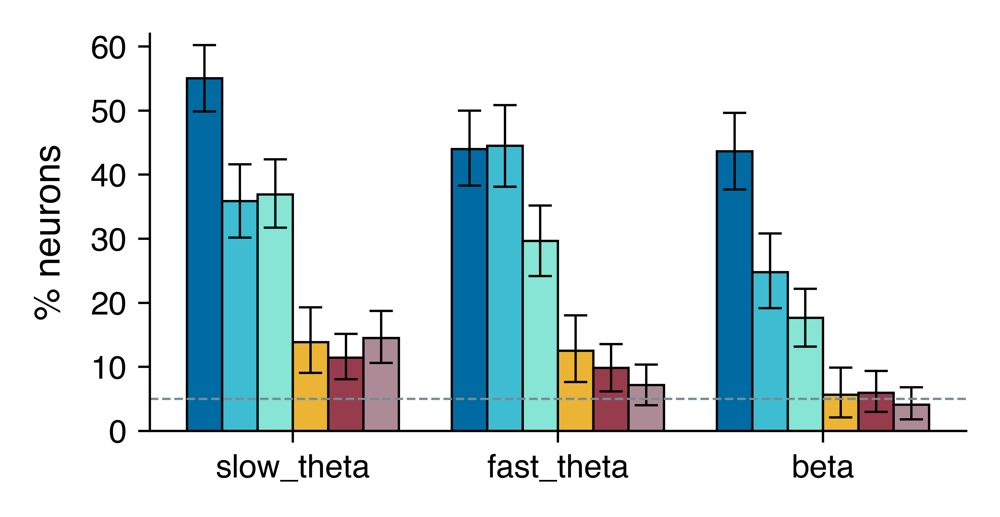

In [140]:
# Plot phase-locking percentage by band and region.
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 62
yticks = [0, 10, 20, 30, 40, 50, 60]
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
capsize = 2.5
hline_color = co['x3']
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
keep_edges = ['hpc-local', 'ctx-hpc']
keep_bands = ['slow_theta', 'fast_theta', 'beta']
keep_rois = ['HPC', 'EC', 'AMY', 'PHG', 'mPFC', 'O']
min_spikes = 50
min_units = 5

# ----------------------------
# Get the data.
n_units = pd.concat([pl_mrls.query(("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})"
                            .format(keep_edges, band, min_spikes)))
                     for band in keep_bands])['subj_sess_unit'].unique().size
print('{} neurons'.format(n_units))

# type1_err = 0.05
# band_sigs = []
# for band in keep_bands:
#     qry = ("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})"
#            .format(keep_edges, band, min_spikes))
#     band_sigs.append(pl_mrls
#                      .query(qry)
#                      .groupby(['edge', 'unit_roi_gen'], observed=True)
#                      .agg({'unit': len,
#                            '{}_sig'.format(band): [np.nanmean,
#                                                    lambda x: _bootstrap(x, np.nanmean, thresh=type1_err)]}))
#     band_sigs[-1].columns = ['unit', 'sig', 'bootstrap']
#     band_sigs[-1]['sig_95ci'] = band_sigs[-1]['bootstrap'].apply(lambda x: tuple(100 * np.array(x[0])))
#     band_sigs[-1]['sig_pval'] = band_sigs[-1]['bootstrap'].apply(lambda x: x[1])
#     band_sigs[-1].drop(columns=['bootstrap'], inplace=True)
#     band_sigs[-1].insert(0, 'band', band)
# band_sigs = pd.concat(band_sigs, axis=0)
# band_sigs = band_sigs.reset_index()
# band_sigs['sig'] *= 100

dat = band_sigs.query("(edge=={}) & (band=={})".format(keep_edges, keep_bands)).copy()
dat['edge'] = band_sigs['edge'].astype(str)
dat['band'] = band_sigs['band'].astype(pd.CategoricalDtype(keep_bands, ordered=True))
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))
dat = dat.sort_values(['band', 'unit_roi_gen']).reset_index(drop=True)
print('mean: min = {:.1f}, max = {:.1f}'.format(dat['sig'].min(), dat['sig'].max()))
print('CI: min = {:.1f}, max = {:.1f}'.format(dat['sig_95ci'].apply(lambda x: x[0]).min(), dat['sig_95ci'].apply(lambda x: x[1]).max()))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax.axhline(5, lw=spine_lw, color=hline_color, ls='--')
_ax = sns.barplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
                  palette=palette, saturation=1, alpha=bar_alpha, zorder=0,
                  lw=spine_lw, ec='k', ci=None)
xoffsets = (np.arange(len(keep_rois)) - (len(keep_rois)/2) + 0.5) * (0.8 / len(keep_rois))
for iRoi, roi in enumerate(keep_rois):
    _ax.errorbar(np.arange(len(keep_bands)) + xoffsets[iRoi],
                 dat.query("(unit_roi_gen=='{}')".format(roi))['sig'].values,
                 yerr=np.abs(dat.query("(unit_roi_gen=='{}')".format(roi))['sig'].values[None, :] - np.array(dat.query("(unit_roi_gen=='{}')".format(roi))['sig_95ci'].tolist()).T),
                 ecolor='k', elinewidth=spine_lw, capsize=capsize,
                 capthick=spine_lw, linewidth=0, zorder=2)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_bands)))
_ax.set_xticklabels(keep_bands, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig',
                       'hpc-local_ctx-hpc_pct-sig_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

In [1057]:
# Perform mult comp correction.
pl_mrls.drop(columns=[col for col in list(set(['pval_fdr', 'sig_fdr']) & set(pl_mrls.columns))], inplace=True)
pl_mrls.insert(pl_mrls.columns.tolist().index('sig')+1, 'pval_fdr', np.nan)
pl_mrls.insert(pl_mrls.columns.tolist().index('sig')+2, 'sig_fdr', np.nan)

qry = ("(max_n_spikes_mask>={})".format(min_spikes))
for (edge, same_hem, unit_roi_gen), df in pl_mrls.query(qry).groupby(['edge', 'same_hem', 'unit_roi_gen'], observed=True):
    sig_fdr, pval_fdr, *_ = sm.stats.multipletests(df['pval'], alpha=alpha, method='fdr_tsbky')
    pl_mrls.loc[df.index, 'pval_fdr'] = pval_fdr
    pl_mrls.loc[df.index, 'sig_fdr'] = sig_fdr

In [885]:
alpha = 0.05
n_boot = 15000
method_boot = 'bca'
ci_output = 'lowhigh'
seed = None
keep_edges = ['hpc-local', 'ctx-hpc', 'ctx-local']
sig_col = 'sig'

#  -------------------------
timer = Timer()

def _compfunc(sample_stat,
              alpha=0.05):
    return sample_stat <= alpha

print('min_spikes = {}, sig_col = {}'.format(min_spikes, sig_col), end='\n'*2)
qry = ("(edge=={}) & (same_hem==True) & (max_n_spikes_mask>={})"
       .format(keep_edges, min_spikes))
for (edge, unit_roi_gen), df in pl_mrls.query(qry).groupby(['edge', 'unit_roi_gen'], observed=True):
    n = len(df)
    n_sig  = df[sig_col].sum()
    mean_sig = df[sig_col].mean()
    if mean_sig > 0:
        ci, samp = boot.ci(df[sig_col].values.astype(bool),
                           statfunction=np.mean,
                           alpha=alpha,
                           n_samples=n_boot,
                           method=method_boot,
                           output=ci_output,                 
                           seed=seed,
                           return_dist=True,
                           use_numba=True)
        mean_samp = np.mean(samp)
        pval = boot.pval(df[sig_col].values.astype(bool),
                         statfunction=np.mean,
                         compfunction=_compfunc,
                         n_samples=n_boot,
                         seed=seed)
    else:
        ci = np.array((0.0, 0.0))
        mean_samp = 0.0
        pval = 1.0

    print('{}, {:>7}: sig = {}/{}, {:.1%} (samp_mean = {:.1%}, CI = {:.1%}-{:.1%}, P = {})'
          .format(edge, unit_roi_gen, n_sig, n, mean_sig, mean_samp, ci[0], ci[1], pval))
    
print()
print(timer)

min_spikes = 200, sig_col = sig

ctx-hpc,      EC: sig = 95/188, 50.5% (samp_mean = 50.6%, CI = 43.1%-56.9%, P = 0.0)
ctx-hpc,       A: sig = 99/199, 49.7% (samp_mean = 49.8%, CI = 42.2%-56.3%, P = 0.0)
ctx-hpc, PHG-FSG: sig = 14/104, 13.5% (samp_mean = 13.5%, CI = 6.7%-20.2%, P = 0.004)
ctx-hpc,    mPFC: sig = 23/184, 12.5% (samp_mean = 12.5%, CI = 7.6%-17.4%, P = 0.0005333333333333334)
ctx-hpc,       O: sig = 31/202, 15.3% (samp_mean = 15.4%, CI = 10.4%-20.3%, P = 0.0)
ctx-local,      EC: sig = 99/194, 51.0% (samp_mean = 51.0%, CI = 43.3%-57.2%, P = 0.0)
ctx-local,       A: sig = 139/220, 63.2% (samp_mean = 63.1%, CI = 55.9%-69.1%, P = 0.0)
ctx-local, PHG-FSG: sig = 53/112, 47.3% (samp_mean = 47.3%, CI = 37.5%-55.4%, P = 0.0)
ctx-local,    mPFC: sig = 63/216, 29.2% (samp_mean = 29.2%, CI = 22.7%-35.2%, P = 0.0)
ctx-local,       O: sig = 131/221, 59.3% (samp_mean = 59.3%, CI = 52.0%-65.2%, P = 0.0)
hpc-local,     HPC: sig = 142/198, 71.7% (samp_mean = 71.7%, CI = 64.6%-77.3%, P = 0.0)

In [886]:
alpha = 0.05
n_boot = 15000
method_boot = 'bca'
ci_output = 'lowhigh'
seed = None
keep_edges = ['hpc-local', 'ctx-hpc', 'ctx-local']
# min_spikes = 100
sig_col = 'sig_fdr'

#  -------------------------
timer = Timer()

def _compfunc(sample_stat,
              alpha=0):
    return sample_stat <= alpha

print('min_spikes = {}, sig_col = {}'.format(min_spikes, sig_col), end='\n'*2)
qry = ("(edge=={}) & (same_hem==True) & (max_n_spikes_mask>={})"
       .format(keep_edges, min_spikes))
for (edge, unit_roi_gen), df in pl_mrls.query(qry).groupby(['edge', 'unit_roi_gen'], observed=True):
    n = len(df)
    n_sig  = df[sig_col].sum()
    mean_sig = df[sig_col].mean()
    if mean_sig > 0:
        ci, samp = boot.ci(df[sig_col].values.astype(bool),
                           statfunction=np.mean,
                           alpha=alpha,
                           n_samples=n_boot,
                           method=method_boot,
                           output=ci_output,                 
                           seed=seed,
                           return_dist=True,
                           use_numba=True)
        mean_samp = np.mean(samp)
        pval = boot.pval(df[sig_col].values.astype(bool),
                         statfunction=np.mean,
                         compfunction=_compfunc,
                         n_samples=n_boot,
                         seed=seed)
    else:
        ci = np.array((0.0, 0.0))
        mean_samp = 0.0
        pval = 1.0

    print('{}, {:>7}: sig = {}/{}, {:.1%} (samp_mean = {:.1%}, CI = {:.1%}-{:.1%}, P = {})'
          .format(edge, unit_roi_gen, n_sig, n, mean_sig, mean_samp, ci[0], ci[1], pval))
    
print()
print(timer)

min_spikes = 200, sig_col = sig_fdr

ctx-hpc,      EC: sig = 90/188, 47.9% (samp_mean = 47.8%, CI = 40.4%-54.3%, P = 0.0)
ctx-hpc,       A: sig = 91/199, 45.7% (samp_mean = 45.8%, CI = 38.2%-52.3%, P = 0.0)
ctx-hpc, PHG-FSG: sig = 0/104, 0.0% (samp_mean = 0.0%, CI = 0.0%-0.0%, P = 1.0)
ctx-hpc,    mPFC: sig = 5/184, 2.7% (samp_mean = 2.7%, CI = 0.5%-5.4%, P = 0.005933333333333333)
ctx-hpc,       O: sig = 9/202, 4.5% (samp_mean = 4.4%, CI = 2.0%-7.4%, P = 0.00013333333333333334)
ctx-local,      EC: sig = 97/194, 50.0% (samp_mean = 50.0%, CI = 42.3%-56.7%, P = 0.0)
ctx-local,       A: sig = 142/220, 64.5% (samp_mean = 64.5%, CI = 57.7%-70.0%, P = 0.0)
ctx-local, PHG-FSG: sig = 50/112, 44.6% (samp_mean = 44.7%, CI = 34.8%-53.6%, P = 0.0)
ctx-local,    mPFC: sig = 49/216, 22.7% (samp_mean = 22.7%, CI = 17.1%-28.2%, P = 0.0)
ctx-local,       O: sig = 133/221, 60.2% (samp_mean = 60.2%, CI = 52.9%-66.1%, P = 0.0)
hpc-local,     HPC: sig = 161/198, 81.3% (samp_mean = 81.3%, CI = 74.7%-85.9%, P

min = -2.1, max = 10.3


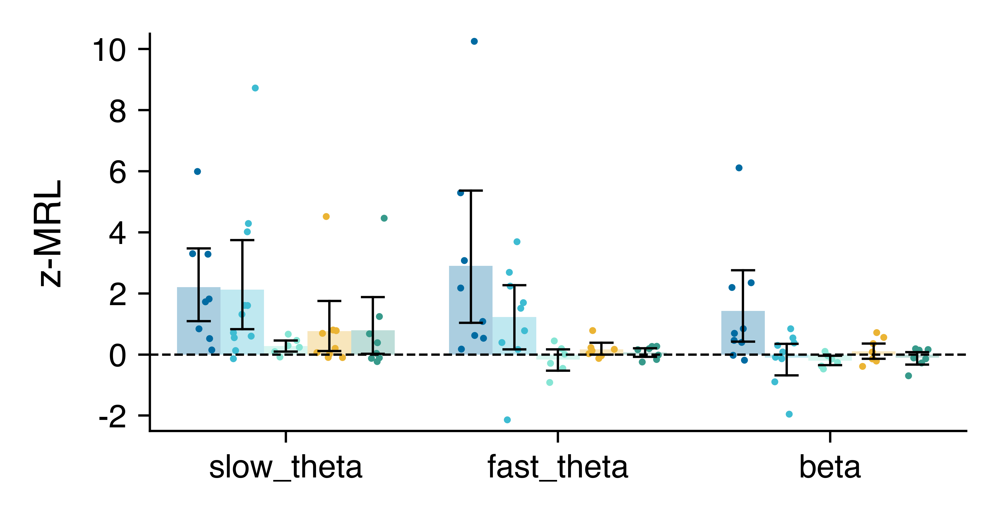

In [866]:
# Plot phase-locking strength by band and region.
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = -2.5
ymax = 10.5
yticks = [-2, 0, 2, 4, 6, 8, 10]
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 0.33
stripsize = 1.5
jitter = 0.25
palette = palettes['economist'][:5]
savefig = 0
overwrite = 0

keep_bands = ['slow_theta', 'fast_theta', 'beta']
keep_rois = gen_rois
keep_edges = ['ctx-local', 'ctx-hpc', 'hpc-local']
min_spikes = 50
min_units = 10

# --------------------
band_mrls = []
mean_band_mrls = []
for band in bands:
    band_mrls.append(pl_mrls
                     .query("(edge=={}) & (same_hem==True) & ({}_n_spikes_mask>={})".format(keep_edges, band, min_spikes))
                     .groupby(['subj', 'edge', 'unit_roi_gen'], observed=True)
                     .agg({'unit': len,
                           '{}_z_mrl'.format(band): np.nanmean})
                     .query("(unit>={})".format(min_units))
                     .rename(columns={'{}_z_mrl'.format(band): 'z_mrl'}))
    band_mrls[-1].insert(0, 'band', band)
    
band_mrls = pd.concat(band_mrls, axis=0)
band_mrls = band_mrls.reset_index()
band_mrls['edge'] = band_mrls['edge'].astype(pd.CategoricalDtype(['hpc-local', 'ctx-hpc', 'ctx-local'], ordered=True))
band_mrls['band'] = band_mrls['band'].astype(pd.CategoricalDtype(list(bands.keys()), ordered=True))

mean_band_mrls = (band_mrls
                  .reset_index()
                  .groupby(['band', 'edge', 'unit_roi_gen'], observed=True)
                  .agg({'subj': len,
                        'z_mrl': [np.mean, stats.sem]}))

dat = band_mrls.query("(edge=='ctx-hpc') & (band=={})".format(keep_bands)).copy()
dat['edge'] = band_mrls['edge'].astype(str)
dat['band'] = band_mrls['band'].astype(pd.CategoricalDtype(keep_bands, ordered=True))
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))
print('min = {:.1f}, max = {:.1f}'.format(dat['z_mrl'].min(), dat['z_mrl'].max()))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax.axhline(0, lw=spine_lw, color='k', ls='--')
_ax = sns.barplot(x='band', y='z_mrl', hue='unit_roi_gen', data=dat, ax=_ax,
                  palette=palette, saturation=1, alpha=bar_alpha, zorder=0,
                  ci=95, seed=0, errcolor='k', errwidth=spine_lw, capsize=0.08)
_ax = sns.stripplot(x='band', y='z_mrl', hue='unit_roi_gen', data=dat, ax=_ax,
                    palette=palette, size=stripsize, alpha=1, dodge=True, jitter=jitter, zorder=1)
# _ax.errorbar(np.arange(mean_corrs['level'].unique().size), mean_corrs.groupby('level')['value'].mean().values,
#                  yerr=mean_corrs.groupby('level')['value'].apply(lambda x: stats.sem(x)).values,
#                  ecolor='k', elinewidth=spine_lw, capsize=5, capthick=spine_lw, linewidth=0, zorder=2)
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_bands)))
_ax.set_xticklabels(keep_bands, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join(proj_dir, 'figs', 'plot_navigation2', 
                       'time_vs_place_cell_corrs-{}time_cells-{}place_cells-{}units.pdf'
                       .format(len(time_cell_corrs),len(place_cell_corrs), len(all_cells)))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        fig.savefig(filename.replace('pdf', 'png'), format='png', dpi=dpi, bbox_inches='tight', pad_inches=0)
        
fig.show()

1789 neurons
1789 neurons
min = 11.0, max = 51.8
CI: min = 7.4, max = 56.7


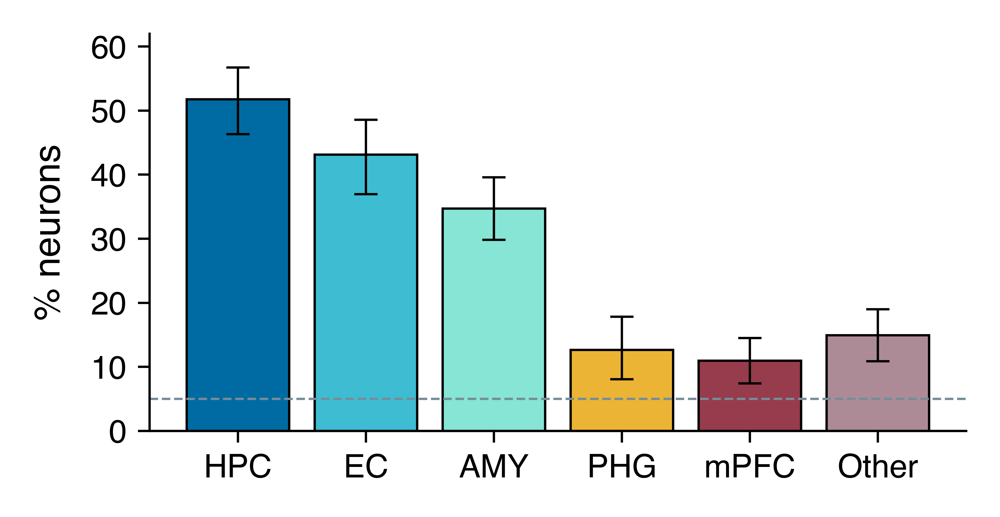

In [843]:
# # Plot phase-locking percentage by region for the max phase-locking frequency.
# savefig = 0
# overwrite = 0
# figsize = (colws[2], colws[2]*0.5)
# dpi = 1200
# font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
# ymin = 0
# ymax = 62
# yticks = [0, 10, 20, 30, 40, 50, 60]
# spine_lw = 0.5
# ticklen = 2.5
# tickpad = 2.5
# labelpad = 5
# bar_alpha = 1
# stripsize = 1.5
# jitter = 0.25
# capsize = 2.5
# hline_color = co['x3']
# palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
# keep_edges = ['hpc-local', 'ctx-hpc']
# keep_bands = ['max']
# keep_rois = ['HPC', 'EC', 'AMY', 'PHG', 'mPFC', 'O']
# xticklabs = ['HPC', 'EC', 'AMY', 'PHG', 'mPFC', 'Other']
# # min_spikes = 50
# sig_col = 'sig'

# # ----------------------------
# def _get_ci(data):
#     alpha = 0.05
#     n_boot = 15000
#     method_boot = 'bca'
#     ci_output = 'lowhigh'
    
#     if np.sum(data) > 0:
#         ci = boot.ci(data.values.astype(bool),
#                      statfunction=np.mean,
#                      alpha=alpha,
#                      n_samples=n_boot,
#                      method=method_boot,
#                      output=ci_output,                 
#                      return_dist=False,
#                      use_numba=True)
#     else:
#         ci = np.array([0.0, 0.0])

#     return list(ci * 100)

# # Get the data.
# n_units = pl_mrls.query(("(edge=={}) & (same_hem==True) & (max_n_spikes_mask>={})"
#                          .format(keep_edges, min_spikes)))['subj_sess_unit'].unique().size
# print('{} neurons'.format(n_units))

# # Get the data.
# n_units = pl_mrls.query(("(edge=={}) & (same_hem==True) & (max_n_spikes_mask>={})"
#                          .format(keep_edges, min_spikes)))['subj_sess_unit'].unique().size
# print('{} neurons'.format(n_units))

# band_sigs = []
# qry = ("(edge=={}) & (same_hem==True) & (max_n_spikes_mask>={})"
#        .format(keep_edges, min_spikes))
# band_sigs = (pl_mrls
#              .query(qry)
#              .groupby(['edge', 'unit_roi_gen'], observed=True)
#              .agg({'unit': len,
#                    'sig': [lambda x: 100 * np.mean(x), _get_ci]}))
# band_sigs.columns = ['unit', 'sig', 'ci']
# band_sigs.insert(0, 'band', 'max')
# band_sigs = band_sigs.reset_index()

# dat = band_sigs.query("(edge=={}) & (band=={})".format(keep_edges, keep_bands)).copy()
# dat['edge'] = band_sigs['edge'].astype(str)
# dat['band'] = band_sigs['band'].astype(pd.CategoricalDtype(keep_bands, ordered=True))
# dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))
# dat = dat.sort_values(['band', 'unit_roi_gen']).reset_index(drop=True)
# print('min = {:.1f}, max = {:.1f}'.format(dat['sig'].min(), dat['sig'].max()))
# print('CI: min = {:.1f}, max = {:.1f}'.format(dat['ci'].apply(lambda x: x[0]).min(),
#                                               dat['ci'].apply(lambda x: x[1]).max()))

# # Make the plot.
# plt.close()
# sns.set_context(rc={'patch.linewidth': spine_lw})
# fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
# ax = np.ravel(ax)

# iax = 0
# _ax = ax[iax]
# _ax.axhline(5, lw=spine_lw, color=hline_color, ls='--')
# _ax = sns.barplot(x='unit_roi_gen', y='sig', data=dat, ax=_ax,
#                   palette=palette, saturation=1, alpha=bar_alpha, zorder=0,
#                   ci=None, lw=spine_lw, ec='k',)
# # _ax = sns.stripplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
# #                     palette=palette, size=stripsize, linewidth=spine_lw/2,
# #                     alpha=1, dodge=True, jitter=jitter, zorder=1)
# xoffsets = np.arange(len(keep_rois))
# _ax.errorbar(np.arange(len(keep_rois)),
#              dat['sig'].values,
#              yerr=np.abs(dat['sig'].values[None, :] - np.array(dat['ci'].tolist()).T),
#              ecolor='k', elinewidth=spine_lw, capsize=capsize,
#              capthick=spine_lw, linewidth=0, zorder=2)
    
# for axis in ['left', 'bottom']:
#     _ax.spines[axis].set_linewidth(spine_lw)
# _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
# _ax.set_xticks(np.arange(len(keep_rois)))
# _ax.set_xticklabels(xticklabs, fontsize=font['tick'])
# _ax.set_xlabel('')
# _ax.set_ylim([ymin, ymax])
# _ax.set_yticks(yticks)
# _ax.set_yticklabels(yticks, fontsize=font['tick'])
# _ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
# if _ax.get_legend():
#     _ax.get_legend().remove()

# if savefig:
#     filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
#                        'figs2', 'pct_sig', 
#                        'hpc-local_ctx-hpc_max-freq_pct-sig_across-{}-neurons.pdf'.format(n_units))
#     if overwrite or not op.exists(filename):
#         fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
#         print('Saved {}'.format(filename))
        
# fig.show()

# Phase-locking sig bars

In [23]:
def bootstrap_pvals_multcomp(pvals,
                             n_resamples=15000,
                             confidence_level=0.95,
                             alpha=0.05,
                             method='fdr_tsbky',
                             return_sample=False):
    """Percentile bootstrap the prop. of pvals < alpha after mult. comp. correction."""
    n_obs = len(pvals)
    sample_stats = np.array([
        np.mean(
            sm.stats.multipletests(
                np.random.choice(pvals, n_obs, replace=True),
                alpha=alpha,
                method=method
            )[0]
        )
        for _ in range(n_resamples)])

    q = 100 * np.array((0.5 - (confidence_level/2), 0.5 + (confidence_level/2)))
    conf_int = np.percentile(sample_stats, q)
    
    output = od([])
    output['ci'] = conf_int
    if return_sample:
        output['sample'] = sample_stats
        
    return output

In [24]:
timer = Timer()

roi_sigs = []
roi_sigs = (pl_mrls
             .groupby(['unit_roi_gen', 'is_local'], observed=True)
             .agg({'unit': len,
                   'sig_fdr': lambda x: 100 * np.mean(x),
                   'pval': lambda x: list(100 * bootstrap_pvals_multcomp(x, n_resamples=15000)['ci'])})
             .sort_values(['unit_roi_gen', 'is_local'], ascending=[True, False])
             .rename(columns={'pval': 'ci'})
             .reset_index())
print(timer)

roi_sigs

Ran in 47.3s


,unit_roi_gen,is_local,unit,sig_fdr,ci
0,HPC,True,334,58.682635,"[50.29940119760479, 66.1676646706587]"
1,EC,True,304,40.460526,"[32.89473684210527, 47.368421052631575]"
2,EC,False,260,41.153846,"[35.0, 50.38461538461539]"
3,AMY,True,366,46.174863,"[40.16393442622951, 51.91256830601093]"
4,AMY,False,335,28.955224,"[23.283582089552237, 37.61194029850746]"
5,OFC,True,167,15.568862,"[8.982035928143713, 24.550898203592812]"
6,OFC,False,157,3.184713,"[0.6369426751592357, 8.9171974522293]"
7,PHG,True,182,23.626374,"[16.483516483516482, 31.868131868131865]"
8,PHG,False,166,1.204819,"[0.0, 3.0120481927710845]"
9,ACC,True,125,5.600000,"[0.8, 16.0]"


1485 neurons
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/hpc-local_ctx-hpc_max-freq_pct-sig-fdr_across-1485-neurons.pdf


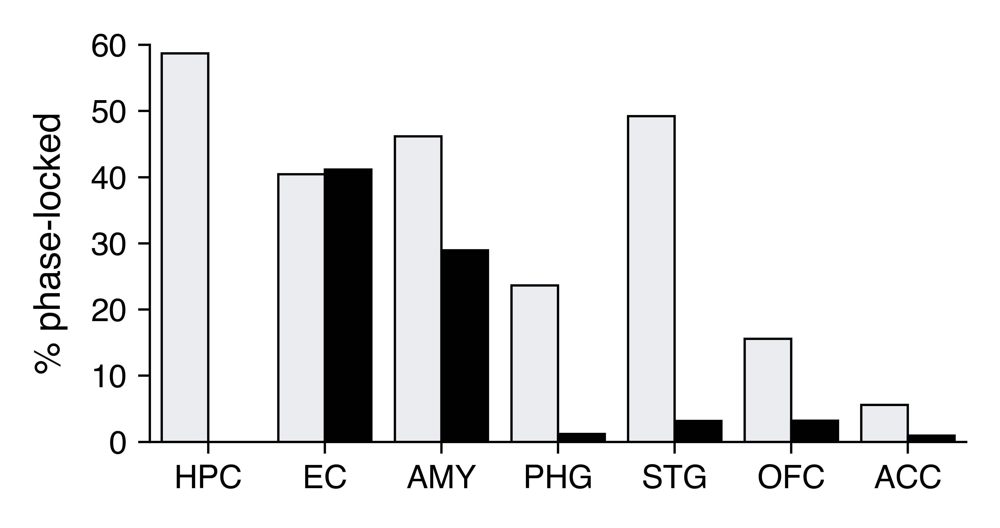

In [46]:
# Plot phase-locking percentage by region for the max phase-locking frequency.
savefig = 0
overwrite = 1
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 60
yticks = [0, 10, 20, 30, 40, 50, 60]
bar_lw = 0.5
ebar_lw = 0.75
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
plot_err = False
capsize = 2.5
palette = [co['x1'], co['k']]
keep_edges = ['hpc-local', 'ctx-hpc']
keep_bands = ['max']
# keep_rois = ['HPC', 'EC', 'AMY', 'OFC', 'PHG', 'ACC', 'STG']
keep_rois = ['HPC', 'EC', 'AMY', 'PHG', 'STG', 'OFC', 'ACC']
xticklabs = keep_rois
sig_col = 'sig_fdr'
is_local = [1, 0]

# ----------------------------
# Get the data.
n_units = pl_mrls.query("(edge=={})".format(keep_edges))['subj_sess_unit'].nunique()
print('{} neurons'.format(n_units))

dat = roi_sigs.query("(unit_roi_gen=={})".format(keep_rois)).copy()
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

_ax = sns.barplot(x='unit_roi_gen', y='sig_fdr', hue='is_local',
                  order=keep_rois, hue_order=is_local,
                  data=dat, ax=_ax, palette=palette, saturation=1, alpha=bar_alpha,
                  ci=None, lw=bar_lw, ec='k')
# _ax = sns.stripplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
#                     palette=palette, size=stripsize, linewidth=spine_lw/2,
#                     alpha=1, dodge=True, jitter=jitter, zorder=1)
if plot_err:
    for iBar, locality in enumerate(is_local):
        _dat = dat.query("(is_local=={})".format(locality))
        xoffsets = [keep_rois.index(roi) + ((iBar - 0.5) * (0.8 / 2)) for roi in _dat['unit_roi_gen']]
        _ax.errorbar(xoffsets,
                     _dat['sig_fdr'].values,
                     yerr=np.abs(_dat['sig_fdr'].values[None, :] - np.array(_dat['ci'].tolist()).T),
                     lw=0, ecolor='k', elinewidth=ebar_lw, capthick=ebar_lw, capsize=capsize)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_rois)))
_ax.set_xticklabels(xticklabs, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('% phase-locked', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'hpc-local_ctx-hpc_max-freq_pct-sig-fdr_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

1151 neurons
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/ctx-hpc_max-freq_pct-sig-fdr_across-1151-neurons.pdf


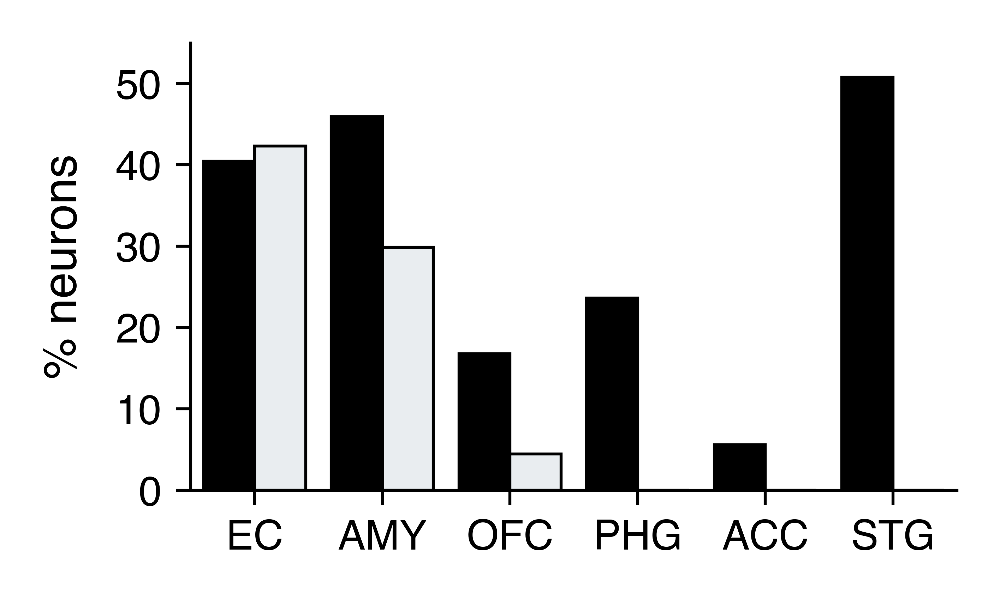

In [3243]:
# Plot phase-locking percentage by region for the max phase-locking frequency.
savefig = 0
overwrite = 1
figsize = (colws[1]*1.5, colws[1]*1.5*0.6)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 55
yticks = [0, 10, 20, 30, 40, 50]
bar_lw = 0.5
ebar_lw = 0.75
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
plot_err = False
capsize = 2.5
palette = [co['k'], co['x1']]
keep_edges = ['ctx-hpc']
keep_bands = ['max']
# keep_rois = [roi for roi in gen_rois if (roi!='HPC')] #['EC', 'AMY', 'OFC', 'PHG', 'AC', 'STG'] #
keep_rois = ['EC', 'AMY', 'OFC', 'PHG', 'ACC', 'STG']
# keep_rois = ['ACC', 'AMY', 'EC', 'OFC', 'PHG', 'STG']
xticklabs = keep_rois
sig_col = 'sig_fdr'
is_local = [1, 0]

# ----------------------------
# Get the data.
n_units = pl_mrls.query("(edge=={})".format(keep_edges))['subj_sess_unit'].nunique()
print('{} neurons'.format(n_units))

dat = roi_sigs.query("(unit_roi_gen=={})".format(keep_rois)).copy()
dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(pd.CategoricalDtype(keep_rois, ordered=True))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

_ax = sns.barplot(x='unit_roi_gen', y='sig_fdr', hue='is_local',
                  order=keep_rois, hue_order=is_local,
                  data=dat, ax=_ax, palette=palette, saturation=1, alpha=bar_alpha,
                  ci=None, lw=bar_lw, ec='k')
# _ax = sns.stripplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
#                     palette=palette, size=stripsize, linewidth=spine_lw/2,
#                     alpha=1, dodge=True, jitter=jitter, zorder=1)
if plot_err:
    for iBar, locality in enumerate(is_local):
        _dat = dat.query("(is_local=={})".format(locality))
        xoffsets = [keep_rois.index(roi) + ((iBar - 0.5) * (0.8 / 2)) for roi in _dat['unit_roi_gen']]
        _ax.errorbar(xoffsets,
                     _dat['sig_fdr'].values,
                     yerr=np.abs(_dat['sig_fdr'].values[None, :] - np.array(_dat['ci'].tolist()).T),
                     lw=0, ecolor='k', elinewidth=ebar_lw, capthick=ebar_lw, capsize=capsize)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_rois)))
_ax.set_xticklabels(xticklabs, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'ctx-hpc_max-freq_pct-sig-fdr_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

In [1470]:
# Plot phase-locking percentage by region for the max phase-locking frequency.
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 7.5
yticks = [0, 1, 2, 3, 4, 5, 6, 7]
bar_lw = 0.5
ebar_lw = 0.75
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
plot_err = False
capsize = 2.5
palette = [co['x3'], co['x1']]
keep_edges = ['ctx-hpc']
keep_bands = ['max']
keep_rois = gen_rois #[roi for roi in gen_rois if (roi!='HPC')]
xticklabs = keep_rois
sig_col = 'sig_fdr'
is_local = [1, 0]

# ----------------------------
# Get the data.
n_units = pl_mrls.query("(edge=={})".format(keep_edges))['subj_sess_unit'].nunique()
print('{} neurons'.format(n_units))

dat = roi_zmax_zmrl.query("(unit_roi_gen=={})".format(keep_rois)).copy()

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

_ax = sns.barplot(x='unit_roi_gen', y='mean_zmax_zmrl', hue='is_local',
                  order=keep_rois, hue_order=is_local,
                  data=dat, ax=_ax, palette=palette, saturation=1, alpha=bar_alpha,
                  ci=None, lw=bar_lw, ec='k')
if plot_err:
    for iBar, locality in enumerate(is_local):
        _dat = dat.query("(is_local=={})".format(locality))
        xoffsets = [keep_rois.index(roi) + ((iBar - 0.5) * (0.8 / 2)) for roi in _dat['unit_roi_gen']]
        _ax.errorbar(xoffsets,
                     _dat['mean_zmax_zmrl'].values,
                     yerr=np.abs(_dat['mean_zmax_zmrl'].values[None, :] - np.array(_dat['ci_zmax_zmrl'].tolist()).T),
                     lw=0, ecolor='k', elinewidth=ebar_lw, capthick=ebar_lw, capsize=capsize)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_rois)))
_ax.set_xticklabels(xticklabs, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('Max phase-locking (z)', fontsize=font['label'], labelpad=labelpad)
# if _ax.get_legend():
#     _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'hpc-local_ctx-hpc_max-freq_pct-sig_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

is_local  unit_roi_gen
False     EC                 [2.8639664635552617, 4.31601196782737]
          AMY              [1.9444413743721096, 3.1318372229373925]
          PHG              [0.1062371288674501, 0.5508691280031697]
          STG             [0.07707219936401082, 0.5556710410704726]
          OFC              [0.1906899008847056, 0.7920750204524406]
          ACC              [0.10722912806311087, 0.599795089490503]
True      HPC                [4.764724395470655, 7.023548502683973]
          EC                [2.6422990563087407, 4.228322274046192]
          AMY                [3.3862567830618575, 4.71303267494163]
          PHG               [2.6681568219024863, 5.480868928763756]
          STG                [4.039010506864163, 7.285009303689409]
          OFC               [1.1470383729880704, 3.253903685372407]
          ACC               [0.5274302805532027, 3.292638298311502]
Name: zmax_zmrl, dtype: object

In [3216]:
def _get_zmax_zmrl(mrls,
                   null_mrls,
                   mean_mrls_null,
                   std_mrls_null):
    """Return z-scored version of the maximum z-MRL."""
    mrls = np.array(mrls)
    null_mrls = np.array(null_mrls)
    mean_mrls_null = np.array(mean_mrls_null)
    std_mrls_null = np.array(std_mrls_null)
    
    zmrls = (mrls - mean_mrls_null) / std_mrls_null
    zmrls_null = (null_mrls - mean_mrls_null[None, :]) / std_mrls_null[None, :]
    
    max_zmrl = np.nanmax(zmrls)
    max_zmrls_null = np.nanmax(zmrls_null, axis=1)
    
    zmax_zmrl = (max_zmrl - np.nanmean(max_zmrls_null)) / np.nanstd(max_zmrls_null)
    
    return zmax_zmrl
    
pl_mrls.drop(columns=[col for col in ['zmax_zmrl'] if col in pl_mrls.columns], inplace=True)
pl_mrls.insert(pl_mrls.columns.tolist().index('max_z_mrl'),
               'zmax_zmrl',
               pl_mrls.apply(lambda x: _get_zmax_zmrl(x['mrls'],
                                                      x['mrls_null'],
                                                      x['mean_mrls_null'],
                                                      x['std_mrls_null']), axis=1))

In [3217]:
def bootstrap_ci(data,
                 statfunction=np.mean,
                 alpha = 0.05,
                 n_boot = 15000,
                 method_boot = 'bca',
                 ci_output = 'lowhigh'):
    
    ci = boot.ci(data.values,
                 statfunction=np.mean,
                 alpha=alpha,
                 n_samples=n_boot,
                 method=method_boot,
                 output=ci_output,                 
                 return_dist=False,
                 use_numba=True)
    
    return list(ci)

In [3220]:
timer = Timer()

roi_zmax_zmrl = []
roi_zmax_zmrl = (pl_mrls
             .groupby(['unit_roi_gen', 'is_local'], observed=True)
             .agg({'unit': len,
                   'sig_fdr': lambda x: 100 * np.mean(x),
                   'zmax_zmrl': [np.mean, stats.sem, lambda x: bootstrap_ci(x)]})
             .sort_values(['unit_roi_gen', 'is_local'], ascending=[True, False])
             .reset_index())
roi_zmax_zmrl.columns = ['unit_roi_gen', 'is_local', 'unit', 'sig_fdr', 'mean_zmax_zmrl', 'sem_zmax_zmrl', 'ci_zmax_zmrl']
roi_zmax_zmrl['sem_zmax_zmrl'] = roi_zmax_zmrl.apply(lambda x: [x['mean_zmax_zmrl'] - x['sem_zmax_zmrl'],
                                                                x['mean_zmax_zmrl'] + x['sem_zmax_zmrl']],
                                                     axis=1)

print(timer)
roi_zmax_zmrl

Ran in 0.3s


,unit_roi_gen,is_local,unit,sig_fdr,mean_zmax_zmrl,sem_zmax_zmrl,ci_zmax_zmrl
0,HPC,True,334,58.383234,5.766225,"[5.197570930317188, 6.334879233316529]","[4.749133792610077, 7.044814526604088]"
1,HPC,False,860,17.558140,1.114603,"[1.00545930752067, 1.2237461220223462]","[0.9152924849731818, 1.3433776852446417]"
2,EC,True,304,40.460526,3.260693,"[2.872496387408745, 3.6488892692077552]","[2.6184854927506724, 4.210313414093352]"
3,EC,False,952,17.436975,1.518019,"[1.3921006772381503, 1.6439375608021651]","[1.2966581358843838, 1.7954004509366162]"
4,AMY,True,366,45.901639,3.994868,"[3.6606381076000454, 4.329097548149781]","[3.38205724432153, 4.710031165634418]"
5,AMY,False,1124,19.039146,1.476497,"[1.3555970702123679, 1.5973965208040788]","[1.2620058112672086, 1.7324212090134505]"
6,OFC,True,167,16.766467,1.940104,"[1.4251912312240946, 2.4550168353067914]","[1.125862134615629, 3.2185693928452914]"
7,OFC,False,522,3.256705,0.426321,"[0.32814677192350367, 0.5244944760611809]","[0.26191801891273836, 0.6439747765195076]"
8,PHG,True,182,23.626374,3.815470,"[3.1140108843646725, 4.516929265105417]","[2.6730427162767363, 5.498188013628061]"
9,PHG,False,516,0.387597,0.127182,"[0.06602918725531524, 0.18833405268451314]","[0.015110813302014756, 0.2570282899931476]"


1151 neurons


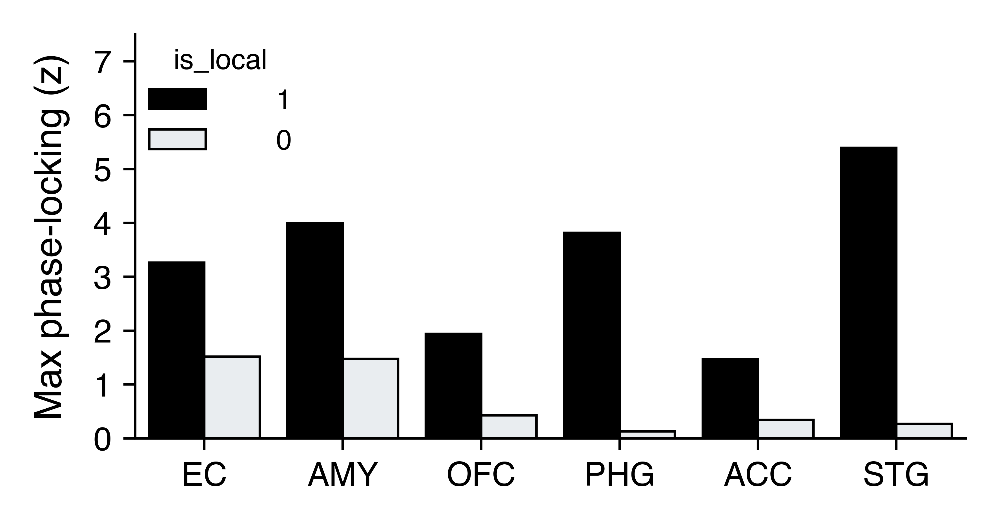

In [3224]:
# Plot phase-locking percentage by region for the max phase-locking frequency.
savefig = 0
overwrite = 0
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 7, 'label': 8, 'fig': 10, 'annot': 7}
ymin = 0
ymax = 7.5
yticks = [0, 1, 2, 3, 4, 5, 6, 7]
bar_lw = 0.5
ebar_lw = 0.75
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
plot_err = False
err_col = 'sem_zmax_zmrl' # 'ci_zmax_zmrl'
capsize = 2.5
palette = [co['k'], co['x1']]
keep_edges = ['ctx-hpc']
keep_bands = ['max']
keep_rois = [roi for roi in gen_rois if (roi!='HPC')]
xticklabs = keep_rois
sig_col = 'sig_fdr'
is_local = [1, 0]

# ----------------------------
# Get the data.
n_units = pl_mrls.query("(edge=={})".format(keep_edges))['subj_sess_unit'].nunique()
print('{} neurons'.format(n_units))

dat = roi_zmax_zmrl.query("(unit_roi_gen=={})".format(keep_rois)).copy()

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

_ax = sns.barplot(x='unit_roi_gen', y='mean_zmax_zmrl', hue='is_local',
                  order=keep_rois, hue_order=is_local,
                  data=dat, ax=_ax, palette=palette, saturation=1, alpha=bar_alpha,
                  ci=None, lw=bar_lw, ec='k')
if plot_err:
    for iBar, locality in enumerate(is_local):
        _dat = dat.query("(is_local=={})".format(locality))
        xoffsets = [keep_rois.index(roi) + ((iBar - 0.5) * (0.8 / 2)) for roi in _dat['unit_roi_gen']]
        _ax.errorbar(xoffsets,
                     _dat['mean_zmax_zmrl'].values,
                     yerr=np.abs(_dat['mean_zmax_zmrl'].values[None, :] - np.array(_dat[err_col].tolist()).T),
                     lw=0, ecolor='k', elinewidth=ebar_lw, capthick=ebar_lw, capsize=capsize)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_rois)))
_ax.set_xticklabels(xticklabs, fontsize=font['tick'])
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_ylabel('Max phase-locking (z)', fontsize=font['label'], labelpad=labelpad)
# if _ax.get_legend():
#     _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'hpc-local_ctx-hpc_max-freq_pct-sig_across-{}-neurons.pdf'.format(n_units))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

In [3153]:
dat = (pl_mrls
       .groupby(['unit_roi_gen', 'lfp_roi_gen'])
       .agg({'subj_sess_unit': lambda x: np.unique(x).size,
             'sig_fdr': lambda x: 100 * np.mean(x)})
       .loc[keep_pairs]
       .sort_values(['unit_roi_gen', 'lfp_roi_gen'])
       .reset_index())
dat.insert(2, 'lfp_roi_num', [1, 2, 3] * 3)
dat.insert([''])

,unit_roi_gen,lfp_roi_gen,lfp_roi_num,subj_sess_unit,sig_fdr
0,EC,HPC,1,260,42.307692
1,EC,AMY,2,197,19.796954
2,EC,OFC,3,139,2.877698
3,AMY,HPC,1,335,29.850746
4,AMY,EC,2,257,21.789883
5,AMY,OFC,3,181,12.707182
6,OFC,HPC,1,157,4.458599
7,OFC,EC,2,108,0.000000
8,OFC,AMY,3,135,0.000000


Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/pct_sig/HPC-EC-AMY-OFC_nested-sig-fdr-bars.pdf


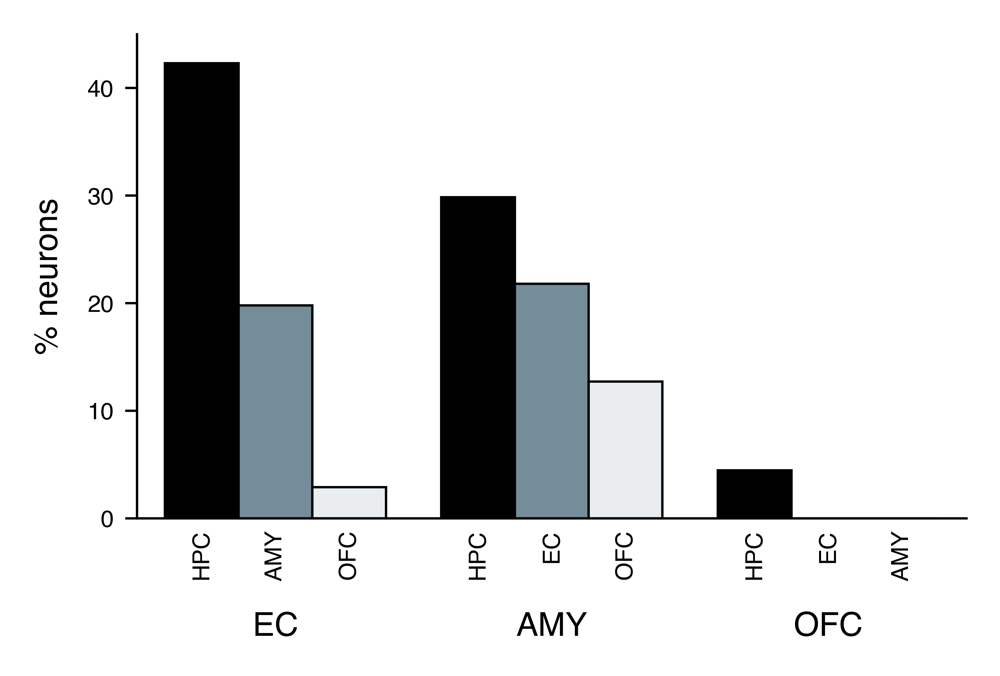

In [3210]:
# Plot phase-locking percentage by region for the max phase-locking frequency.
keep_pairs = [
    ('EC', 'HPC'),
    ('EC', 'AMY'),
    ('EC', 'OFC'),
    ('AMY', 'HPC'),
    ('AMY', 'EC'),
    ('AMY', 'OFC'),
    ('OFC', 'HPC'),
    ('OFC', 'EC'),
    ('OFC', 'AMY')
]
savefig = 1
overwrite = 0
figsize = (colws[2], colws[2]*0.6)
dpi = 1200
font = {'tick': 5, 'label': 7, 'fig': 8, 'annot': 5}
ymin = 0
ymax = 45
yticks = [0, 10, 20, 30, 40]
yticklabs = yticks
bar_lw = 0.5
ebar_lw = 0.75
spine_lw = 0.5
ticklen = 2.5
tickpad = 2.5
labelpad = 5
bar_alpha = 1
stripsize = 1.5
jitter = 0.25
plot_err = False
capsize = 2.5
palette = ['k', co['x3'], co['x1'], co['c']]
keep_unit_rois = pd.unique([x[0] for x in keep_pairs]).tolist()
keep_lfp_rois = pd.unique([x[1] for x in keep_pairs]).tolist()
xticklabs = keep_unit_rois
sig_col = 'sig_fdr'

# ----------------------------
# Get the data.
dat = (pl_mrls
       .groupby(['unit_roi_gen', 'lfp_roi_gen'])
       .agg({'subj_sess_unit': lambda x: np.unique(x).size,
             'sig_fdr': lambda x: 100 * np.mean(x)})
       .loc[keep_pairs]
       .sort_values(['unit_roi_gen', 'lfp_roi_gen'])
       .reset_index())
dat.insert(2, 'lfp_roi_num', [1, 2, 3] * 3)

# dat['unit_roi_gen'] = dat['unit_roi_gen'].astype(str)#pd.CategoricalDtype(keep_unit_rois, ordered=True))
# dat['lfp_roi_gen'] = dat['lfp_roi_gen'].astype(str)#pd.CategoricalDtype(keep_unit_rois, ordered=True))

# Make the plot.
plt.close()
sns.set_context(rc={'patch.linewidth': spine_lw})
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

_ax = sns.barplot(x='unit_roi_gen', y='sig_fdr', hue='lfp_roi_num', data=dat, ax=_ax,
                  order=keep_unit_rois, hue_order=[1, 2, 3],
                  palette=palette, saturation=1, alpha=bar_alpha, dodge=True,
                  ci=None, lw=bar_lw, ec='k')
# _ax = sns.stripplot(x='band', y='sig', hue='unit_roi_gen', data=dat, ax=_ax,
#                     palette=palette, size=stripsize, linewidth=spine_lw/2,
#                     alpha=1, dodge=True, jitter=jitter, zorder=1)
if plot_err:
    for iBar, locality in enumerate(is_local):
        _dat = dat.query("(is_local=={})".format(locality))
        xoffsets = [keep_rois.index(roi) + ((iBar - 0.5) * (0.8 / 2)) for roi in _dat['unit_roi_gen']]
        _ax.errorbar(xoffsets,
                     _dat['sig_fdr'].values,
                     yerr=np.abs(_dat['sig_fdr'].values[None, :] - np.array(_dat['ci'].tolist()).T),
                     lw=0, ecolor='k', elinewidth=ebar_lw, capthick=ebar_lw, capsize=capsize)
    
for axis in ['left', 'bottom']:
    _ax.spines[axis].set_linewidth(spine_lw)
_ax.tick_params(axis='x', which='major', labelsize=font['label'], pad=tickpad*8, length=0)
_ax.tick_params(axis='x', which='minor', labelsize=font['tick'], pad=tickpad, length=0, rotation=90)
_ax.tick_params(axis='y', labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xticks(np.arange(len(keep_unit_rois)), minor=False)
_ax.set_xticklabels(xticklabs, minor=False)
offsets = np.concatenate([x + np.array([-0.8/len(keep_unit_rois), 0, 0.8/len(keep_unit_rois)])
                          for x in range(len(keep_unit_rois))])
_ax.set_xticks(offsets, minor=True)
_ax.set_xticklabels(dat['lfp_roi_gen'], minor=True)
_ax.set_xlabel('')
_ax.set_ylim([ymin, ymax])
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs, fontsize=font['tick'])
_ax.set_ylabel('% neurons', fontsize=font['label'], labelpad=labelpad)
if _ax.get_legend():
    _ax.get_legend().remove()

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'HPC-EC-AMY-OFC_nested-sig-fdr-bars.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

# z-MRL by freq: region means

In [48]:
min_units_per_subj = 3

qry = "(mask=='{}')".format(mask)
subj_zmrls = (pl_mrls
              .query(qry)
              .groupby(['unit_roi_gen', 'lfp_roi_gen', 'subj'], observed=True)
              .agg({'subj_sess_unit': lambda x: np.unique(x).size,
                    'z_mrls': lambda x: np.nanmean(list(x), axis=0).tolist()})
              .query("(subj_sess_unit>={})".format(min_units_per_subj))
              .reset_index()
              .groupby(['unit_roi_gen', 'lfp_roi_gen'], observed=True)
              .agg({'subj': len,
                    'subj_sess_unit': [np.sum,
                                       lambda x: list(np.sort(x))],
                    'z_mrls': [lambda x: np.nanmean(np.array(list(x)), axis=0).tolist(),
                               lambda y: stats.sem(np.array(list(y)), axis=0, nan_policy='omit').tolist()]
                   }))
subj_zmrls.columns = ['subjs', 'units', 'units_per_subj', 'mean_zmrls', 'sem_zmrls']
subj_zmrls.head()

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Mean of empty slice
  


subjs  units  \
unit_roi_gen lfp_roi_gen                 
HPC          HPC             22    327   
EC           HPC             14    257   
             EC              16    301   
AMY          HPC             20    331   
             AMY             22    364   

                                                             units_per_subj  \
unit_roi_gen lfp_roi_gen                                                      
HPC          HPC          [3, 4, 6, 7, 7, 8, 8, 9, 9, 11, 11, 13, 15, 15...   
EC           HPC          [3, 4, 6, 6, 7, 9, 10, 13, 27, 27, 30, 32, 41,...   
             EC           [3, 4, 5, 7, 9, 9, 10, 14, 16, 18, 27, 29, 30,...   
AMY          HPC          [3, 5, 5, 6, 6, 6, 8, 9, 11, 12, 12, 13, 16, 1...   
             AMY          [3, 4, 4, 5, 5, 5, 6, 7, 7, 9, 11, 12, 16, 17,...   

                                                                 mean_zmrls  \
unit_roi_gen lfp_roi_gen                                                      
HPC          HPC          [0.026282555812895583, 2.139549946251657, 2.54...   
EC           HPC          [0.1252486018816106, 1.6411505428803939, 2.633...   
             EC           [0.23517243041778785, 1.8421281993151708, 3.03...   
AMY          HPC          [0.13940752373641918, 2.2607577720533394, 2.25...   
             AMY          [0.3483237368506188, 2.258151401257946, 2.6654...   

                                                                  sem_zmrls  
unit_roi_gen lfp_roi_gen                                                     
HPC          HPC          [0.12965093429525837, 0.4789204052823513, 0.57...  
EC           HPC          [0.12264679109395045, 0.5012312636469569, 0.79...  
             EC           [0.11647384377729592, 0.4054633242658633, 1.04...  
AMY          HPC          [0.12742779875463264, 0.7099045001913784, 0.81...  
             AMY          [0.17936460782204877, 0.4893526661856554, 0.66...

In [49]:
sig_only = False
bands = od([('all', (1, 30)),
            ('slow_theta', (2, 4)),
            ('fast_theta', (6, 10)),
            ('beta', (14, 20))])
keep_rois = gen_rois #['HPC', 'AMY', 'EC', 'OFC']
keep_bands = ['all', 'slow_theta', 'fast_theta', 'beta']

# -----------------------------
n_units = (pl_mrls
           .groupby(['unit_roi_gen', 'lfp_roi_gen'])
           ['subj_sess_unit'].apply(lambda x: len(np.unique(x))))
n_pl_units = (pl_mrls
              .query("(sig_fdr==True)")
              .groupby(['unit_roi_gen', 'lfp_roi_gen'])
              ['subj_sess_unit'].apply(lambda x: len(np.unique(x))))

zmrls = []
for unit_roi in keep_rois:
    for lfp_roi in keep_rois:
        for band in keep_bands:
            low, high = bands[band]
            qry = ("(unit_roi_gen=='{}') & (lfp_roi_gen=='{}') & ({}<=max_z_mrl_freq<={})"
                   .format(unit_roi, lfp_roi, low, high))
            if sig_only:
                qry += " & (sig_fdr==True)"
            _zmrls = np.array(pl_mrls.query(qry)['z_mrls'].tolist())
            _n_subjs = pl_mrls.query(qry)['subj'].nunique()
            _n_units = _zmrls.shape[0]
            pct_units = 100 * (_n_units/n_units[(unit_roi, lfp_roi)])
            pct_pl_units = 100 * (_n_units/n_pl_units[(unit_roi, lfp_roi)])
            
            _mean_zmrls = np.nanmean(_zmrls, axis=0).tolist()
            _sem_zmrls = stats.sem(_zmrls, axis=0, nan_policy='omit').tolist()
            zmrls.append([unit_roi, lfp_roi, band, _n_subjs, _n_units,
                          pct_units, pct_pl_units, _mean_zmrls, _sem_zmrls, _zmrls.tolist()])
            
cols = ['unit_roi', 'lfp_roi', 'band', 'subjs', 'units',
        'pct_units', 'pct_pl_units', 'mean_zmrls', 'sem_zmrls', 'zmrls']
zmrls = pd.DataFrame(zmrls, columns=cols).set_index(['unit_roi', 'lfp_roi', 'band'])

print('sig_only = {}'.format(sig_only))
print('zmrls: {}'.format(zmrls.shape))

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: Mean of empty slice
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:234: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


sig_only = False
zmrls: (196, 7)


In [53]:
n_units = (pl_mrls
           .query("(mask=='all')")
           .groupby(['unit_roi_gen', 'lfp_roi_gen'], observed=True)
           .agg({
               'subj_sess_unit': lambda x: len(np.unique(x)),
               'subj': lambda x: np.sort(np.unique(x, return_counts=True)[1]).tolist()
           }))
n_units.columns = ['units', 'units_per_subj']
n_units.insert(0, 'subjs', n_units['units_per_subj'].apply(len))
n_units

subjs  units  \
unit_roi_gen lfp_roi_gen                 
HPC          HPC             26    334   
EC           HPC             17    260   
             EC              19    304   
AMY          HPC             22    335   
             AMY             23    366   
PHG          HPC             15    166   
             PHG             14    182   
STG          HPC              5    127   
             STG              5    126   
OFC          HPC             14    157   
             OFC             14    167   
ACC          HPC              7    106   
             ACC              8    125   

                                                             units_per_subj  
unit_roi_gen lfp_roi_gen                                                     
HPC          HPC          [1, 2, 2, 2, 3, 4, 6, 7, 7, 8, 8, 9, 9, 11, 11...  
EC           HPC          [1, 1, 1, 3, 4, 6, 6, 7, 9, 10, 13, 27, 27, 30...  
             EC           [1, 1, 1, 3, 4, 5, 7, 9, 9, 10, 14, 16, 18, 27...  
AMY          HPC          [2, 2, 3, 5, 5, 6, 6, 6, 8, 9, 11, 12, 12, 13,...  
             AMY          [2, 3, 4, 4, 5, 5, 5, 6, 7, 7, 9, 11, 12, 16, ...  
PHG          HPC          [1, 1, 2, 3, 4, 7, 7, 8, 9, 12, 15, 17, 21, 27...  
             PHG          [3, 3, 3, 4, 7, 8, 12, 15, 16, 17, 20, 21, 25,...  
STG          HPC                                         [2, 9, 21, 44, 51]  
             STG                                         [2, 8, 21, 47, 48]  
OFC          HPC              [1, 1, 1, 3, 7, 7, 7, 7, 8, 8, 9, 13, 31, 54]  
             OFC            [1, 1, 3, 7, 7, 7, 7, 8, 8, 10, 11, 14, 28, 55]  
ACC          HPC                                 [2, 4, 12, 15, 15, 27, 31]  
             ACC                              [1, 2, 4, 15, 16, 23, 31, 33]

In [133]:
print(pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (max_z_mrl_freq==1)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (2<=max_z_mrl_freq<=4)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (max_z_mrl_freq==5)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (6<=max_z_mrl_freq<=10)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (11<=max_z_mrl_freq<=13)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (14<=max_z_mrl_freq<=20)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True) & (21<=max_z_mrl_freq<=30)").shape[0],
      pl_mrls.query("(unit_roi_gen=='HPC') & (is_local==True) & (sig_fdr==True)").shape[0])

0 71 6 55 19 28 17 196


HPC to HPC: 327 neurons, 22 subjs, min=-0.10, max=3.90
ACC to HPC: 104 neurons,  6 subjs, min=-0.38, max=0.60
OFC to HPC: 154 neurons, 11 subjs, min=-0.39, max=1.00
STG to HPC: 125 neurons,  4 subjs, min=-0.27, max=0.65
PHG to HPC: 162 neurons, 12 subjs, min=-0.67, max=0.72
AMY to HPC: 331 neurons, 20 subjs, min=-0.60, max=3.19
 EC to HPC: 257 neurons, 14 subjs, min=-0.23, max=3.43


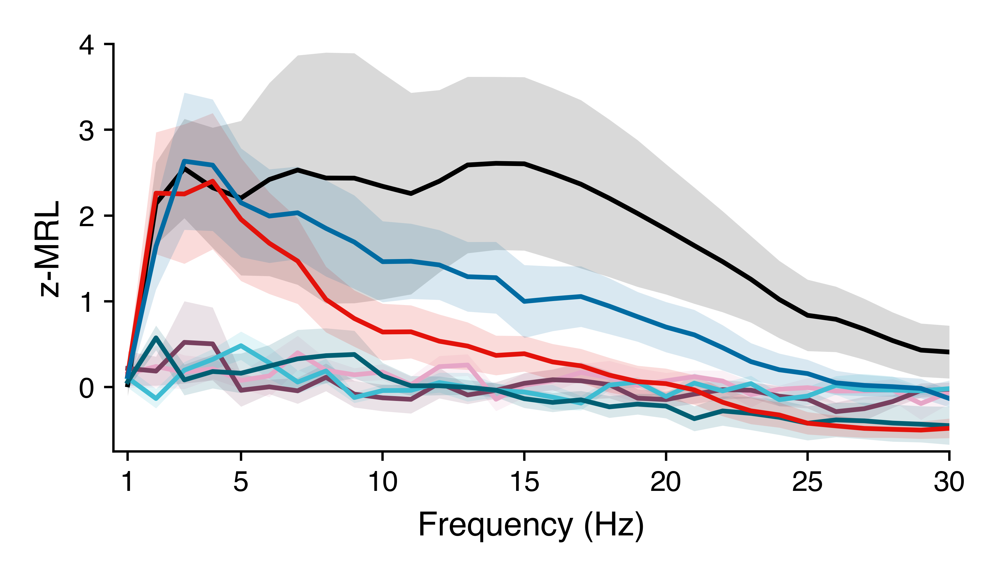

In [51]:
roi_pairs = [
    ('EC', 'HPC'),
    ('AMY', 'HPC'),
    ('PHG', 'HPC'),
    ('STG', 'HPC'),
    ('OFC', 'HPC'),
    ('ACC', 'HPC'),
    ('HPC', 'HPC'),
]
savefig = 0
overwrite = 1
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 3
ticklen = 2
tickpad = 2
xvals = np.arange(1, 31)
xlim = [0.5, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-0.75, 4)
yticks = [0, 1, 2, 3, 4]
yticklabs = yticks
lw = 1
# linecolor = {'HPC': co['r'],
#              'EC': co['b'],
#              'AMY': co['p6'],
#              'PHG': co['']
#              'OFC': co['c']}
linecolor = {'HPC': co['k'],
             'EC': co['b'],
             'AMY': co['r'],
             'PHG': co['c6'],
             'STG': co['c'],
             'OFC': co['p6'],
             'ACC': co['p2']}
linewidths = {'local': 1,
              'distal': 1}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw)

for unit_roi, lfp_roi in roi_pairs[::-1]:
    _means = np.array(subj_zmrls.at[(unit_roi, lfp_roi), 'mean_zmrls'])
    _sems = np.array(subj_zmrls.at[(unit_roi, lfp_roi), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi])
    _ax.plot(xvals, _means, lw=linewidths[locality], color=linecolor[unit_roi])
    
    print('{:>3} to {:>3}: {:>3} neurons, {:>2} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi,
                  lfp_roi,
                  subj_zmrls.at[(unit_roi, lfp_roi), 'units'],
                  subj_zmrls.at[(unit_roi, lfp_roi), 'subjs'],
                  np.nanmin(_means - _sems),
                  np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Frequency (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-sig-fdr-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}'
                                         .format(subj_zmrls.at[(unit_roi, lfp_roi), 'units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

HPC to HPC, 1-30Hz: 334 neurons, 26 subjs, min=-0.02, max=3.35
ACC to HPC, 1-30Hz: 106 neurons, 7 subjs, min=-0.26, max=0.47
OFC to HPC, 1-30Hz: 157 neurons, 14 subjs, min=-0.27, max=0.46
STG to HPC, 1-30Hz: 127 neurons, 5 subjs, min=-0.28, max=0.50
PHG to HPC, 1-30Hz: 166 neurons, 15 subjs, min=-0.40, max=0.58
AMY to HPC, 1-30Hz: 335 neurons, 22 subjs, min=-0.51, max=2.14
EC to HPC, 1-30Hz: 260 neurons, 17 subjs, min=-0.14, max=2.39
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/zMRL-by-freq_1-30Hz-sig-fdr-phase-locked_260EC-HPC_335AMY-HPC_166PHG-HPC_127STG-HPC_157OFC-HPC_106ACC-HPC_334HPC-local-neurons.pdf


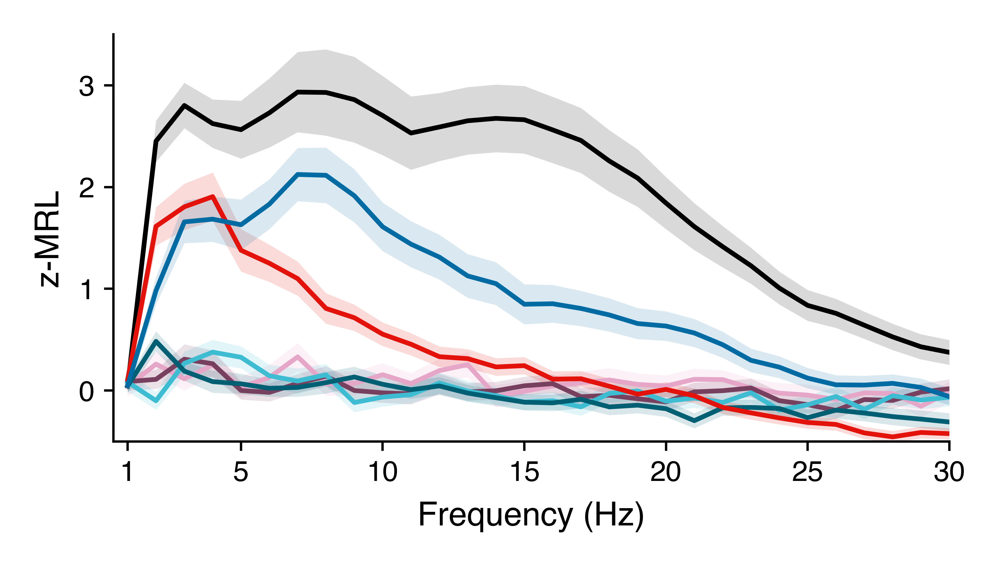

In [58]:
band = 'all'
roi_pairs = [
    ('EC', 'HPC'),
    ('AMY', 'HPC'),
    ('PHG', 'HPC'),
    ('STG', 'HPC'),
    ('OFC', 'HPC'),
    ('ACC', 'HPC'),
    ('HPC', 'HPC'),
]
savefig = 0
overwrite = 1
figsize = (colws[2], colws[2]*0.5)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 3
ticklen = 2
tickpad = 2
xvals = np.arange(1, 31)
xlim = [0.5, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-0.5, 3.5)
yticks = [0, 1, 2, 3]
yticklabs = yticks
lw = 1
# linecolor = {'HPC': co['r'],
#              'EC': co['b'],
#              'AMY': co['p6'],
#              'PHG': co['']
#              'OFC': co['c']}
linecolor = {'HPC': co['k'],
             'EC': co['b'],
             'AMY': co['r'],
             'PHG': co['c6'],
             'STG': co['c'],
             'OFC': co['p6'],
             'ACC': co['p2']}
linewidths = {'local': 1,
              'distal': 1}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

low, high = bands[band]

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw)

for unit_roi, lfp_roi in roi_pairs[::-1]:
    _means = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'mean_zmrls'])
    _sems = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi])
    _ax.plot(xvals, _means, lw=linewidths[locality], color=linecolor[unit_roi])
    
    print('{} to {}, {}-{}Hz: {} neurons, {} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi, lfp_roi, low, high,
                  zmrls.at[(unit_roi, lfp_roi, band), 'units'],
                  zmrls.at[(unit_roi, lfp_roi, band), 'subjs'],
                  np.nanmin(_means - _sems), np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Frequency (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-sig-fdr-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}{}-{}'
                                         .format(zmrls.at[(unit_roi, lfp_roi, band), 'units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

HPC to HPC, 1-30Hz: 334 neurons, 26 subjs, min=-0.02, max=3.35
OFC to HPC, 1-30Hz: 157 neurons, 14 subjs, min=-0.27, max=0.46
AMY to HPC, 1-30Hz: 335 neurons, 22 subjs, min=-0.51, max=2.14
EC to HPC, 1-30Hz: 260 neurons, 17 subjs, min=-0.14, max=2.39


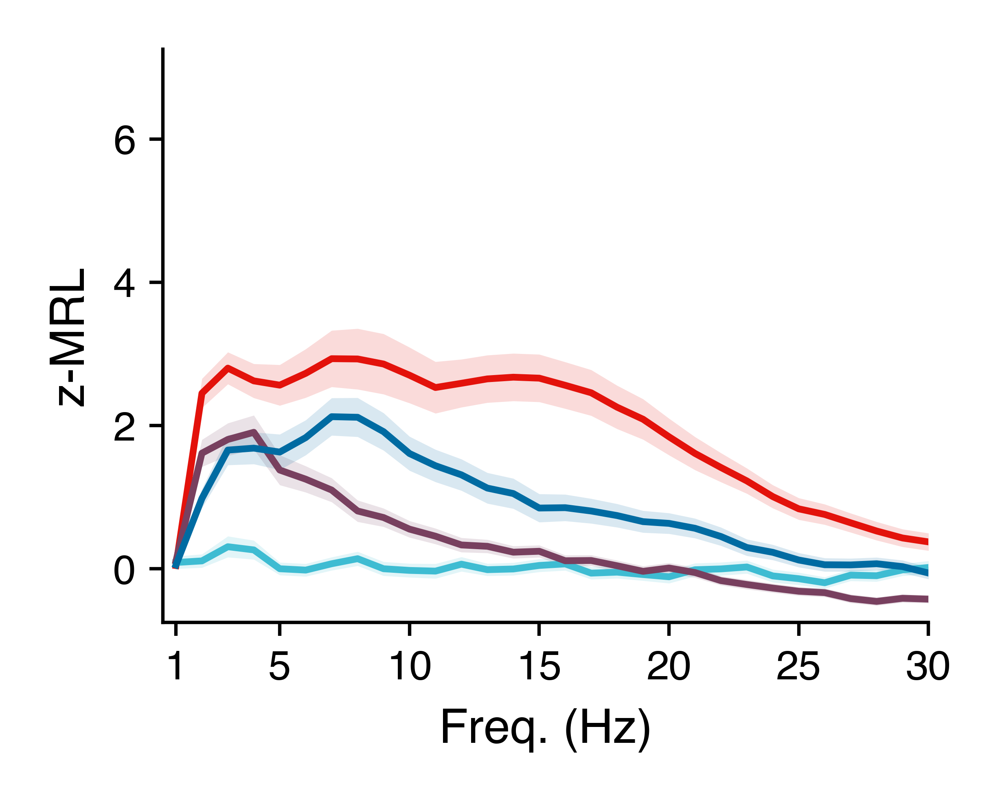

In [37]:
band = 'all'
roi_pairs = [
    ('HPC', 'HPC'),
#     ('OFC', 'OFC'),
    ('OFC', 'HPC'),
#     ('AMY', 'AMY'),
#     ('EC', 'EC'),
    ('AMY', 'HPC'),
    ('EC', 'HPC')
]
savefig = 0
overwrite = 1
figsize = (colws[1]*1.3, colws[1])
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 3
ticklen = 2
tickpad = 2
xvals = np.arange(1, 31)
xlim = [0.5, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-0.75, 7.25)
yticks = [0, 2, 4, 6]
yticklabs = yticks
lw = 1
linecolor = {'HPC': co['r'],
             'EC': co['b'],
             'AMY': co['p6'],
             'OFC': co['c']}
linewidths = {'local': 1,
              'distal': 1}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

low, high = bands[band]

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw, ls='--')

for unit_roi, lfp_roi in roi_pairs:
    _means = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'mean_zmrls'])
    _sems = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi])
    _ax.plot(xvals, _means, lw=linewidths[locality], color=linecolor[unit_roi])
    
    print('{} to {}, {}-{}Hz: {} neurons, {} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi, lfp_roi, low, high,
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_subjs'],
                  np.nanmin(_means - _sems), np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-sig-fdr-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}{}-{}'
                                         .format(zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

HPC to HPC, 2-4Hz: 70 neurons, 17 subjs, min=-0.30, max=6.40
AMY to AMY, 2-4Hz: 80 neurons, 19 subjs, min=-0.08, max=8.30
EC to EC, 2-4Hz: 37 neurons, 10 subjs, min=0.16, max=8.20
AMY to HPC, 2-4Hz: 60 neurons, 13 subjs, min=-0.65, max=7.93
EC to HPC, 2-4Hz: 37 neurons, 11 subjs, min=-0.59, max=7.60


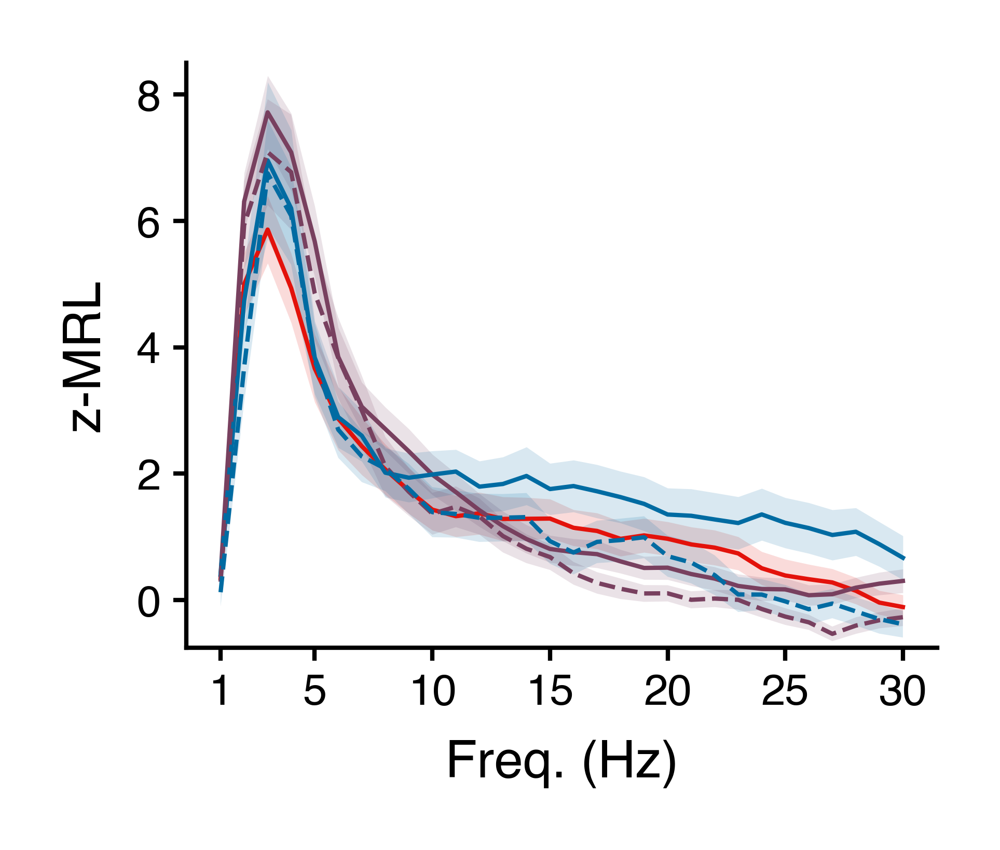

In [1810]:
band = 'slow_theta'
roi_pairs = [('HPC', 'HPC'),
             ('AMY', 'AMY'),
             ('EC', 'EC'),
             ('AMY', 'HPC'),
             ('EC', 'HPC')]
savefig = 0
overwrite = 0
figsize = (colws[1], colws[1]*0.8)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 8, 'annot': 5}
ax_linewidth = 0.5
labelpad = 3
ticklen = 1.5
tickpad = 1.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-0.75, 8.5)
yticks = [0, 2, 4, 6, 8]
# ylim = (0, 15.5)
# yticks = [0, 3, 6, 9, 12, 15]
yticklabs = yticks
lw = 0.5
linecolor = {'HPC': co['r'],
             'EC': co['b'],
             'AMY': co['p6']}
linestyle = {'local': '-',
             'distal': '--'}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

low, high = bands[band]

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw, ls='--')

for unit_roi, lfp_roi in roi_pairs:
    _means = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'mean_zmrls'])
    _sems = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi], linestyle=linestyle[locality])
    _ax.plot(xvals, _means, lw=lw, color=linecolor[unit_roi], linestyle=linestyle[locality])
    
    print('{} to {}, {}-{}Hz: {} neurons, {} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi, lfp_roi, low, high,
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_subjs'],
                  np.nanmin(_means - _sems), np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}{}-{}'
                                         .format(zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

HPC to HPC, 6-10Hz: 56 neurons, 12 subjs, min=-0.01, max=15.30
AMY to AMY, 6-10Hz: 23 neurons, 8 subjs, min=0.25, max=8.87
EC to EC, 6-10Hz: 53 neurons, 10 subjs, min=0.07, max=8.45
AMY to HPC, 6-10Hz: 17 neurons, 9 subjs, min=-0.60, max=7.73
EC to HPC, 6-10Hz: 45 neurons, 8 subjs, min=-0.06, max=7.56


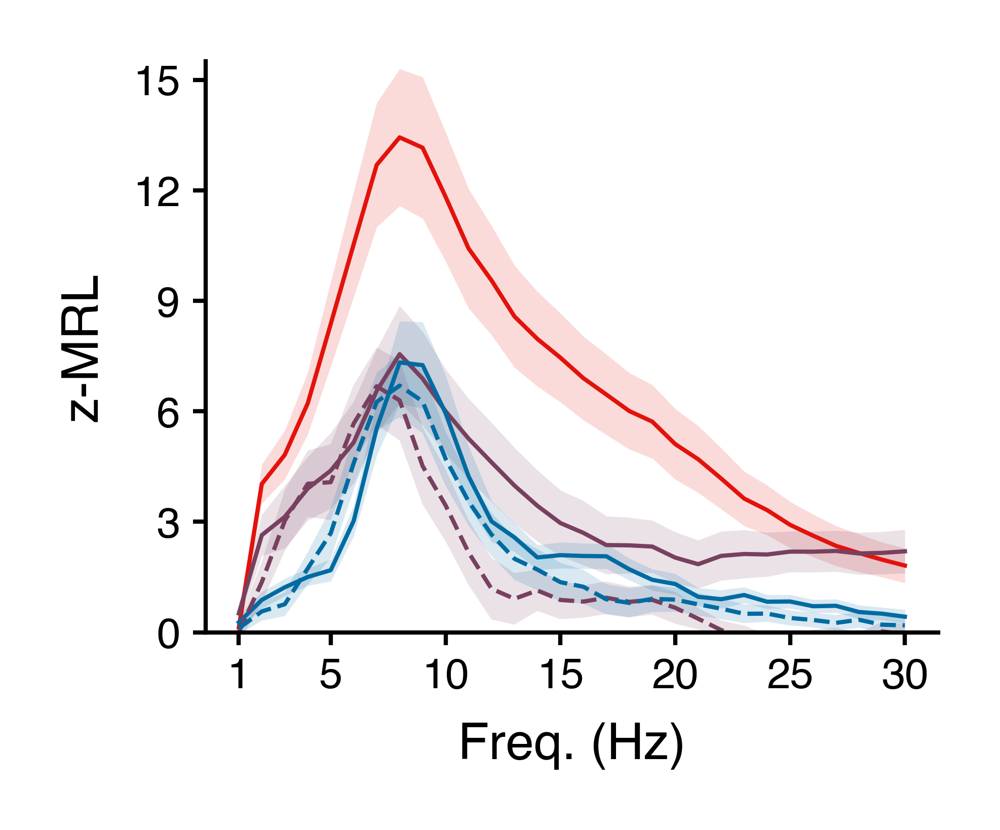

In [1812]:
band = 'fast_theta'
roi_pairs = [('HPC', 'HPC'),
             ('AMY', 'AMY'),
             ('EC', 'EC'),
             ('AMY', 'HPC'),
             ('EC', 'HPC')]
savefig = 0
overwrite = 0
figsize = (colws[1], colws[1]*0.8)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 8, 'annot': 5}
ax_linewidth = 0.5
labelpad = 3
ticklen = 1.5
tickpad = 1.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
# ylim = (-0.75, 8.5)
# yticks = [0, 2, 4, 6, 8]
ylim = (0, 15.5)
yticks = [0, 3, 6, 9, 12, 15]
yticklabs = yticks
lw = 0.5
linecolor = {'HPC': co['r'],
             'EC': co['b'],
             'AMY': co['p6']}
linestyle = {'local': '-',
             'distal': '--'}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

low, high = bands[band]

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw, ls='--')

for unit_roi, lfp_roi in roi_pairs:
    _means = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'mean_zmrls'])
    _sems = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi], linestyle=linestyle[locality])
    _ax.plot(xvals, _means, lw=lw, color=linecolor[unit_roi], linestyle=linestyle[locality])
    
    print('{} to {}, {}-{}Hz: {} neurons, {} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi, lfp_roi, low, high,
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_subjs'],
                  np.nanmin(_means - _sems), np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}{}-{}'
                                         .format(zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

AMY to HPC, 1-30Hz: 100 neurons, 18 subjs, min=-0.40, max=6.35
EC to HPC, 1-30Hz: 110 neurons, 14 subjs, min=-0.10, max=5.13
AMY to EC, 1-30Hz: 56 neurons, 15 subjs, min=-0.38, max=6.41
EC to AMY, 1-30Hz: 39 neurons, 9 subjs, min=-0.65, max=4.15


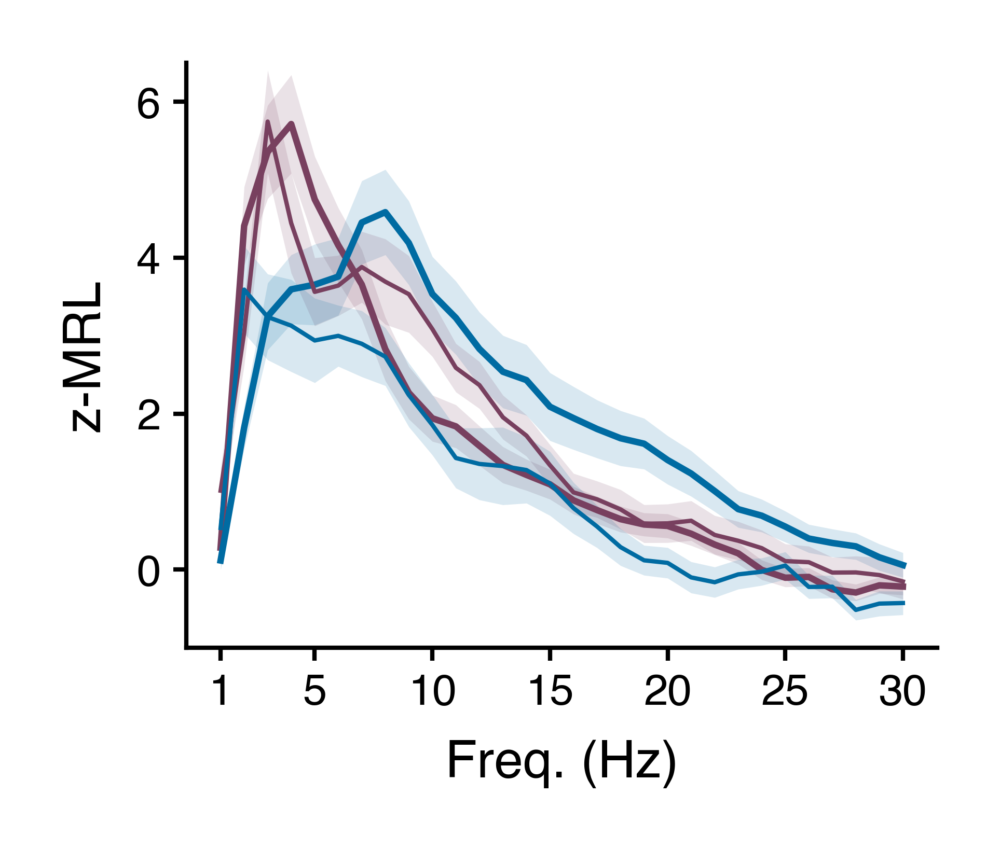

In [3052]:
band = 'all'
roi_pairs = [
    #('AMY', 'AMY'),
    #('EC', 'EC'),
    ('AMY', 'HPC'),
    ('EC', 'HPC'),
    ('AMY', 'EC'),
    ('EC', 'AMY')
]
savefig = 0
overwrite = 0
figsize = (colws[1], colws[1]*0.8)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 8, 'annot': 5}
ax_linewidth = 0.5
labelpad = 3
ticklen = 1.5
tickpad = 1.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-1, 6.5)
yticks = [0, 2, 4, 6]
yticklabs = yticks
lw = 0.5
linecolor = {'HPC': co['r'],
             'EC': co['b'],
             'AMY': co['p6']}
linewidths = {'local': 1,
              'HPC': 0.75,
              'Other': 0.5}
plot_hline = False
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

low, high = bands[band]

iax = 0
_ax = ax[iax]
if plot_hline:
    _ax.axhline(hline, color=hline_color, lw=spine_lw, ls='--')

for unit_roi, lfp_roi in roi_pairs:
    _means = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'mean_zmrls'])
    _sems = np.array(zmrls.at[(unit_roi, lfp_roi, band), 'sem_zmrls'])
    locality = 'local' if (unit_roi==lfp_roi) else 'distal'
    if locality == 'distal':
        locality = 'HPC' if (lfp_roi=='HPC') else 'Other'
    _ax.fill_between(xvals,
                     _means + _sems,
                     _means - _sems,
                     alpha=0.15, lw=0, color=linecolor[unit_roi])
    _ax.plot(xvals, _means, lw=linewidths[locality], color=linecolor[unit_roi])
    
    print('{} to {}, {}-{}Hz: {} neurons, {} subjs, min={:.2f}, max={:.2f}'
          .format(unit_roi, lfp_roi, low, high,
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                  zmrls.at[(unit_roi, lfp_roi, band), 'n_subjs'],
                  np.nanmin(_means - _sems), np.nanmax(_means + _sems)))
    
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_ylim(ylim)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticks, fontsize=font['tick'])
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'phase_lock_freqs', 
                       'zMRL-by-freq_{}-{}Hz-phase-locked_{}-neurons.pdf'
                       .format(low, high,
                               '_'.join(['{}{}-{}'
                                         .format(zmrls.at[(unit_roi, lfp_roi, band), 'n_units'],
                                                 unit_roi,
                                                 'local' if (unit_roi==lfp_roi) else lfp_roi)
                                         for (unit_roi, lfp_roi) in roi_pairs])))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

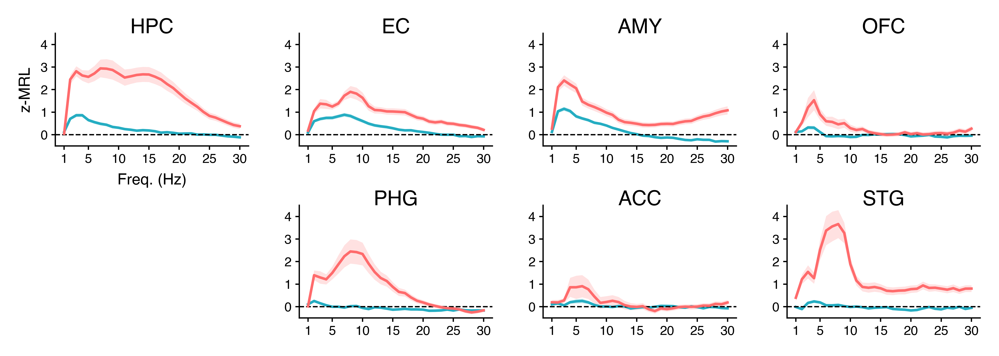

In [3208]:
figsize = (colws[2], colws[2])
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 8, 'annot': 5}
ax_linewidth = 0.5
labelpad = 3
ticklen = 1.5
tickpad = 1.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = [1, 5, 10, 15, 20, 25, 30]
xticklabs = xticks
ylim = (-0.5, 4.5)
yticks = [0, 1, 2, 3, 4]
yticklabs = yticks
roi_colors = {'HPC': co['r'],
              'EC': co['b'],
              'AMY': co['p5'],
              'OFC': co['g'],
              'PHG': co['c'],
              'ACC': co['lm'],
              'STG': co['y']}
_colors = {0: co['c3'],
           1: co['r3']}
keep_rois = gen_rois
plot_hline = True
hline = 0
hline_color = co['k']
plot_labels = False

# ------------------------------------
pl_means = (pl_mrls
#             .query("(sig_fdr==True)")
            .groupby(['unit_roi_gen', 'is_local'], observed=True)
            ['z_mrls'].apply(lambda x: [np.nanmean(list(x), axis=0),
                                        np.ma.masked_array(stats.sem(list(x), axis=0, nan_policy='omit')).data]))

# plt.close()
# fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
# ax = np.ravel(ax)

# grid_shp = [101, 50]
# figsize = (colws[2], colws[2] * (grid_shp[0]/grid_shp[1]))
# ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=20, colspan=50),
#       plt.subplot2grid(grid_shp, (27, 0), rowspan=20, colspan=20),
#       plt.subplot2grid(grid_shp, (27, 30), rowspan=20, colspan=20),
#       plt.subplot2grid(grid_shp, (54, 0), rowspan=20, colspan=20),
#       plt.subplot2grid(grid_shp, (54, 30), rowspan=20, colspan=20),
#       plt.subplot2grid(grid_shp, (81, 0), rowspan=20, colspan=20),
#       plt.subplot2grid(grid_shp, (81, 30), rowspan=20, colspan=20)]

grid_shp = [30, 95]
figsize = (colws[3], colws[3] * (grid_shp[0]/grid_shp[1]))

plt.close()
fig = plt.figure(figsize=figsize, dpi=dpi)
ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (0, 25), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (0, 50), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (0, 75), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (18, 25), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (18, 50), rowspan=12, colspan=20),
      plt.subplot2grid(grid_shp, (18, 75), rowspan=12, colspan=20)]

for iax, roi in enumerate(keep_rois):
    _ax = ax[iax]
    for locality in is_local:
        key = (roi, locality)
        if plot_hline:
            _ax.axhline(hline, color=hline_color, lw=spine_lw, ls='--')
        if key in pl_means:
            _ax.fill_between(xvals,
                             pl_means[key][0] + pl_means[key][1],
                             pl_means[key][0] - pl_means[key][1],
                             alpha=0.2, lw=0, color=_colors[locality])
            _ax.plot(xvals, pl_means[key][0],
                     lw=1, color=_colors[locality])
        for spine in ['left', 'bottom']:
            _ax.spines[spine].set_linewidth(ax_linewidth)
        _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
        _ax.set_xticks(xticks)
        _ax.set_xticklabels(xticklabs)
        _ax.set_ylim(ylim)
        _ax.set_yticks(yticks)
        _ax.set_yticklabels(yticks, fontsize=font['tick'])
        _ax.set_title(roi, fontsize=font['fig'], pad=0)
        if iax > 0:
#             _ax.set_xticklabels('')
#             _ax.set_yticklabels('')
            _ax.set_xlabel('')
            _ax.set_ylabel('')
        else:
            _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
            _ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)
            
fig.show()

# z-MRL by freq: heatmaps

hpc-local: 195 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_195HPC-neurons-to-HPC_heatmaps.pdf
hpc-local: 123 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_123EC-neurons-to-EC_heatmaps.pdf
hpc-local: 168 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_168AMY-neurons-to-AMY_heatmaps.pdf
hpc-local: 28 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_28OFC-neurons-to-OFC_heatmaps.pdf
hpc-local: 43 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_43PHG-neurons-to-PHG_heatmaps.pdf
hpc-local: 7 neurons, vmin=0.0, vmax=16.0
Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/phase_lock_freqs/all-sig-fdr_7ACC-neurons-to-ACC_hea

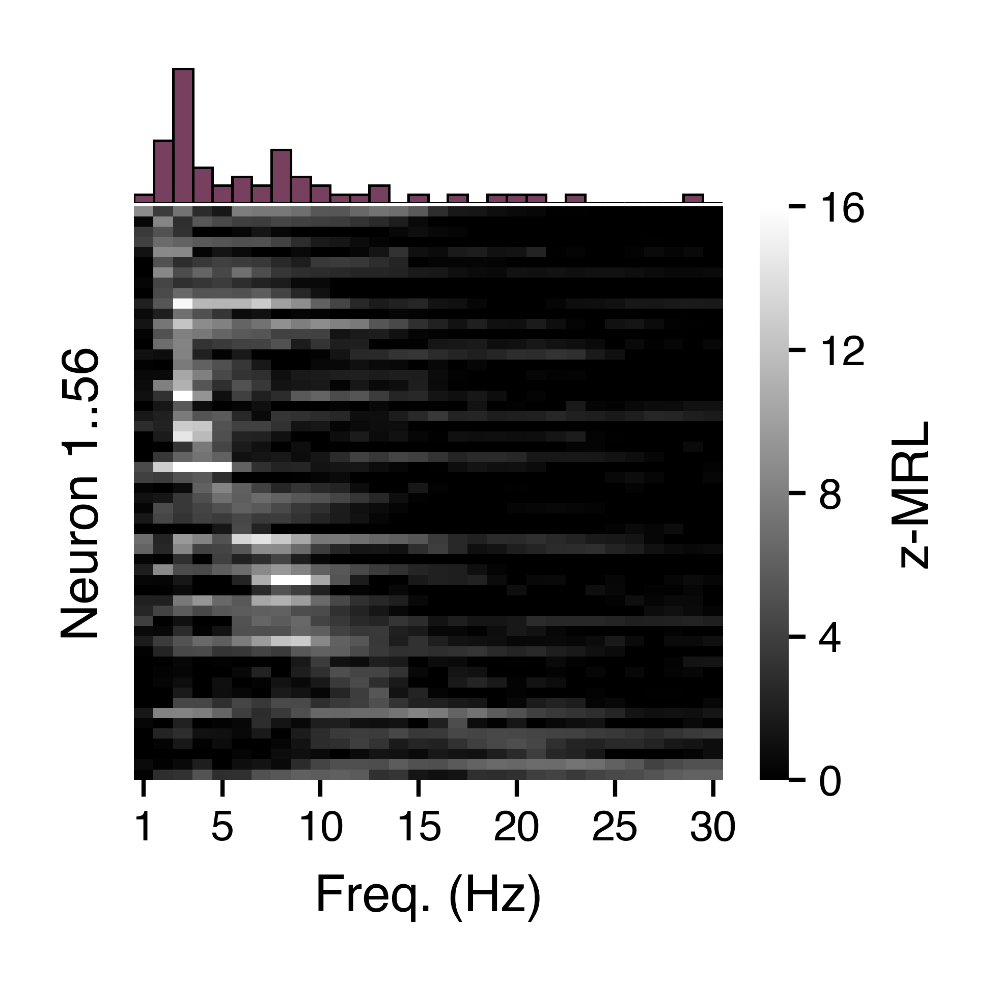

In [3178]:
keep_pairs = [
    ('HPC', 'HPC'),
    ('EC', 'EC'),
    ('AMY', 'AMY'),
    ('OFC', 'OFC'),
    ('PHG', 'PHG'),
    ('ACC', 'ACC'),
    ('STG', 'STG'),
    ('EC', 'HPC'),
    ('AMY', 'HPC'),
    ('OFC', 'HPC'),
    ('EC', 'AMY'),
    ('AMY', 'EC')
]
savefig = 1
overwrite = 1
figsize = (colws[1], colws[1]*1)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 7, 'annot': 5}
labelpad = 3
ticklen = 2
tickpad = 1.5
freqs = np.arange(1, 31)
density = True
hist_lw = 0.3
hist_ec = 'k'
hist_barcolor = {'HPC': co['r'],
                 'EC': co['b'],
                 'AMY': co['p6'],
                 'OFC': co['c']}
hist_spinecolor = None
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
cmap = 'binary_r' #'mako'
vmin = 0
vmax = 16
vticks = np.linspace(vmin, vmax, 5).astype(int)
rescale = False
redefine_vmax = True
vmax_thresh = 0.8

# -----------------------
for (unit_roi_gen, lfp_roi_gen) in keep_pairs:
    plt.close()
    fig = plt.figure(figsize=figsize, dpi=dpi)
    grid_shp = [50, 50]
    ax = [plt.subplot2grid(grid_shp, (0, 0), rowspan=10, colspan=40),
          plt.subplot2grid(grid_shp, (10, 0), rowspan=40, colspan=50)]

    # Histogram.
    iax = 0
    _ax = ax[iax]

    qry = ("(unit_roi_gen=='{}') & (lfp_roi_gen=='{}') & (sig_fdr==True)"
           .format(unit_roi_gen, lfp_roi_gen))
    _counts = pl_mrls.query(qry).groupby('max_z_mrl_freq').size()
    hist = np.array([_counts.get(freq, 0) for freq in freqs])
    if density:
        hist = hist / hist.sum()
    _ax.bar(freqs-0.5, hist, width=1, lw=hist_lw, color=hist_barcolor.get(unit_roi_gen, co['x2']), ec=hist_ec)
    _ax.set_xlim([0, len(freqs)])
    _ax.set_xticks(np.arange(len(freqs))[::2]+0.5)
    _ax.set_xticklabels('')
    _ax.set_xticks([])
    _ax.set_yticks([])
    _ax.set_xlabel('')
    _ax.set_ylabel('')
    for spine in ['left', 'bottom']:
    #     _ax.spines[spine].set_visible(False)
        _ax.spines[spine].set_edgecolor(hist_spinecolor)
    _ax.grid(False)

    # Heatmap.
    iax = 1
    _ax = ax[iax]

    dat = np.array(pl_mrls.query(qry).sort_values('max_z_mrl_freq')['z_mrls'].tolist())
    if rescale:
        dat = ((dat - np.nanmin(dat, axis=1)[:, None]) /
               (np.nanmax(dat, axis=1)[:, None] - np.nanmin(dat, axis=1)[:, None]))
        vmin = 0
        vmax = 1
        vticks = [0, 0.2, 0.4, 0.6, 0.8, 1]
    elif (vmin is None) or (vmax is None):
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.quantile(np.nanmax(dat, axis=1), vmax_thresh)
        vticks = np.linspace(vmin, vmax, 5).astype(int)

    dat[np.isnan(dat)] = 0
    n_neurons = dat.shape[0]
    print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'.format(n_neurons, vmin, vmax))

    sns.heatmap(dat, ax=_ax, vmin=vmin, vmax=vmax, cmap=cmap, cbar=True)
    _ax.axvline(x=200, color='k', linewidth=0.75, alpha=1)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
    _ax.set_xlim([0, len(freqs)])
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('Neuron 1..{}'.format(n_neurons), fontsize=font['label'], labelpad=labelpad)
    cbar = _ax.collections[0].colorbar
    cbar.ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
    cbar.set_ticks(vticks)
    cbar.set_ticklabels(vticks)
    cbar.set_label('z-MRL', fontsize=font['label'], labelpad=labelpad)

    if savefig:
        filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta/figs2', 'phase_lock_freqs',
                           'all-sig-fdr_{}{}-neurons-to-{}_heatmaps.pdf'
                           .format(n_neurons, unit_roi_gen, lfp_roi_gen))
        if overwrite or not op.exists(filename):
            fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
            print('Saved {}'.format(filename))
    
fig.show()

hpc-local: 189 neurons, vmin=0.0, vmax=12.1
hpc-local: 119 neurons, vmin=0.0, vmax=9.7
hpc-local: 128 neurons, vmin=0.0, vmax=9.3
hpc-local: 100 neurons, vmin=0.0, vmax=5.3


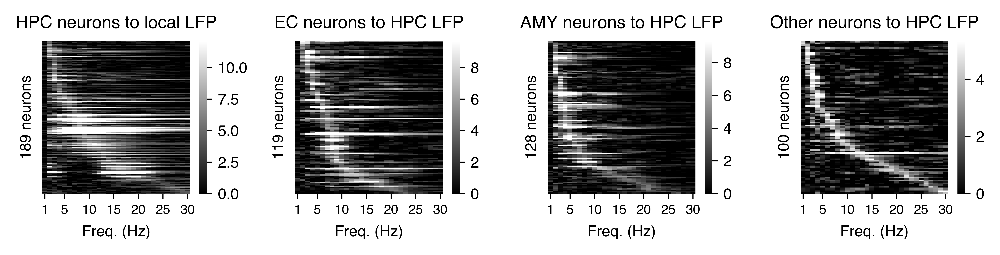

In [631]:
# Plot z-MRLs for all phase-locked neurons.
figsize = (colws[3], colws[3]*0.25)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 4
ticklen = 2.5
tickpad = 2.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
lw = 0.5
cmap = 'binary_r'
z_thresh = 0
vmax = 12
rescale = False
redefine_vmax = True
vmax_thresh = 0.8
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
edge = 'ctx-hpc'
keep_rois = {'EC': ['EC'],
             'AMY': ['AMY'],
             'Other': ['PHG', 'mPFC', 'O']}
min_spikes = 50
rois_fancy = {'HPC': 'HPC', 'EC': 'EC', 'AMY': 'AMY', 'PHG': 'PHG', 'mPFC': 'mPFC', 'O': 'Other'}

# ----------------------------
# Get the data.
plt.close()
fig, ax = plt.subplots(1, 4, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# ------------------------
# HPC neurons to local LFP
iax = 0
_ax = ax[iax]
qry = ("(edge=='hpc-local') & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(min_spikes))
z_mrls = np.array(pl_mrls.query(qry)
                         .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                         ['z_mrls'].tolist())
if rescale:
    z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
              (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
    vmin = 0
    vmax = 1
else:
    vmin = z_thresh
    if redefine_vmax:
        vmax = np.quantile(np.nanmax(z_mrls, axis=1), vmax_thresh)
z_mrls[np.isnan(z_mrls)] = 0
print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
      .format(len(z_mrls), vmin, vmax))

_ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                  cmap=cmap)
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks([])
_ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
_ax.set_title('HPC neurons to local LFP', fontsize=font['fig'])
    
# ------------------------
# E-HPC neurons to HPC LFP
for iax, (roi_name, roi) in enumerate(keep_rois.items()):
    iax += 1
    _ax = ax[iax]
    
    qry = ("(edge=='{}') & (unit_roi_gen=={})  & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(edge, roi, min_spikes))
    z_mrls = np.array(pl_mrls.query(qry)
                             .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                             ['z_mrls'].tolist())
    if rescale:
        z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
                  (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
        vmin = 0
        vmax = 1
    else:
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.quantile(np.nanmax(z_mrls, axis=1), vmax_thresh)
    z_mrls[np.isnan(z_mrls)] = 0
    print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
          .format(len(z_mrls), vmin, vmax))

    _ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                      cmap=cmap)
    for spine in ['left', 'bottom']:
        _ax.spines[spine].set_linewidth(ax_linewidth)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
    _ax.set_title('{} neurons to HPC LFP'.format(roi_name), fontsize=font['fig'])

fig.tight_layout()
fig.show()

min_spikes = 200, sig_col = sig

hpc-local: 142 neurons, vmin=0.0, vmax=12.0
ctx-hpc, EC: 95 neurons, vmin=0.0, vmax=12.0
ctx-hpc, A: 99 neurons, vmin=0.0, vmax=12.0
ctx-hpc, PHG-FSG: 14 neurons, vmin=0.0, vmax=12.0
ctx-hpc, mPFC: 23 neurons, vmin=0.0, vmax=12.0
ctx-hpc, O: 31 neurons, vmin=0.0, vmax=12.0


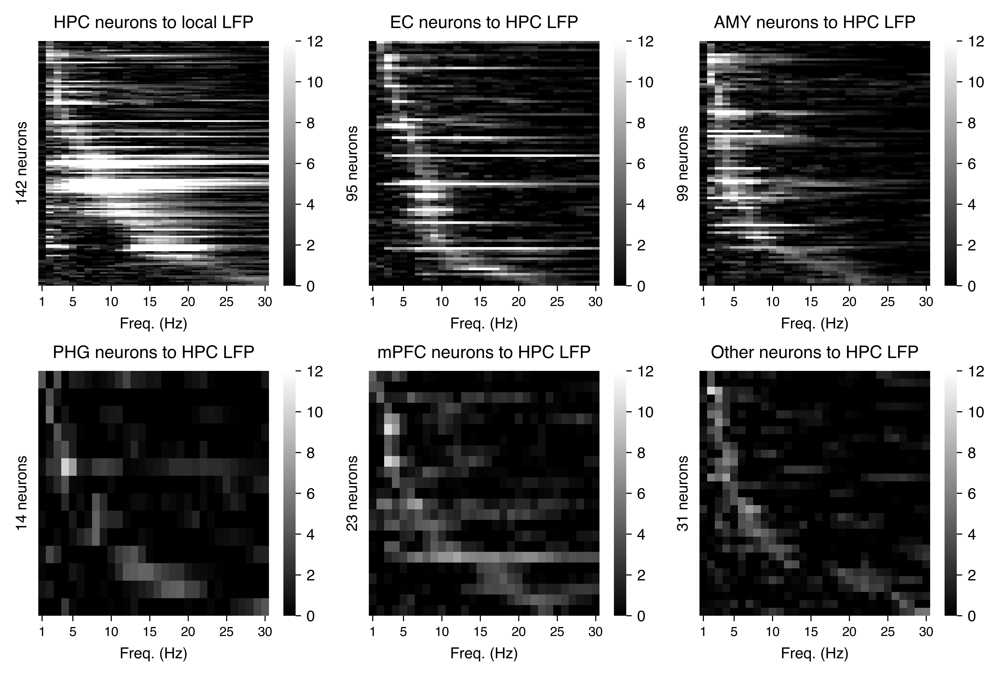

In [896]:
# Plot z-MRLs for all phase-locked neurons.
figsize = (colws[3], colws[3]*0.67)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 4
ticklen = 2.5
tickpad = 2.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
lw = 0.5
cmap = 'binary_r'
z_thresh = 0
vmax = 12
rescale = False
redefine_vmax = False
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
edge = 'ctx-hpc'
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
# min_spikes = 50
sig_col = 'sig'
rois_fancy = {'HPC': 'HPC', 'EC': 'EC', 'AMY': 'AMY', 'PHG': 'PHG', 'mPFC': 'mPFC', 'O': 'Other'}

# ----------------------------
# Get the data.
plt.close()
fig, ax = plt.subplots(2, 3, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# ------------------------
# HPC neurons to local LFP
iax = 0
_ax = ax[iax]
print('min_spikes = {}, sig_col = {}'.format(min_spikes, sig_col), end='\n'*2)
qry = ("(edge=='hpc-local') & (same_hem==True) & (max_n_spikes_mask>={}) & ({}==True)"
       .format(min_spikes, sig_col))
z_mrls = np.array(pl_mrls.query(qry)
                         .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                         ['z_mrls'].tolist())
if rescale:
    z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
              (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
    vmin = 0
    vmax = 1
else:
    vmin = z_thresh
    if redefine_vmax:
        vmax = np.nanpercentile(z_mrls, 99)
z_mrls[np.isnan(z_mrls)] = 0
print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
      .format(len(z_mrls), vmin, vmax))

_ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                  cmap=cmap)
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks([])
_ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
_ax.set_title('HPC neurons to local LFP', fontsize=font['fig'])
    
# ------------------------
# E-HPC neurons to HPC LFP
for iax, roi in enumerate(keep_rois):
    iax += 1
    _ax = ax[iax]
    
    qry = ("(edge=='{}') & (unit_roi_gen=='{}')  & (same_hem==True) & (max_n_spikes_mask>={}) & ({}==True)"
           .format(edge, roi, min_spikes, sig_col))
    if len(pl_mrls.query(qry)) == 0:
        continue
    z_mrls = np.array(pl_mrls.query(qry)
                             .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                             ['z_mrls'].tolist())
    if rescale:
        z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
                  (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
        vmin = 0
        vmax = 1
    else:
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.nanpercentile(z_mrls, 99)
    z_mrls[np.isnan(z_mrls)] = 0
    print('{}, {}: {} neurons, vmin={:.1f}, vmax={:.1f}'
          .format(edge, roi, len(z_mrls), vmin, vmax))

    _ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                      cmap=cmap)
    for spine in ['left', 'bottom']:
        _ax.spines[spine].set_linewidth(ax_linewidth)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
    _ax.set_title('{} neurons to HPC LFP'.format(rois_fancy[roi]), fontsize=font['fig'])

fig.tight_layout()
fig.show()

min_spikes = 200, sig_col = sig_fdr

hpc-local: 161 neurons, vmin=0.0, vmax=12.0
ctx-hpc, EC: 90 neurons, vmin=0.0, vmax=12.0
ctx-hpc, A: 91 neurons, vmin=0.0, vmax=12.0
ctx-hpc, mPFC: 5 neurons, vmin=0.0, vmax=12.0
ctx-hpc, O: 9 neurons, vmin=0.0, vmax=12.0


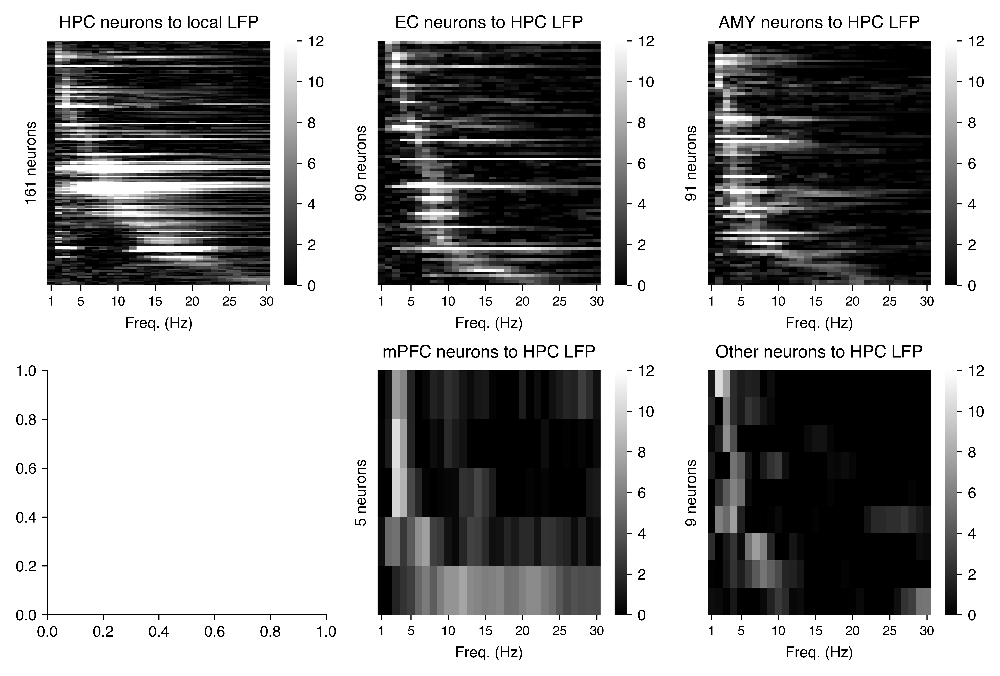

In [895]:
# Plot z-MRLs for all phase-locked neurons.
figsize = (colws[3], colws[3]*0.67)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 4
ticklen = 2.5
tickpad = 2.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
lw = 0.5
cmap = 'binary_r'
z_thresh = 0
vmax = 12
rescale = False
redefine_vmax = False
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
edge = 'ctx-hpc'
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
# min_spikes = 50
sig_col = 'sig_fdr'
rois_fancy = {'HPC': 'HPC', 'EC': 'EC', 'AMY': 'AMY', 'PHG': 'PHG', 'mPFC': 'mPFC', 'O': 'Other'}

# ----------------------------
# Get the data.
plt.close()
fig, ax = plt.subplots(2, 3, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# ------------------------
# HPC neurons to local LFP
iax = 0
_ax = ax[iax]
print('min_spikes = {}, sig_col = {}'.format(min_spikes, sig_col), end='\n'*2)
qry = ("(edge=='hpc-local') & (same_hem==True) & (max_n_spikes_mask>={}) & ({}==True)"
       .format(min_spikes, sig_col))
z_mrls = np.array(pl_mrls.query(qry)
                         .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                         ['z_mrls'].tolist())
if rescale:
    z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
              (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
    vmin = 0
    vmax = 1
else:
    vmin = z_thresh
    if redefine_vmax:
        vmax = np.nanpercentile(z_mrls, 99)
z_mrls[np.isnan(z_mrls)] = 0
print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
      .format(len(z_mrls), vmin, vmax))

_ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                  cmap=cmap)
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks([])
_ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
_ax.set_title('HPC neurons to local LFP', fontsize=font['fig'])
    
# ------------------------
# E-HPC neurons to HPC LFP
for iax, roi in enumerate(keep_rois):
    iax += 1
    _ax = ax[iax]
    
    qry = ("(edge=='{}') & (unit_roi_gen=='{}')  & (same_hem==True) & (max_n_spikes_mask>={}) & ({}==True)"
           .format(edge, roi, min_spikes, sig_col))
    if len(pl_mrls.query(qry)) == 0:
        continue
    z_mrls = np.array(pl_mrls.query(qry)
                             .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                             ['z_mrls'].tolist())
    if rescale:
        z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
                  (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
        vmin = 0
        vmax = 1
    else:
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.nanpercentile(z_mrls, 99)
    z_mrls[np.isnan(z_mrls)] = 0
    print('{}, {}: {} neurons, vmin={:.1f}, vmax={:.1f}'
          .format(edge, roi, len(z_mrls), vmin, vmax))

    _ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                      cmap=cmap)
    for spine in ['left', 'bottom']:
        _ax.spines[spine].set_linewidth(ax_linewidth)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
    _ax.set_title('{} neurons to HPC LFP'.format(rois_fancy[roi]), fontsize=font['fig'])

fig.tight_layout()
fig.show()

hpc-local: 189 neurons, vmin=0.0, vmax=12.0
ctx-local: 140 neurons, vmin=0.0, vmax=12.0
ctx-local: 181 neurons, vmin=0.0, vmax=12.0
ctx-local: 57 neurons, vmin=0.0, vmax=12.0
ctx-local: 85 neurons, vmin=0.0, vmax=12.0
ctx-local: 158 neurons, vmin=0.0, vmax=12.0


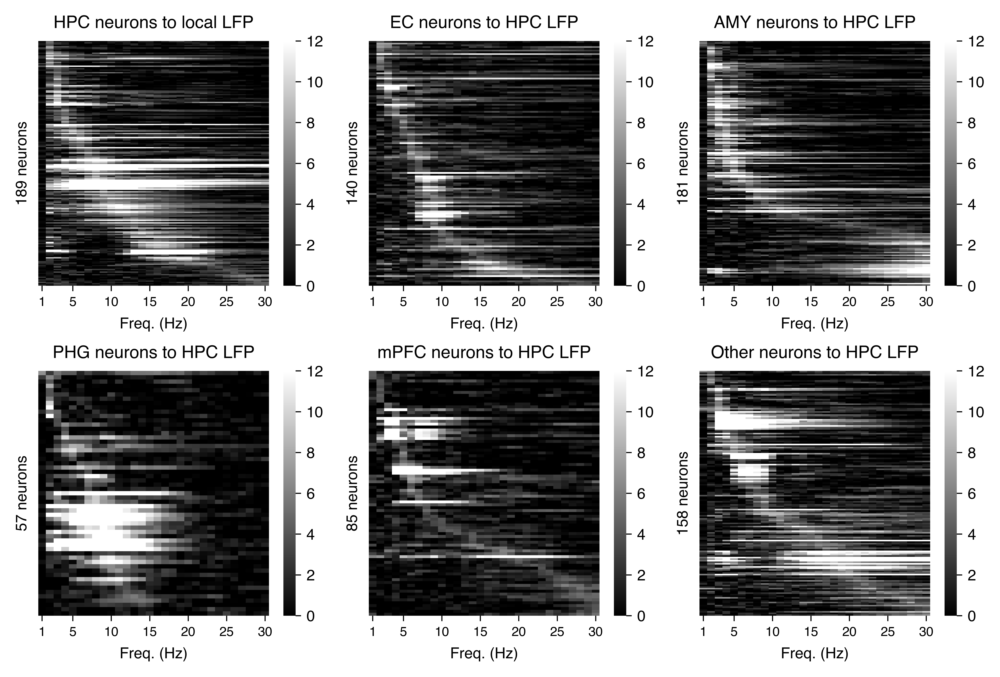

In [639]:
# Plot z-MRLs for all phase-locked neurons.
figsize = (colws[3], colws[3]*0.67)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 4
ticklen = 2.5
tickpad = 2.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
lw = 0.5
cmap = 'binary_r'
z_thresh = 0
vmax = 12
rescale = False
redefine_vmax = False
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
edge = 'ctx-local'
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
min_spikes = 50
rois_fancy = {'HPC': 'HPC', 'EC': 'EC', 'AMY': 'AMY', 'PHG': 'PHG', 'mPFC': 'mPFC', 'O': 'Other'}

# ----------------------------
# Get the data.
plt.close()
fig, ax = plt.subplots(2, 3, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# ------------------------
# HPC neurons to local LFP
iax = 0
_ax = ax[iax]
qry = ("(edge=='hpc-local') & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(min_spikes))
z_mrls = np.array(pl_mrls.query(qry)
                         .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                         ['z_mrls'].tolist())
if rescale:
    z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
              (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
    vmin = 0
    vmax = 1
else:
    vmin = z_thresh
    if redefine_vmax:
        vmax = np.nanpercentile(z_mrls, 99)
z_mrls[np.isnan(z_mrls)] = 0
print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
      .format(len(z_mrls), vmin, vmax))

_ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                  cmap=cmap)
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks([])
_ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
_ax.set_title('HPC neurons to local LFP', fontsize=font['fig'])
    
# ------------------------
# E-HPC neurons to HPC LFP
for iax, roi in enumerate(keep_rois):
    iax += 1
    _ax = ax[iax]
    
    qry = ("(edge=='{}') & (unit_roi_gen=='{}') & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(edge, roi, min_spikes))
    z_mrls = np.array(pl_mrls.query(qry)
                             .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                             ['z_mrls'].tolist())
    if rescale:
        z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
                  (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
        vmin = 0
        vmax = 1
    else:
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.nanpercentile(z_mrls, 99)
    z_mrls[np.isnan(z_mrls)] = 0
    print('{}: {} neurons, vmin={:.1f}, vmax={:.1f}'
          .format(edge, len(z_mrls), vmin, vmax))

    _ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                      cmap=cmap)
    for spine in ['left', 'bottom']:
        _ax.spines[spine].set_linewidth(ax_linewidth)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
    _ax.set_title('{} neurons to HPC LFP'.format(rois_fancy[roi]), fontsize=font['fig'])

fig.tight_layout()
fig.show()

hpc-local: 189 neurons, vmin=0.0, vmax=12.0
ctx-hpc: 119 neurons, vmin=0.0, vmax=12.0
ctx-hpc: 128 neurons, vmin=0.0, vmax=12.0
ctx-hpc: 22 neurons, vmin=0.0, vmax=12.0
ctx-hpc: 34 neurons, vmin=0.0, vmax=12.0
ctx-hpc: 44 neurons, vmin=0.0, vmax=12.0


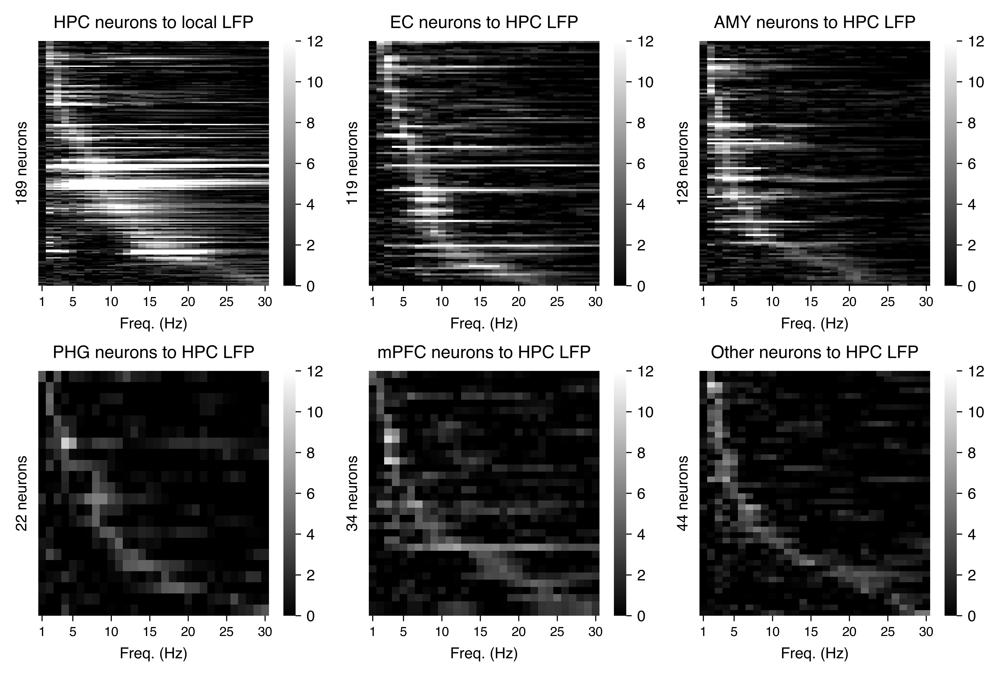

In [638]:
# Plot z-MRLs for all phase-locked neurons.
figsize = (colws[3], colws[3]*0.67)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 8, 'annot': 6}
ax_linewidth = 0.5
labelpad = 4
ticklen = 2.5
tickpad = 2.5
xvals = np.arange(1, 31)
xlim = [1, 30]
xticks = np.array([1, 5, 10, 15, 20, 25, 30]) - 0.5
xticklabs = (xticks + 0.5).astype(int)
lw = 0.5
cmap = 'binary_r'
z_thresh = 0
vmax = 12
rescale = False
redefine_vmax = False
palette = [co['b'], co['c'], co['lg'], co['y'], co['m'], co['lm']]  # palettes['economist'][:5]
edge = 'ctx-hpc'
keep_rois = ['EC', 'AMY', 'PHG', 'mPFC', 'O']
min_spikes = 50
rois_fancy = {'HPC': 'HPC', 'EC': 'EC', 'AMY': 'AMY', 'PHG': 'PHG', 'mPFC': 'mPFC', 'O': 'Other'}

# ----------------------------
# Get the data.
plt.close()
fig, ax = plt.subplots(2, 3, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

# ------------------------
# HPC neurons to local LFP
iax = 0
_ax = ax[iax]
qry = ("(edge=='hpc-local') & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(min_spikes))
z_mrls = np.array(pl_mrls.query(qry)
                         .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                         ['z_mrls'].tolist())
if rescale:
    z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
              (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
    vmin = 0
    vmax = 1
else:
    vmin = z_thresh
    if redefine_vmax:
        vmax = np.nanpercentile(z_mrls, 99)
z_mrls[np.isnan(z_mrls)] = 0
print('hpc-local: {} neurons, vmin={:.1f}, vmax={:.1f}'
      .format(len(z_mrls), vmin, vmax))

_ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                  cmap=cmap)
for spine in ['left', 'bottom']:
    _ax.spines[spine].set_linewidth(ax_linewidth)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks([])
_ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
_ax.set_title('HPC neurons to local LFP', fontsize=font['fig'])
    
# ------------------------
# E-HPC neurons to HPC LFP
for iax, roi in enumerate(keep_rois):
    iax += 1
    _ax = ax[iax]
    
    qry = ("(edge=='{}') & (unit_roi_gen=='{}')  & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(edge, roi, min_spikes))
    z_mrls = np.array(pl_mrls.query(qry)
                             .sort_values(['max_z_mrl_freq', 'subj_sess_unit'], ascending=[True, True])
                             ['z_mrls'].tolist())
    if rescale:
        z_mrls = ((z_mrls - np.nanmin(z_mrls, axis=1)[:, None]) /
                  (np.nanmax(z_mrls, axis=1)[:, None] - np.nanmin(z_mrls, axis=1)[:, None]))
        vmin = 0
        vmax = 1
    else:
        vmin = z_thresh
        if redefine_vmax:
            vmax = np.nanpercentile(z_mrls, 99)
    z_mrls[np.isnan(z_mrls)] = 0
    print('{}: {} neurons, vmin={:.1f}, vmax={:.1f}'
          .format(edge, len(z_mrls), vmin, vmax))

    _ax = sns.heatmap(z_mrls, vmin=vmin, vmax=vmax, ax=_ax,
                      cmap=cmap)
    for spine in ['left', 'bottom']:
        _ax.spines[spine].set_linewidth(ax_linewidth)
    _ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=ax_linewidth)
    _ax.set_xticks(xticks)
    _ax.set_xticklabels(xticklabs)
    _ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
    _ax.set_yticks([])
    _ax.set_ylabel('{} neurons'.format(len(z_mrls)), fontsize=font['label'], labelpad=labelpad)
    _ax.set_title('{} neurons to HPC LFP'.format(rois_fancy[roi]), fontsize=font['fig'])

fig.tight_layout()
fig.show()

In [64]:
# Load the subject dataframe (each row = 1 channel)
subj_df = phase_locking.get_subj_df()
idx = np.where(subj_df.query("(subj!='U367')")['location'].apply(lambda x: x[-1]=='H'))[0]
subjs = subj_df.query("(subj!='U367')").iloc[idx, :]['subj'].unique()
subj_df = subj_df.query("(subj=={})".format(subjs.tolist())).reset_index(drop=True)

# Fix session naming.
subj_df['subj_sess'] = subj_df['subj_sess'].apply(lambda x: str_replace(x, {'env': 'ses', '1a': '1'}))
subj_df['sess'] = subj_df['sess'].apply(lambda x: str_replace(x, {'env': 'ses', '1a': '1'}))
yc_subjs = np.sort(subj_df['subj'].unique())
yc_sessions = np.sort(subj_df['subj_sess'].unique())

# Add paths to the processed LFP channels.
data_dir = '/scratch/dscho/ycab/data'
subj_df['proc_lfp_file'] = subj_df.apply(lambda x: op.join(data_dir, x['subj'], x['sess'], 'micro_lfps', 'sr1000_bandpass0.1-80_notch60',
                                                           'CSC{}.pkl'.format(x['chan'])), axis=1)

print('{} subjects and {} sessions'.format(len(yc_subjs), len(yc_sessions)))
print('subj_df: {}'.format(subj_df.shape))

18 subjects and 43 sessions
subj_df: (2696, 14)


In [391]:
data_dir = '/scratch/dscho/ycab'
subj_sess = 'U385_ses3'
roi = 'RAH'

timer = Timer()

# -----------------------
regions = [roi]
sr = 1000
session_cut = 120000 # cut this many samples from start and end of the session
event_len = 30000
buffer = 2500
l_freq = 0.1
h_freq = 80
notch_freqs = [60]
chan_exclusion_thresh = 2
proj_dir = '/scratch/dscho/ycab'
verbose = True

mont = (subj_df.query("(subj_sess=='{}')".format(subj_sess))
               .groupby(['location'])['chan']
               .apply(lambda x: np.array([int(chan) for chan in x])))
time_eeg = eeg_preproc.load_time_eeg(subj_sess,
                                     mont=mont,
                                     regions=regions,
                                     l_freq=l_freq,
                                     h_freq=h_freq,
                                     notch_freqs=notch_freqs,
                                     chan_exclusion_thresh=chan_exclusion_thresh,
                                     verbose=verbose,
                                     proj_dir=proj_dir)
time_eeg = time_eeg[roi]
chans = time_eeg.index.values
# start_cut samples are cut from session start, on top of session_cut, to make for even epoching.
split_every = int(event_len + (2 * buffer))
start_cut = time_eeg.iloc[:, session_cut:time_eeg.shape[1]-session_cut].values.shape[1] % split_every
n_splits = int(time_eeg.iloc[:, session_cut+start_cut:-session_cut].shape[1] / split_every)
event_eeg = np.array(np.split(time_eeg.iloc[:, session_cut+start_cut:-session_cut].values,
                              n_splits, axis=1))[None, :, :, :] # gameState x trial x chan x time
event_eeg = {roi: xarray.DataArray(event_eeg,
                                   name=(subj_sess, roi),
                                   coords=[('gameState', ['YCab']),
                                           ('trial', np.arange(1, event_eeg.shape[1]+1)),
                                           ('chan', chans),
                                           ('time', np.arange(event_eeg.shape[-1]))],
                                   dims=['gameState', 'trial', 'chan', 'time'],
                                   attrs={'sr': sr,
                                          'buffer': buffer,
                                          'chan_exclusion_thresh': chan_exclusion_thresh,
                                          'session_cut': session_cut,
                                          'start_cut': start_cut})}
event_eeg = event_eeg[roi].stack(event=('gameState', 'trial')).transpose('event', 'chan', 'time')
        
# -----------------------
freqs = np.arange(1, 31)
buffer = 2500
clip_buffer = False
n_cycles = 5
zero_mean = True
log_power = False
output_dir = '/scratch/dscho/ycab/spectral'
save_output = False
overwrite = True
verbose = True

power, phase = spectral_analysis.timefreq_wavelet(event_eeg,
                                                  freqs,
                                                  clip_buffer=clip_buffer,
                                                  n_cycles=n_cycles,
                                                  zero_mean=zero_mean,
                                                  log_power=log_power,
                                                  output_dir=output_dir,
                                                  save_output=save_output,
                                                  overwrite=overwrite,
                                                  verbose=verbose)

# -----------------------
# Run FOOOF on spectral powers for each channel and event.
freqs = np.arange(1, 31)
peak_width_limits = (1, 8)
min_peak_height = 0.2
max_n_peaks = 4
peak_threshold = 2
aperiodic_mode = 'fixed'
output_dir = '/scratch/dscho/ycab/fooof'
save_output = False
overwrite = True
verbose = False

fg = spectral_analysis.run_fooof(subj_sess,
                                 roi,
                                 power=power,
                                 freqs=freqs,
                                 peak_width_limits=peak_width_limits,
                                 min_peak_height=min_peak_height,
                                 max_n_peaks=max_n_peaks,
                                 peak_threshold=peak_threshold,
                                 aperiodic_mode=aperiodic_mode,
                                 output_dir=output_dir,
                                 save_output=save_output,
                                 overwrite=overwrite,
                                 verbose=verbose)

# -----------------------
# Run P-episode.
freqs = np.arange(1, 31)
cycle_thresh = 3
thresh_req = 'all'
chi2_pctl = 0.95
output_dir = '/scratch/dscho/ycab/p_episode'
save_output = False
overwrite = True
verbose = True

osc_mask, ap_thresh = spectral_analysis.run_p_episode(subj_sess,
                                                      roi,
                                                      power=power,
                                                      phase=phase,
                                                      fooof_group=fg,
                                                      freqs=freqs,
                                                      cycle_thresh=cycle_thresh,
                                                      thresh_req=thresh_req,
                                                      chi2_pctl=chi2_pctl,
                                                      output_dir=output_dir,
                                                      save_output=save_output,
                                                      overwrite=overwrite,
                                                      return_ap_thresh=True,
                                                      verbose=verbose)

# -----------------------
# Remove the buffer.
if event_eeg.buffer > 0:
    event_eeg = event_eeg.sel(time=range(event_eeg.buffer, event_eeg.time.size-event_eeg.buffer))
    event_eeg.attrs['buffer'] = 0
if not phase.clip_buffer:
    phase = power.sel(freq=freqs,
                      time=phase.time[phase.buffer:phase.time.size-phase.buffer])
if not power.clip_buffer:
    power = power.sel(freq=freqs,
                      time=power.time[power.buffer:power.time.size-power.buffer])
if not osc_mask.clip_buffer:
    osc_mask = osc_mask.sel(freq=freqs,
                            time=osc_mask.time[osc_mask.buffer:osc_mask.time.size-osc_mask.buffer])

print(timer)

U385_ses3
---------
Kept 8/8 (100%) channels across 1 regions
Ran in 1.4s

Ran in 78.4s


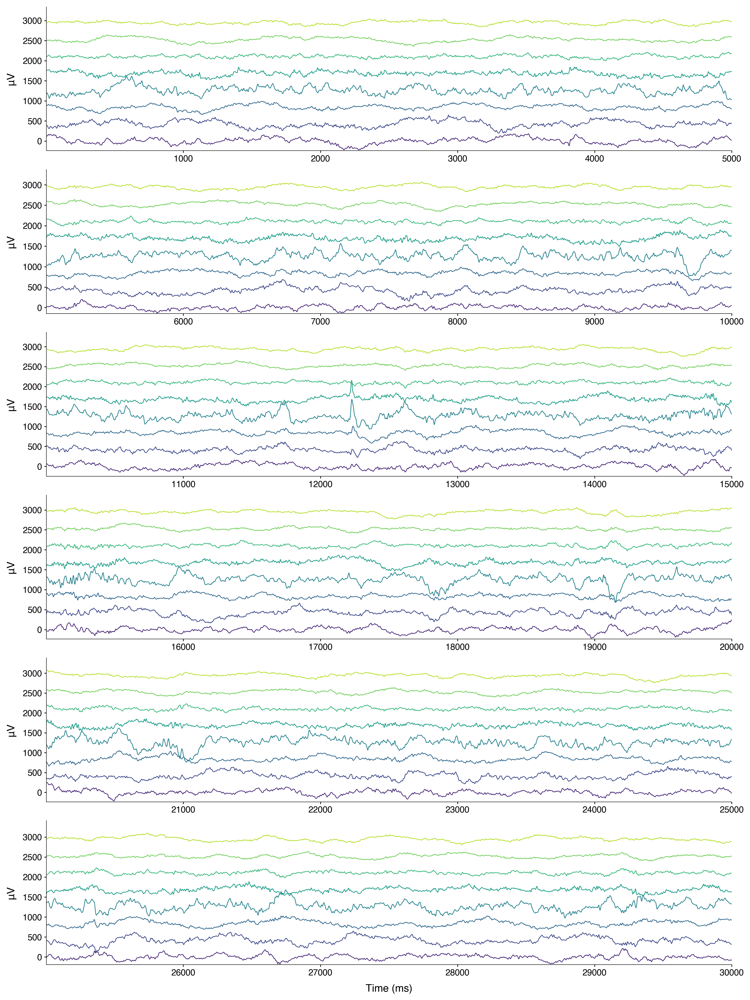

In [379]:
iEvent = 0
palette = 'viridis'

plt.close()
linecolors = sns.color_palette(palette=palette, n_colors=event_eeg.shape[1])
fig, ax = plot_trace(event_eeg.values[iEvent, :, :],
                     start=0, duration=30000, x_units='ms', sampling_rate=sr, nwin=6,
                     colors=linecolors, same_yaxis=False, conv_to_muv=False)

# Clip out buffer and resave files

In [28]:
# Clip out the buffer and constrain frequencies to reduce file sizes.
timer = Timer()
freqs = np.arange(1, 31)
# data_dir = '/scratch/dscho/ycab'
# data_dir = '/scratch/dscho/goldmine/delay'
data_dir = '/scratch/dscho/goldmine/nav'
power_files = glob(op.join(data_dir, 'spectral', 'power', 'U*.pkl'))
phase_files = glob(op.join(data_dir, 'spectral', 'phase', 'U*.pkl'))
osc_mask_files = glob(op.join(data_dir, 'p_episode', 'U*.pkl'))
all_files = phase_files + power_files + osc_mask_files
print('{} files'.format(len(all_files)))

# for iFile, fpath in enumerate(all_files):
#     dat = dio.open_pickle(fpath)
#     if (dat.buffer > 0) & (not dat.clip_buffer):
#         dat = dat.loc[:, :, :, dat.buffer:dat.time.size-dat.buffer-1]
#         dat.attrs['clip_buffer'] = True
#         dio.save_pickle(dat, fpath, verbose=False)

print(timer)

339 files
Ran in 0.1s


# Single-neuron phase-locking examples

In [67]:
from phase_locking.unit_lfp_comparison import *

def _unit_to_lfp_phase_locking(unit,
                               lfp_hemroi,
                               expmt='goldmine',
                               game_states=['Encoding', 'Retrieval'],
                               freqs=np.arange(1, 31),
                               mask_phase=True,
                               circshift=False,
                               data_dir='/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine/nav'):
    """Calculate unit's phase-locking across events, at each frequency.
    
    Parameters
    ----------
    unit : dict or series
        Contains the spike times vector and identifying info for a unit.
    expmt : str, 'goldmine' | 'ycab'
        Indicates which dataset we're working with.
    game_states : array
        Event intervals to include in the analysis.
    freqs : array
        Frequencies at which spike-phase relations are analyzed.
    mask_phase : bool
        If True, only spikes that occur during P-episode-defined
        oscillatory states are included in the analyses. This masking is
        done both for the real spike times and for circularly-shifted
        null spike times.
    data_dir : str
        Filepath to the location where saved inputs are stored.
        
    Returns
    -------
    pl_mrls : dataframe
        Each row corresponds to one unit -> LFPs from one microwire
        bundle.
    """
    unit_hemroi = unit['hemroi']
    
    # ------------------------------------
    # Data loading
    pl_mrls = []

    # Load event_times.
    event_times = load_event_times(unit['subj_sess'],
                                   expmt=expmt,
                                   game_states=game_states,
                                   data_dir=data_dir)

    # Calculate spike times relative to the start of each event.
    event_time_spikes = load_event_time_spikes(event_times,
                                               unit['spike_times'])

    # Load phase values for each event.
    basename_lfp = '{}-{}.pkl'.format(unit['subj_sess'], lfp_hemroi)
    phase = dio.open_pickle(op.join(data_dir, 'spectral', 'phase', basename_lfp))
    if (phase.buffer > 0) & (not phase.clip_buffer):
        phase = phase.loc[:, :, :, phase.buffer:phase.time.size-phase.buffer-1]
        phase.attrs['clip_buffer'] = True
    lfp_chans = [chan for chan in phase.chan.values if chan not in [unit['chan']]]
    if unit['chan'] in phase.chan:
        phase = phase.loc[{'chan': lfp_chans}]
    if not np.array_equal(phase.freq.values, freqs):
        phase = phase.loc[{'freq': [freq for freq in phase.freq.values if freq in freqs]}]
#         if np.nanmax(phase.values) > np.pi:
#             phase -= np.pi # convert values back to -π to π, with -π being the trough.

    # Load the P-episode mask for each event.
    osc_mask = dio.open_pickle(op.join(data_dir, 'p_episode', basename_lfp))
    if (osc_mask.buffer > 0) & (not osc_mask.clip_buffer):
        osc_mask = osc_mask.loc[:, :, :, osc_mask.buffer:osc_mask.time.size-osc_mask.buffer-1]
        osc_mask.attrs['clip_buffer'] = True
    if unit['chan'] in osc_mask.chan:
        osc_mask = osc_mask.loc[{'chan': [chan for chan in osc_mask.chan.values
                                          if chan not in [unit['chan']]]}]
    if not np.array_equal(osc_mask.freq.values, freqs):
        osc_mask = osc_mask.loc[{'freq': [freq for freq in osc_mask.freq.values
                                          if freq in freqs]}]

    # Ensure that phase, oscillation mask, and spike_times are all in the same event order.
    assert np.array_equal(phase.event.values, osc_mask.event.values)
    assert np.array_equal(phase.event.values,
                          np.array(event_time_spikes.apply(lambda x: (x['gameState'],
                                                                      x['trial']),
                                                           axis=1).values))

    # ------------------------------------
    # Calculate phase-locking

    # Get a masked array of spike phases, across events, during active
    # oscillations at each channel and frequency.
    event_dur = phase.time.size
    if mask_phase:
        spike_phases = np.ma.concatenate(event_time_spikes.apply(
            lambda x: get_spike_phases(x['spike_times'],
                                       phase.values[x['event_idx'], :, :, :],
                                       mask=np.invert(osc_mask.values[x['event_idx'], :, :, :]),
                                       event_dur=event_dur,
                                       circshift=circshift),
            axis=1).tolist(), axis=-1) # chan x freq x spike
    else:
        spike_phases = np.ma.concatenate(event_time_spikes.apply(
            lambda x: get_spike_phases(x['spike_times'],
                                       phase.values[x['event_idx'], :, :, :],
                                       mask=None,
                                       event_dur=event_dur,
                                       circshift=circshift),
            axis=1).tolist(), axis=-1) # chan x freq x spike

    # Calculate mean resultant lengths for each channel and frequency.
    mrls = np.array([[circstats.circmoment(spike_phases[iChan, iFreq, :].compressed())[1]
                      for iFreq in range(spike_phases.shape[1])]
                     for iChan in range(spike_phases.shape[0])]).astype(np.float32) # (chan, freq,)

    # Log how many spikes were counted per frequency,
    # taking the mean across channels.
    n_spikes_mask = np.array([[spike_phases[iChan, iFreq, :].flatten().compressed().size
                               for iFreq in range(spike_phases.shape[1])]
                              for iChan in range(spike_phases.shape[0])]).astype(np.float32) # (chan, freq,)

    output = pd.Series(od([
                 ('event_time_spikes', event_time_spikes),
                 ('phase', phase),
                 ('osc_mask', osc_mask),
                 ('spike_phases', spike_phases),
                 ('mrls', mrls),
                 ('n_spikes_mask', n_spikes_mask)
                ]))

    return output

In [68]:
def mask_spike_times(spike_times,
                     mask,
                     circshift=False,
                     event_dur=30000):
    """Return spike times that don't overlap with the mask.
    
    Parameters
    ----------
    spike_times : array, shape=(spike,)
        Spike times relative to event onset.
    mask : array, shape=(time,)
        Mask of timepoints to exclude from the analysis.
    circshift : bool
        If True, circ-shifts spike times by a random number
        between 0 and the event duration - 1.
    event_dur : int
        The event duration, in ms.
        
    Returns
    -------
    spike_phases : MaskedArray, shape=(chan, freq, time)
        The phase at each spike time, for each channel and
        frequency. 
    """
    if circshift:
        spike_train = np.zeros(event_dur, dtype=bool)
        spike_train[spike_times] = True
        roll_by = np.random.randint(0, len(spike_train))
        spike_train = np.roll(spike_train, roll_by)
        spike_times = np.where(spike_train)[0]
                 
    spike_times = np.sort(list(set(spike_times) -
                               set(spike_times[np.where(mask[spike_times])[0]])))
    
    return spike_times

In [69]:
def get_steeg(spike_times,
              eeg,
              buffer=0,
              dur=2000):
    """Return spike-triggered EEG traces."""
    steeg = np.array([eeg[buffer + np.arange(x-dur, x+dur+1)]
                      for x in spike_times])
    return steeg

In [2341]:
# def polar_histogram(phases, bins=16):
#     """Count the number of phases in each bin.
    
#     Parameters
#     ----------
#     phases : np.ndarray
#         Vector of phase values in radians.
#     bins : int
#         The number of evenly-spaced bins to
#         divide phases into.
        
#     Returns
#     ------
#     counts : np.ndarray
#         The number of phases within each bin.
#     bin_edges : np.ndarray
#         Edge values for each bin.
#     bin_centers : np.ndarray
#         Center value for each bin.
#     """    
#     # Define the bins.
#     _2pi = 2 * np.pi
#     min_phi = 0
#     max_phi = _2pi
#     bin_size = (max_phi - min_phi) / bins
#     bin_centers = np.linspace(min_phi, max_phi, bins + 1)[:-1]
#     bounds = (bin_centers + (bin_size / 2))

#     # Format phases from 0-2π, with 0/2π being
#     # the peak and π being the trough.
# #     if (np.nanmin(phases) < 0.1):
# #         phases = (np.array(phases)+np.pi) % _2pi
# # #         phases = (np.array(phases) + _2pi) % _2pi
# #     else:
# #         phases = np.array(phases) % _2pi
# # #         phases = (np.array(phases) + np.pi) % _2pi
    
#     # Count no. phases in each bin.
#     counts = []
#     bin_edges = []
#     for i in range(bins):
#         if bounds[i-1] > bounds[i]:
#             counts.append(len(phases[(phases>=bounds[i-1]) | (phases<bounds[i])]))
#         else:
#             counts.append(len(phases[(phases>=bounds[i-1]) & (phases<bounds[i])]))
#         bin_edges.append((bounds[i-1], bounds[i]))
#     counts = np.array(counts)
#     bin_edges = np.array(bin_edges)
    
#     return counts, bin_edges, bin_centers

In [66]:
def polar_histogram(phases,
                    bins=16,
                    density=False):
    """Count the number of phases in each bin.
    
    Parameters
    ----------
    phases : np.ndarray
        Vector of phase values in radians.
    bins : int
        The number of evenly-spaced bins to
        divide phases into.
        
    Returns
    ------
    hist : np.ndarray
        The number of phases within each bin.
    bin_edges : np.ndarray
        Edge values for each bin.
    bin_centers : np.ndarray
        Center value for each bin.
    """
    # Define the bins.
    _2pi = 2 * np.pi
    min_phi = 0
    max_phi = _2pi
    bin_edges = np.linspace(min_phi, max_phi, bins + 1)
    
    min_phase = np.nanmin(phases)
    max_phase = np.nanmax(phases)
    if min_phase < 0:
        warnings.warn('Minimum phase ({:.3f}) is below 0'.format(min_phase))
    if max_phase >= _2pi:
        warnings.warn('Maximum phase ({:.3f}) is >= 2pi'.format(max_phase))

    # Count no. phases in each bin.
    hist = []
    for _min, _max in aop.rolling_window(bin_edges, 2):
        hist.append(np.logical_and(phases>=_min, phases<_max).sum())
    hist = np.array(hist)
    if density:
        hist = hist / np.sum(hist)
    
    return hist, bin_edges

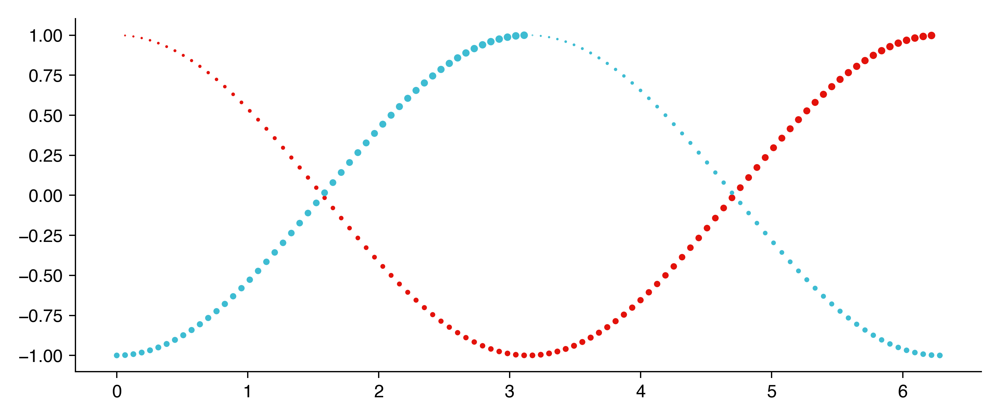

In [2220]:
plt.close()
_2pi = 2 * np.pi
xvals = np.linspace(0, _2pi, 100)
plt.scatter(xvals,
            np.cos(np.linspace(0, _2pi, 100) % _2pi),
            np.linspace(0, _2pi, 100) % _2pi,
            color=co['r'])
plt.scatter(xvals,
            np.cos((np.linspace(0, _2pi, 100) + np.pi) % _2pi),
            (np.linspace(0, _2pi, 100) + np.pi) % _2pi,
            color=co['c'])

plt.show()

Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/example_units/phase_alignment.pdf


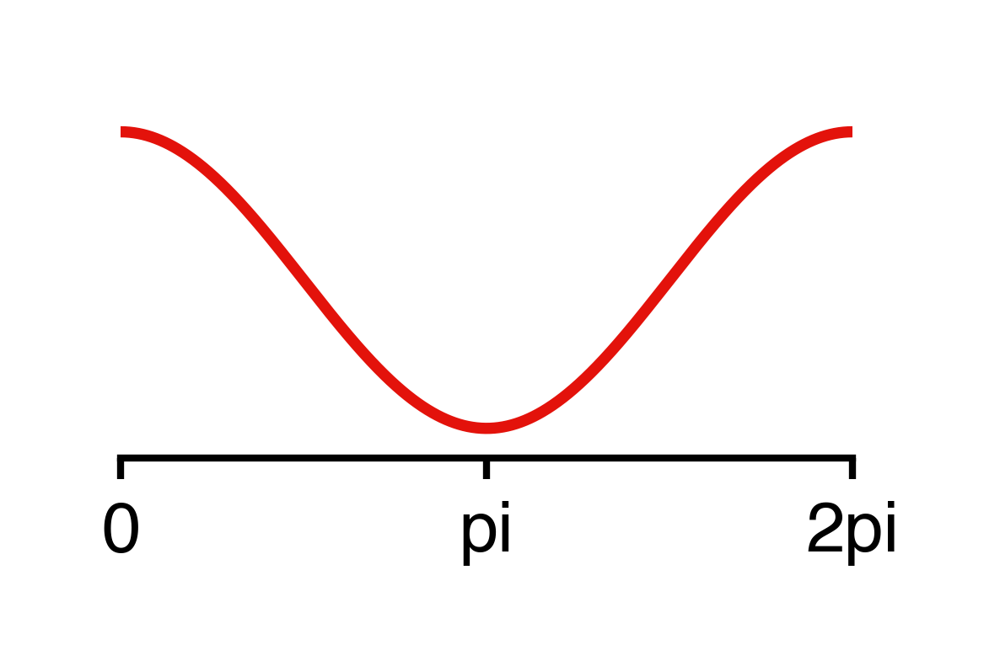

In [1974]:
savefig = 1
overwrite = 0

plt.close()
fig, ax = plt.subplots(1, 1, figsize=(colws[1]*0.6, colws[1]*0.6*0.5), dpi=1200)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_2pi = 2 * np.pi
xvals = np.linspace(0, _2pi, 1000)
yvals = np.cos((np.linspace(-np.pi, np.pi, 1000) + np.pi) % _2pi)
_ax.plot(xvals, yvals, lw=0.8, color=co['r'])

for axis in ['left']:
    _ax.spines[axis].set_visible(False)
_ax.tick_params(which='major', labelsize=5, pad=1.5, length=1.5, width=0.5)
xticks = [0, np.pi, _2pi]
xlim = [0, _2pi]
_ax.set_xlim(xlim)
_ax.set_xticks(xticks)
_ax.set_xticklabels([0, 'pi', '2pi'])
_ax.set_ylim([-1.2, 1.2])
_ax.set_yticks([])

# _ax.set_xlabel('', fontsize=font['label'], labelpad=labelpad)
# _ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

# Save the figure.
if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta', 'figs2', 'example_units',
                       'phase_alignment.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))

fig.show()

In [65]:
def _minmax(vals):
    return (vals - np.nanmin(vals, axis=1)[:, None]) / (np.nanmax(vals, axis=1)[:, None] - np.nanmin(vals, axis=1)[:, None])

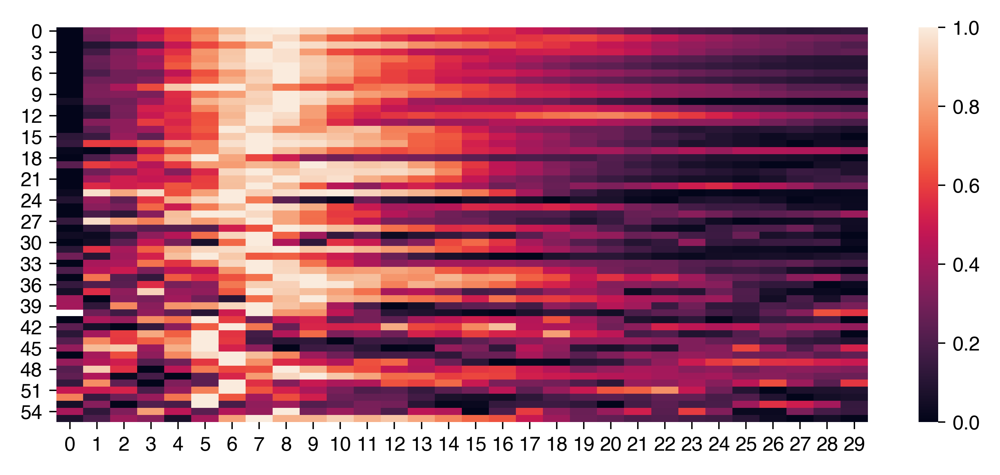

In [2781]:
plt.close()
sns.heatmap(_minmax(np.array(pl_mrls
 .query("(edge=='hpc-local') & (unit_roi_gen=='HPC') & (sig_fdr==True) & (expmt=={}) & (6<=max_z_mrl_freq<=10)".format(keep_expmts))
 .sort_values(['max_z_mrl'], ascending=[False])['z_mrls'].tolist())))

In [71]:
keep_expmts = ['goldmine_nav', 'ycab']
cols = ['subj_sess_unit', 'edge', 'unit_hemroi', 'lfp_hemroi', 'n_spikes',
        'fr', 'max_mrl', 'max_z_mrl', 'max_mrl_freq', 'max_z_mrl_freq',
        'max_pep', 'max_pep_freq', 'max_n_spikes_mask']
# -----------------
remove_subjs = ['U374', 'U384', 'U396', 'U530']
(pl_mrls
 .query("(edge=='ctx-hpc') & (unit_roi_gen=='EC') & (sig_fdr==True) & (expmt=={}) & (2<=max_z_mrl_freq<=10) & (subj!={})"
        .format(keep_expmts, remove_subjs))
 .sort_values(['max_z_mrl'], ascending=[False])[cols]
 .reset_index(drop=True).iloc[:30])

,subj_sess_unit,edge,unit_hemroi,lfp_hemroi,n_spikes,fr,max_mrl,max_z_mrl,max_mrl_freq,max_z_mrl_freq,max_pep,max_pep_freq,max_n_spikes_mask
0,U395_ses2-13-10,ctx-hpc,REC,RAH,35912,24.429932,0.117407,15.841945,27,4,16.052185,4,5871.500000
1,U395_ses1-10-7,ctx-hpc,REC,RAH,7215,5.228261,0.213303,14.773859,3,5,20.566386,5,1423.750000
2,U371_ses2-25-3,ctx-hpc,LEC,LPH,12470,6.394872,0.157661,14.305999,4,3,10.620147,3,1426.571411
3,U372_ses1-29-4,ctx-hpc,LEC,LMH,5107,3.621986,0.445996,13.830023,3,3,4.244158,2,211.625000
4,U395_ses1-13-9,ctx-hpc,REC,RAH,26410,19.137681,0.248410,13.627318,1,5,20.566386,5,5110.000000
5,U371_ses1-25-9,ctx-hpc,LEC,LPH,9113,4.161187,0.246677,13.048129,10,4,8.367567,3,692.142883
6,U371_ses1-25-8,ctx-hpc,LEC,LPH,3300,1.506849,0.299540,11.716435,14,3,8.367567,3,278.428558
7,U372_ses2-30-18,ctx-hpc,LEC,LMH,9247,6.043791,0.232453,11.135061,7,2,3.532704,3,328.875000
8,U371_ses1-25-10,ctx-hpc,LEC,LPH,3067,1.400457,0.433142,10.847912,12,3,8.367567,3,244.571426
9,U371_ses3-25-13,ctx-hpc,LEC,LPH,2429,1.686806,0.402283,10.693417,11,3,11.418880,3,306.875000


In [72]:
from unit_activity_and_hpc_theta import phase_locking as phlock

# Load the subject dataframe (each row = 1 channel)
subj_df = phlock.get_subj_df()
idx = np.where(subj_df.query("(subj!='U367')")['location'].apply(lambda x: x[-1]=='H'))[0]
subjs = subj_df.query("(subj!='U367')").iloc[idx, :]['subj'].unique()
subj_df = subj_df.query("(subj=={})".format(subjs.tolist())).reset_index(drop=True)

# Fix session naming.
subj_df['subj_sess'] = subj_df['subj_sess'].apply(lambda x: str_replace(x, {'env': 'ses', '1a': '1'}))
subj_df['sess'] = subj_df['sess'].apply(lambda x: str_replace(x, {'env': 'ses', '1a': '1'}))
yc_subjs = np.sort(subj_df['subj'].unique())
yc_sessions = np.sort(subj_df['subj_sess'].unique())

# Add paths to the processed LFP channels.
data_dir = '/scratch/dscho/ycab/eeg'
subj_df['proc_lfp_file'] = subj_df.apply(lambda x: op.join(data_dir, x['subj'], x['sess'], 'micro_lfps',
                                                           'V-to-muV_sr1000_bandpass0.1-80_notch60',
                                                           'CSC{}.pkl'.format(x['chan'])), axis=1)

print('{} subjects and {} sessions'.format(len(yc_subjs), len(yc_sessions)))
print('subj_df: {}'.format(subj_df.shape))

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/ptsa/data/TimeSeriesX.py:7: DeprecationWarning: importing from ptsa.data.TimeSeries is deprecated; import from ptsa.data.timeseries instead
  DeprecationWarning)


18 subjects and 43 sessions
subj_df: (2696, 14)


In [86]:
# Gather data to plot the spike-triggered LFP,
# z-MRL at each frequency, and spike-phase polar 
# histogram at the phase-locked frequency, for the
# real data and a random sample from the null distribution.

# edge = 'hpc-local'
edge = 'ctx-hpc'

# hpc-local
# ---------
# subj_sess_unit = 'U539_ses0-27-1'  # slow theta
# subj_sess_unit =  'U384_ses1-22-10'  # fast theta
# subj_sess_unit = 'U518_ses0-39-1'  # slow theta, beta
# subj_sess_unit = 'U518_ses1-36-1' # ...slow theta, beta
# subj_sess_unit =  'U374_ses2-54-39' #'U371_ses3-35-24' 


#'U390_ses3-8-5' #'U390_ses4-7-2'# 'U390_ses2-4-2'  #

# 'U530_ses0-9-1'

# U384_ses1-18-8'
# 'U390_ses1-4-1' 'U390_ses1-4-2' 'U390_ses2-7-5'


# Trash
# -----
# subj_sess_unit = 'U374_ses2-49-34'
# subj_sess_unit = 'U374_ses2-54-38'  # fast theta
# subj_sess_unit = 'U384_ses1-20-9'
# subj_sess_unit = 'U384_ses2-56-47'
# subj_sess_unit = 'U384_ses1-56-50'
# subj_sess_unit = 'U518_ses1-38-1'
# subj_sess_unit = 'U521_ses0-70-1'
# subj_sess_unit = 'U527_ses0-11-1'
# subj_sess_unit = 'U527_ses0-12-1'
# subj_sess_unit = 'U530_ses0-9-1'
# subj_sess_unit = 'U530_ses0-15-1'
# subj_sess_unit = 'U536_ses0-13-1'

# ctx-hpc, EC
# -----------
# subj_sess_unit = 'U396_ses2-25-3'  # slow theta
# subj_sess_unit = 'U530_ses0-7-1' # fast theta
# subj_sess_unit = 'U539_ses0-50-1'  # fast theta

# subj_sess_unit = 'U395_ses1-10-7' # mid theta

subj_sess_unit = 'U371_ses2-25-3'

# subj_sess_unit = 'U530_ses0-3-1'


# Trash
# -----
# subj_sess_unit = 'U371_ses1-10-0'
# subj_sess_unit = 'U374_ses1-44-30'
# subj_sess_unit = 'U380_ses1-13-23'
# subj_sess_unit = 'U384_ses1-45-42'
# subj_sess_unit = 'U384_ses1-44-41'
# subj_sess_unit = 'U530_ses0-7-3'
# subj_sess_unit = 'U530_ses0-43-1'
# subj_sess_unit = 'U530_ses0-43-2'
# subj_sess_unit = 'U539_ses0-55-1'

# ctx-hpc, AMY
# ------------
# subj_sess_unit = 'U396_ses2-11-2' # low theta
# subj_sess_unit = 'U395_ses3-3-2' # low theta
# subj_sess_unit = 'U527_ses0-23-1'  # mid theta

# Trash
# -----
# subj_sess_unit = 'U384_ses1-44-41'

# ctx-hpc, OFC
# ------------
# subj_sess_unit = 'U394_ses1-34-20'  # low theta

# -------------------------
timer = Timer()

unit_lfp = pl_mrls.query("(subj_sess_unit=='{}') & (edge=='{}') & (same_hem==True)".format(subj_sess_unit, edge)).iloc[0]
unit = spikes.query("(subj_sess_unit=='{}')".format(subj_sess_unit)).iloc[0]
expmt = unit['expmt']
if expmt == 'goldmine':
    game_states = ['Encoding', 'Retrieval']
    data_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine/nav'
else:
    game_states = ['YCab']
    data_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/ycab'
    
x = _unit_to_lfp_phase_locking(unit, unit_lfp['lfp_hemroi'], expmt=expmt,
                               game_states=game_states, data_dir=data_dir, circshift=False)
event_time_spikes = x['event_time_spikes']
phase = x['phase']
osc_mask = x['osc_mask']
spike_phases = x['spike_phases']
mrls = x['mrls']  # (chan, freq)
n_spikes_mask = x['n_spikes_mask']

x = _unit_to_lfp_phase_locking(unit, unit_lfp['lfp_hemroi'], expmt=expmt,
                               game_states=game_states, data_dir=data_dir, circshift=True)
event_time_spikes_null = x['event_time_spikes']
spike_phases_null = x['spike_phases']
mrls_null = x['mrls']  # (chan, freq)
del x

locked_freq = unit_lfp['max_z_mrl_freq']
iFreq = phase.freq.values.tolist().index(locked_freq)
iChan = np.nanargmax(((mrls - np.array(unit_lfp['mean_mrls_null'])[None, :]) /
                      np.array(unit_lfp['std_mrls_null'])[None, :])[:, iFreq])
_z_mrls = ((np.nanmean(mrls, axis=0) - np.array(unit_lfp['mean_mrls_null'])) /
            np.array(unit_lfp['std_mrls_null']))
_z_mrls_null = ((np.nanmean(mrls_null, axis=0) - np.array(unit_lfp['mean_mrls_null'])) /
                 np.array(unit_lfp['std_mrls_null']))

subj_sess = unit_lfp['subj_sess']
roi = unit_lfp['lfp_hemroi']
buffer = 2500
l_freq = 0.1
h_freq = 80
notch_freqs = [60]
chan_exclusion_thresh = 2
verbose = True

if expmt == 'goldmine':
    event_eeg = eeg_preproc.load_event_eeg(subj_sess,
                                           regions=[roi],
                                           game_states=game_states,
                                           buffer=buffer,
                                           l_freq=l_freq,
                                           h_freq=h_freq,
                                           notch_freqs=notch_freqs,
                                           chan_exclusion_thresh=chan_exclusion_thresh,
                                           verbose=verbose)
    event_eeg = event_eeg[roi].stack(event=('gameState', 'trial')).transpose('event', 'chan', 'time')
else:
    # -----------------------
    # Load EEG for each channel and event.
    mont = (subj_df.query("(subj_sess=='{}')".format(subj_sess))
                   .groupby(['location'])['chan']
                   .apply(lambda x: np.array([int(chan) for chan in x])))
    regions = [roi]
    sr = 1000
    session_cut = 60000 # cut this many samples from start and end of the session
    event_len = 30000
    buffer = 2500
    l_freq = 0.1
    h_freq = 80
    notch_freqs = [60]
    chan_exclusion_thresh = 2
    output_dir = op.join('/scratch/dscho/ycab/eeg',
                         subj_sess.split('_')[0],
                         subj_sess.split('_')[1],
                         'micro_lfps',
                         'V-to-muV_sr1000_bandpass0.1-80_notch60')
    verbose = True

    time_eeg = eeg_preproc.load_time_eeg(subj_sess,
                                         mont=mont,
                                         regions=regions,
                                         l_freq=l_freq,
                                         h_freq=h_freq,
                                         notch_freqs=notch_freqs,
                                         chan_exclusion_thresh=chan_exclusion_thresh,
                                         verbose=verbose,
                                         output_dir=output_dir)
    time_eeg = time_eeg[roi]
    chans = time_eeg.index.values
    # start_cut samples are cut from session start, on top of session_cut, to make for even epoching.
    split_every = int(event_len)
    start_cut = time_eeg.iloc[:, session_cut:time_eeg.shape[1]-session_cut].values.shape[1] % split_every
    n_splits = int(time_eeg.iloc[:, session_cut+start_cut:-session_cut].shape[1] / split_every)
    start_stop = aop.rolling_window(np.arange(session_cut+start_cut,
                                              time_eeg.shape[1]-session_cut+1,
                                              split_every), 2)
    event_idx = np.array([np.arange(start-buffer, stop+buffer)
                          for (start, stop) in start_stop.tolist()])
    event_eeg = np.swapaxes(time_eeg.values[:, event_idx], 0, 1)[None, :, :, :] # gameState x trial x chan x time
    event_eeg = {roi: xarray.DataArray(event_eeg,
                                       name=(subj_sess, roi),
                                       coords=[('gameState', ['YCab']),
                                               ('trial', np.arange(1, event_eeg.shape[1]+1)),
                                               ('chan', chans),
                                               ('time', np.arange(event_eeg.shape[-1]))],
                                       dims=['gameState', 'trial', 'chan', 'time'],
                                       attrs={'sr': sr,
                                              'buffer': buffer,
                                              'chan_exclusion_thresh': chan_exclusion_thresh,
                                              'session_cut': session_cut,
                                              'start_cut': start_cut})}
    event_eeg = event_eeg[roi].stack(event=('gameState', 'trial')).transpose('event', 'chan', 'time')

# ----------------------------
event_dur = osc_mask.time.size
_osc_mask = np.any(osc_mask.isel(chan=iChan).sel(freq=[locked_freq]), axis=1).values  # (event, time)
_osc_mask_null = np.any(osc_mask.isel(chan=iChan).sel(freq=[locked_freq]), axis=1).values  # (event, time)

event_time_spikes['spike_times_null'] = (event_time_spikes.apply(lambda x:
                                                                 mask_spike_times(x['spike_times'],
                                                                                  np.zeros(_osc_mask_null[x['event_idx'], :].size),
                                                                                  event_dur=event_dur,
                                                                                  circshift=True),
                                                                 axis=1).tolist())
event_time_spikes['spike_times_ma'] = (event_time_spikes.apply(lambda x:
                                                               mask_spike_times(x['spike_times'],
                                                                                np.invert(_osc_mask[x['event_idx'], :]),
                                                                                event_dur=event_dur,
                                                                                circshift=False),
                                                               axis=1).tolist())
event_time_spikes['spike_times_ma_null'] = (event_time_spikes.apply(lambda x:
                                                                    mask_spike_times(x['spike_times'],
                                                                                     np.invert(_osc_mask_null[x['event_idx'], :]),
                                                                                     event_dur=event_dur,
                                                                                     circshift=True),
                                                                    axis=1).tolist())

print('{}, {}: {} to {}, LFP iChan={}'
      .format(subj_sess_unit, edge, unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi'], iChan))
print('event_eeg: {}, event_time_spikes: {}'.format(event_eeg.shape, event_time_spikes.shape))
print(timer)

/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/astropy/stats/circstats.py:31: RuntimeWarning: invalid value encountered in double_scalars
  C = np.sum(weights * np.cos(p * (data - phi)), axis)/np.sum(weights, axis)
/home1/dscho/anaconda3/envs/memlab/lib/python3.6/site-packages/astropy/stats/circstats.py:32: RuntimeWarning: invalid value encountered in double_scalars
  S = np.sum(weights * np.sin(p * (data - phi)), axis)/np.sum(weights, axis)


U371_ses2
---------
Excluded LPH channel 41 (index 0)
Kept 7/8 (88%) channels across 1 regions
Ran in 3.3s

U371_ses2-25-3, ctx-hpc: LEC to LPH, LFP iChan=2
event_eeg: (65, 7, 35000), event_time_spikes: (65, 9)
Ran in 13.3s


In [87]:
# Get all spike-triggered LFPs within a chosen time window
# of spike onset, for all spikes or only spikes within the 
# the oscillation mask.
steeg_dur = 1000
ma_str = '' # '_ma'

_event_eeg = event_eeg.isel(chan=iChan).values  # (event, time)
steegs = od([('obs', np.concatenate([y for y in
                                     event_time_spikes.apply(lambda x:
                                                             get_steeg(
                                                                 x['spike_times{}'.format(ma_str)],
                                                                 _event_eeg[x['event_idx'], :],
                                                                 buffer=event_eeg.buffer,
                                                                 dur=steeg_dur
                                                             ), axis=1).tolist()
                                     if len(y) > 0], axis=0)),
             ('null', np.concatenate([y for y in
                                      event_time_spikes.apply(lambda x:
                                                              get_steeg(
                                                                  x['spike_times{}_null'.format(ma_str)],
                                                                  _event_eeg[x['event_idx'], :],
                                                                  buffer=event_eeg.buffer,
                                                                  dur=steeg_dur
                                                              ), axis=1).tolist()
                                      if len(y) > 0], axis=0))])

print('{} obs spikes, {} null spikes'.format(steegs['obs'].shape[0], steegs['null'].shape[0]))
print('stEEG min={:.1f}, max={:.1f}'
      .format(np.min([np.min(np.nanmean(steegs[k], axis=0)) for k in steegs]),
              np.max([np.max(np.nanmean(steegs[k], axis=0)) for k in steegs])))
print('z-MRL obs: min={:.1f}, max={:.1f}'.format(np.nanmin(_z_mrls), np.nanmax(_z_mrls)))
print('z-MRL null: min={:.1f}, max={:.1f}'.format(np.nanmin(_z_mrls_null), np.nanmax(_z_mrls_null)))

12470 obs spikes, 12470 null spikes
stEEG min=-8.3, max=6.1
z-MRL obs: min=-0.7, max=14.3
z-MRL null: min=-1.3, max=1.6


Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/example_units/U371_ses2-25-3-ctx-hpc-LEC_to_LPH_ch44-3Hz-spike_triggered_eeg.pdf
U371_ses2-25-3, LEC-LPH, max_z_mrl 14.3, 3Hz, 


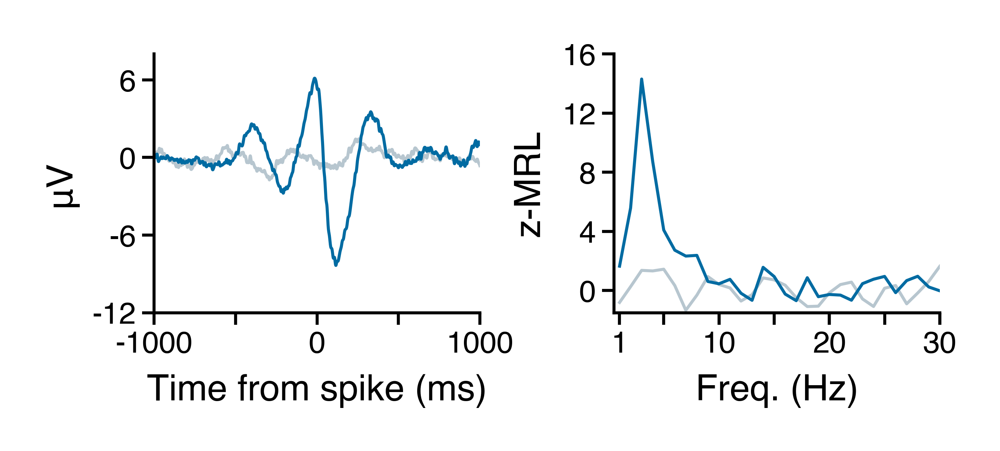

In [90]:
# Plot the spike-triggered LFP and z-MRL by frequency.
savefig = 0
overwrite = 1
figsize = (colws[1]*1.35, colws[1]*1.35*0.4)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 7, 'annot': 6}
_colors = {'null': co['x2'],
           'HPC': co['r'],
           'EC': co['b'],
           'AMY': co['p6'],
           'OFC': co['g']}
lw = 0.5
ticklen = 2
tickpad = 1
labelpad = 2.5
spine_lw = 0.5
xticks_steeg = None # np.linspace(-1000, 1000, 5).astype(int)
ylim_steeg = [-12, 8]
yticks_steeg = [-12, -6, 0, 6]
ylim_zmrl = [-1.5, 16]
yticks_zmrl = [0, 4, 8, 12, 16]

# -----------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 2, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)
_colors['obs'] = _colors[unit_lfp['unit_roi_gen']]

# Spike-triggered LFP.
iax = 0
_ax = ax[iax]

xvals = np.arange(-steeg_dur, steeg_dur+1)
_means = np.mean(steegs['null'], axis=0)
_ax.plot(xvals, _means, lw=lw, color=_colors['null'])
_means = np.mean(steegs['obs'], axis=0)
_ax.plot(xvals, _means, lw=lw, color=_colors['obs'])

_ax.tick_params(which='both', labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
_ax.set_xlim([-steeg_dur, steeg_dur])
if xticks_steeg is None:
    xticks_steeg = np.linspace(-steeg_dur, steeg_dur, 5).astype(int)
_ax.set_xticks(xticks_steeg[::2])
_ax.set_xticks(xticks_steeg[1::2], minor=True)
_ax.set_xticklabels(xticks_steeg[::2])
if ylim_steeg is not None:
    _ax.set_ylim(ylim_steeg)
if yticks_steeg is None:
    yticks_steeg = np.linspace(*_ax.get_ylim(), 3)
_ax.set_yticks(yticks_steeg)
_ax.set_yticklabels([int(x) for x in np.round(yticks_steeg, 0)])
_ax.set_xlabel('Time from spike (ms)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('μV', fontsize=font['label'], labelpad=labelpad)

# MRL by frequency.
iax = 1
_ax = ax[iax]

_ax.plot(freqs, _z_mrls_null, lw=lw, color=_colors['null'])
_ax.plot(freqs, _z_mrls, lw=lw, color=_colors['obs'])

_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
xticks = [1, 5, 10, 15, 20, 25, 30]
xlim = [0.5, 30]
_ax.set_xlim(xlim)
_ax.set_xticks(xticks[::2], minor=False)
_ax.set_xticks(xticks[1::], minor=True)
_ax.set_xticklabels(xticks[::2])
if ylim_zmrl is None:
    ylim_zmrl = [np.floor(np.nanmin(_z_mrls)), np.ceil(1.1 * np.nanmax(_z_mrls))]
_ax.set_ylim(ylim_zmrl)
if yticks_zmrl is None:
    yticks_zmrl = np.linspace(ylim_zmrl[0], ylim_zmrl[1], 3)
    _ax.set_yticks(yticks_zmrl)
    _ax.set_yticklabels(np.round(yticks_zmrl, 1))
else:
    _ax.set_yticks(yticks_zmrl)
    _ax.set_yticklabels(yticks_zmrl)
_ax.set_xlabel('Freq. (Hz)', fontsize=font['label'], labelpad=labelpad)
_ax.set_ylabel('z-MRL', fontsize=font['label'], labelpad=labelpad)

fig.tight_layout(pad=0)

# Save the figure.
if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta', 'figs2', 'example_units',
                       '-'.join([unit_lfp['subj_sess_unit'],
                                 unit_lfp['edge'],
                                 '{}_to_{}_ch{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi'], unit_lfp['lfp_chans'][iChan]),
                                 str(locked_freq)+'Hz']) + '-spike_triggered_eeg{}.pdf'.format(ma_str))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))

print(subj_sess_unit, '{}-{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi']),
      'max_z_mrl {:.1f}, {}Hz'.format(unit_lfp['max_z_mrl'], locked_freq),
      ma_str, sep=', ')

fig.show()

Saved /home1/dscho/projects/unit_activity_and_hpc_theta/figs2/example_units/U371_ses2-25-3-ctx-hpc-LEC_to_LPH_ch44-3Hz-polar_plot.pdf
U371_ses2-25-3, LEC-LPH, max_z_mrl 14.3, 3Hz, 


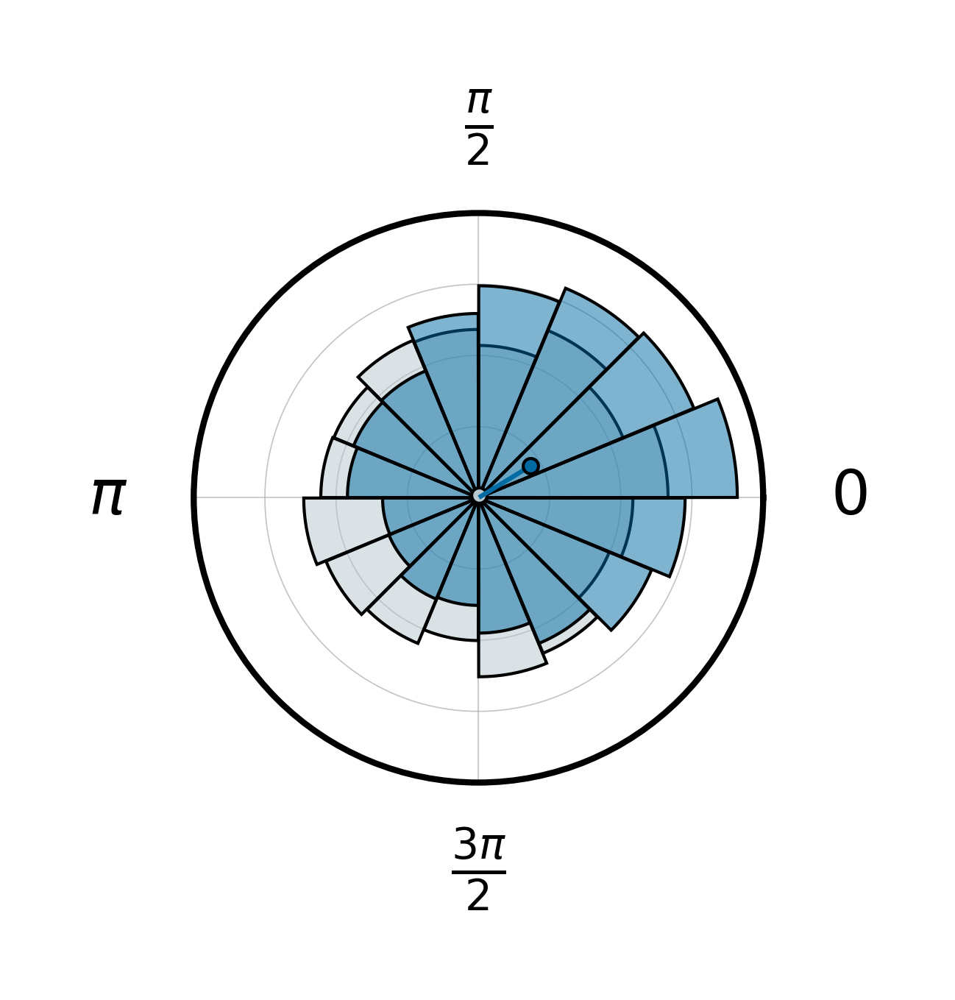

In [91]:
savefig = 0
overwrite = 1
figsize = (colws[1]*0.6, colws[1]*0.6)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 7, 'annot': 6}
_colors = {'null': co['x2'],
           'HPC': co['r'],
           'EC': co['b'],
           'AMY': co['p6'],
           'OFC': co['g']}
lw = 0.25
ticklen = 0
tickpad = 0
spine_lw = 0.5
bar_alpha = 0.5
plot_arrows = True

# -----------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi, subplot_kw={'polar': True})
ax = np.ravel(ax)
_colors['obs'] = _colors[unit_lfp['unit_roi_gen']]

# Polor histogram.
iax = 0
_ax = ax[iax]
_2pi = 2 * np.pi
plot_phases = od([('null', (spike_phases_null[iChan, iFreq, :].compressed() + np.pi) % _2pi),
                  ('obs', (spike_phases[iChan, iFreq, :].compressed() + np.pi) % _2pi)])
ymin = 0
ymax = 1.1 * np.max([np.max(polar_histogram(plot_phases[k], bins=16, density=True)[0])
                      for k in plot_phases])
yticks = np.linspace(ymin, ymax, 5)[1:]

for k in plot_phases:
    counts, bin_edges = polar_histogram(plot_phases[k], bins=16, density=True)
    bin_centers = aop.rolling_func(bin_edges, np.mean, 2)
    bar_width = 0.39
    _ax.bar(bin_centers, counts,
            width=bar_width, linewidth=0, color=_colors[k], ec='k',
            alpha=bar_alpha)
    _ax.bar(bin_centers, counts,
            width=bar_width, linewidth=lw, color='w', ec='k',
            alpha=1, fill=False)
for k in plot_phases:
    phi, length = circstats.circmoment(plot_phases[k])
    rel_mrl = length * (ymax - ymin)
    if plot_arrows:
        _ax.axvline(x=phi, ymin=0.01, ymax=length, lw=lw*1.5, color=_colors[k])
#         _ax.bar(x=[phi], height=[rel_mrl], width=bar_width*0.33, linewidth=lw, color=_colors[k], ec=_colors[k])
        _ax.plot(phi, rel_mrl, marker='o', ms=1.25, color=_colors[k], mew=lw, mec='k')

_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
xticks = [0, (np.pi / 2), np.pi, 3 * (np.pi / 2)]
yticks = np.linspace(ymin, ymax, 5)[1:]
_ax.set_xticks(xticks)
_ax.set_xticklabels([r'$0$', r'$\frac{\pi}{2}$', r'$\pi$', r'$\frac{3\pi}{2}$'], fontsize=font['tick'])
_ax.set_ylim((ymin, ymax))
_ax.set_yticks(yticks)
_ax.set_yticklabels([])
# _ax.set_yticklabels([int(x) for x in np.round(yticks, 2)], fontsize=font['tick'])

fig.tight_layout(pad=0)

# Save the figure.
if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta', 'figs2', 'example_units',
                       '-'.join([unit_lfp['subj_sess_unit'],
                                 unit_lfp['edge'],
                                 '{}_to_{}_ch{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi'], unit_lfp['lfp_chans'][iChan]),
                                 str(locked_freq)+'Hz']) + '-polar_plot.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))

print(subj_sess_unit, '{}-{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi']),
      'max_z_mrl {:.1f}, {}Hz'.format(unit_lfp['max_z_mrl'], locked_freq),
      ma_str, sep=', ')

fig.show()

In [92]:
cols = ['event_idx', 'trial', 'gameState', 'spike_times_ma',
        'n_spikes', 'n_spikes_ma', 'spike_times_ma_diff']
event_time_spikes['n_spikes'] = event_time_spikes['spike_times'].apply(len)
event_time_spikes['n_spikes_ma'] = event_time_spikes['spike_times_ma'].apply(len)
event_time_spikes['spike_times_ma_diff'] = event_time_spikes['spike_times_ma'].apply(np.diff)
event_time_spikes.sort_values('n_spikes_ma', ascending=False)[cols].iloc[:20]

,event_idx,trial,gameState,spike_times_ma,n_spikes,n_spikes_ma,spike_times_ma_diff
13,13,14,YCab,"[66, 99, 190, 339, 11290, 11332, 11409, 11427,...",246,102,"[33, 91, 149, 10951, 42, 77, 18, 20, 20, 37, 2..."
48,48,49,YCab,"[310, 322, 1556, 1702, 2118, 2155, 2309, 2317,...",214,102,"[12, 1234, 146, 416, 37, 154, 8, 25, 89, 2220,..."
33,33,34,YCab,"[344, 355, 446, 472, 489, 677, 2249, 2539, 274...",294,100,"[11, 91, 26, 17, 188, 1572, 290, 206, 123, 14,..."
58,58,59,YCab,"[2239, 2344, 2746, 2968, 3326, 3381, 3394, 344...",195,93,"[105, 402, 222, 358, 55, 13, 54, 672, 6, 11, 6..."
45,45,46,YCab,"[1912, 2158, 2430, 2728, 5272, 5276, 5279, 529...",241,87,"[246, 272, 298, 2544, 4, 3, 16, 59, 13, 52, 10..."
43,43,44,YCab,"[956, 1302, 1398, 1647, 1650, 1653, 1939, 1942...",287,85,"[346, 96, 249, 3, 3, 286, 3, 14851, 22, 5, 46,..."
59,59,60,YCab,"[379, 479, 524, 548, 584, 593, 612, 626, 664, ...",158,84,"[100, 45, 24, 36, 9, 19, 14, 38, 27, 42, 191, ..."
1,1,2,YCab,"[1052, 1062, 1073, 1166, 1535, 1722, 1876, 189...",177,73,"[10, 11, 93, 369, 187, 154, 21, 226, 62, 10, 3..."
31,31,32,YCab,"[581, 663, 842, 878, 906, 1028, 1414, 1456, 15...",278,70,"[82, 179, 36, 28, 122, 386, 42, 64, 596, 15, 3..."
49,49,50,YCab,"[3487, 3755, 3771, 3790, 3814, 3828, 3875, 412...",141,70,"[268, 16, 19, 24, 14, 47, 246, 87, 896, 7, 51,..."


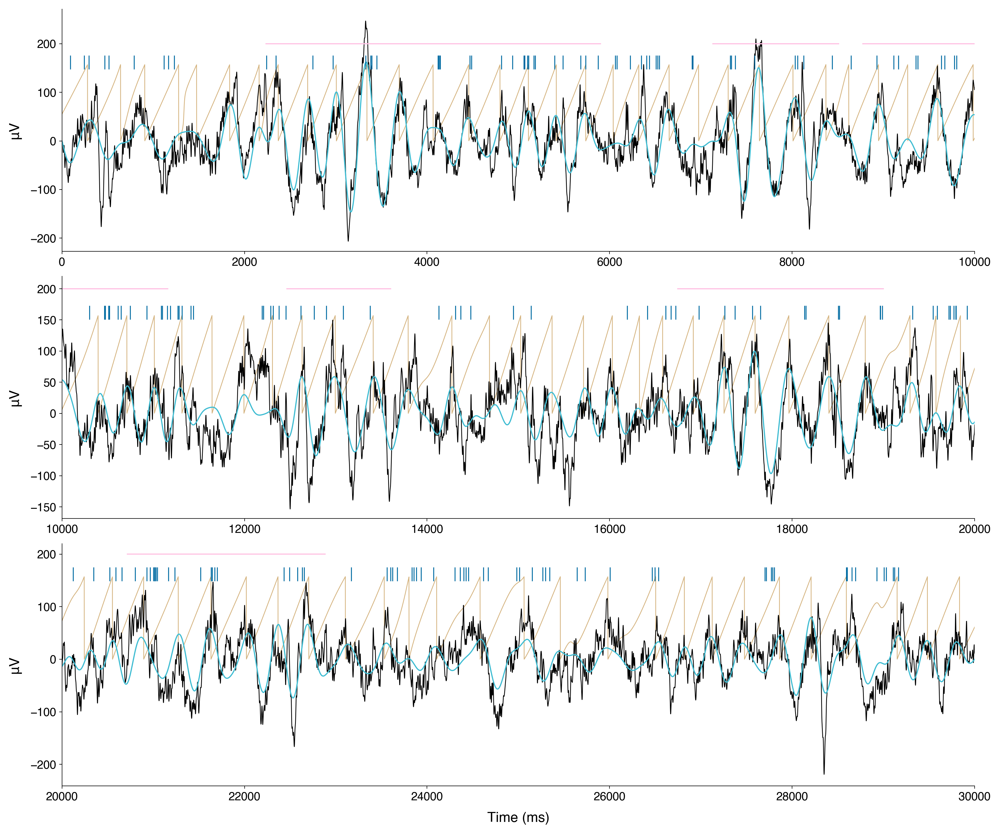

In [108]:
savefig = 0
overwrite = 1
iEvent = 58
dpi = 600
mask_val = 200
# linewidths = [0.67, 1, 1]
# alphas = [1, 1, 1]
# linecolors = [co['b'], co['c'], co['p1']]
# linestyles = ['-', ':', '-']
linewidths = [0.67, 0.67, 1, 1]
alphas = [1, 1, 1, 1]
linecolors = [co['a2'], co['k'], co['c'], co['p1']]
linestyles = ['-', '-', ':', '-']
output_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/figs2/lfp_traces'

# --------------------
sr = event_eeg.sr
filt_eeg = mne.filter.filter_data(event_eeg.values[iEvent, iChan, event_eeg.buffer:event_eeg.time.size-event_eeg.buffer],
                                  sr, l_freq=freqs[iFreq]*0.9, h_freq=freqs[iFreq]*1.1,
                                  verbose=False)

if (osc_mask.buffer > 0) and not (osc_mask.clip_buffer):
    _osc_mask = mask_val * osc_mask.astype(float)[iEvent, iChan, iFreq, osc_mask.buffer:osc_mask.time.size-osc_mask.buffer].values
else:
    _osc_mask = mask_val * osc_mask.astype(float)[iEvent, iChan, iFreq, :].values
_osc_mask[_osc_mask==0] = np.nan

spike_times = event_time_spikes.query("(event_idx=={})".format(iEvent))['spike_times'].iloc[0]
spike_train = np.zeros(_osc_mask.size)
spike_train[spike_times] = 1

dat = np.vstack((
    ((phase[iEvent, iChan, iFreq, :] + np.pi) % _2pi) * 25,
    event_eeg.values[iEvent, iChan, event_eeg.buffer:event_eeg.time.size-event_eeg.buffer],
    filt_eeg,  
    _osc_mask)
)
spike_dat = spike_train

plt.close()

clip_event = False
if clip_event:
    fig, ax = plot_trace(dat, spike_dat=spike_dat, start=27500, duration=2500, x_units='ms', sampling_rate=sr,
                         nwin=1, figsize=(colws[3], colws[3]*0.33),#15),#30),
                         colors=linecolors, linewidths=linewidths, linestyles=linestyles, alphas=alphas,
                         sub_mean=False, same_yaxis=False, conv_to_muv=False, create_spread=False,
                         markers=['|'], spike_colors=[_colors['obs']])
else:
    fig, ax = plot_trace(dat, spike_dat=spike_dat, start=0, duration=30000, x_units='ms', sampling_rate=sr,
                         nwin=3, figsize=(12, 10),#15),#30),
                         colors=linecolors, linewidths=linewidths, alphas=alphas,
                         sub_mean=False, same_yaxis=False, conv_to_muv=False, create_spread=False,
                         markers=['|'], spike_colors=[_colors['obs']])

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta', 'figs2', 'example_units',
                       '-'.join([unit_lfp['subj_sess_unit'],
                                 unit_lfp['edge'],
                                 '{}_to_{}_ch{}'.format(unit_lfp['unit_hemroi'],
                                                        unit_lfp['lfp_hemroi'],
                                                        unit_lfp['lfp_chans'][iChan]),
                                 'trial{}_{}'.format(event_eeg.event.values[iEvent][1],
                                                     event_eeg.event.values[iEvent][0]),
                                 str(unit_lfp['max_z_mrl_freq'])+'Hz']) + '-example_trace.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))

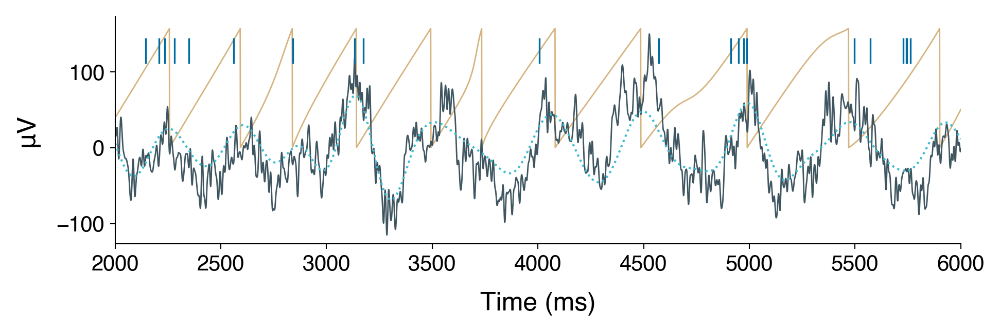

In [112]:
savefig = 0
overwrite = 1
iEvent = 13
dpi = 600
mask_val = 200
# linewidths = [0.67, 1, 1]
# alphas = [1, 1, 1]
# linecolors = [co['b'], co['c'], co['p1']]
# linestyles = ['-', ':', '-']
linewidths = [0.67, 0.67, 1, 1]
alphas = [1, 1, 1, 1]
linecolors = [co['a2'], co['x4'], co['c'], co['p1']]
linestyles = ['-', '-', ':', '-']
output_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/figs2/lfp_traces'

# --------------------
sr = event_eeg.sr
filt_eeg = mne.filter.filter_data(event_eeg.values[iEvent, iChan, event_eeg.buffer:event_eeg.time.size-event_eeg.buffer],
                                  sr, l_freq=freqs[iFreq]*0.9, h_freq=freqs[iFreq]*1.1,
                                  verbose=False)

if (osc_mask.buffer > 0) and not (osc_mask.clip_buffer):
    _osc_mask = mask_val * osc_mask.astype(float)[iEvent, iChan, iFreq, osc_mask.buffer:osc_mask.time.size-osc_mask.buffer].values
else:
    _osc_mask = mask_val * osc_mask.astype(float)[iEvent, iChan, iFreq, :].values
_osc_mask[_osc_mask==0] = np.nan

spike_times = event_time_spikes.query("(event_idx=={})".format(iEvent))['spike_times'].iloc[0]
spike_train = np.zeros(_osc_mask.size)
spike_train[spike_times] = 1

dat = np.vstack((
    ((phase[iEvent, iChan, iFreq, :] + np.pi) % _2pi) * 25,
    event_eeg.values[iEvent, iChan, event_eeg.buffer:event_eeg.time.size-event_eeg.buffer],
    filt_eeg,  
    _osc_mask)
)
spike_dat = spike_train

plt.close()

clip_event = True
if clip_event:
    fig, ax = plot_trace(dat, spike_dat=spike_dat, start=2000, duration=4000, x_units='ms', sampling_rate=sr,
                         nwin=1, figsize=(colws[3], colws[3]*0.33),#15),#30),
                         colors=linecolors, linewidths=linewidths, linestyles=linestyles, alphas=alphas,
                         sub_mexan=False, same_yaxis=False, conv_to_muv=False, create_spread=False,
                         markers=['|'], spike_colors=[_colors['obs']])
else:
    fig, ax = plot_trace(dat, spike_dat=spike_dat, start=0, duration=30000, x_units='ms', sampling_rate=sr,
                         nwin=3, figsize=(12, 10),#15),#30),
                         colors=linecolors, linewidths=linewidths, alphas=alphas,
                         sub_mean=False, same_yaxis=False, conv_to_muv=False, create_spread=False,
                         markers=['|'], spike_colors=[_colors['obs']])

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta', 'figs2', 'example_units',
                       '-'.join([unit_lfp['subj_sess_unit'],
                                 unit_lfp['edge'],
                                 '{}_to_{}_ch{}'.format(unit_lfp['unit_hemroi'],
                                                        unit_lfp['lfp_hemroi'],
                                                        unit_lfp['lfp_chans'][iChan]),
                                 'trial{}_{}'.format(event_eeg.event.values[iEvent][1],
                                                     event_eeg.event.values[iEvent][0]),
                                 str(unit_lfp['max_z_mrl_freq'])+'Hz']) + '-example_trace.pdf')
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))

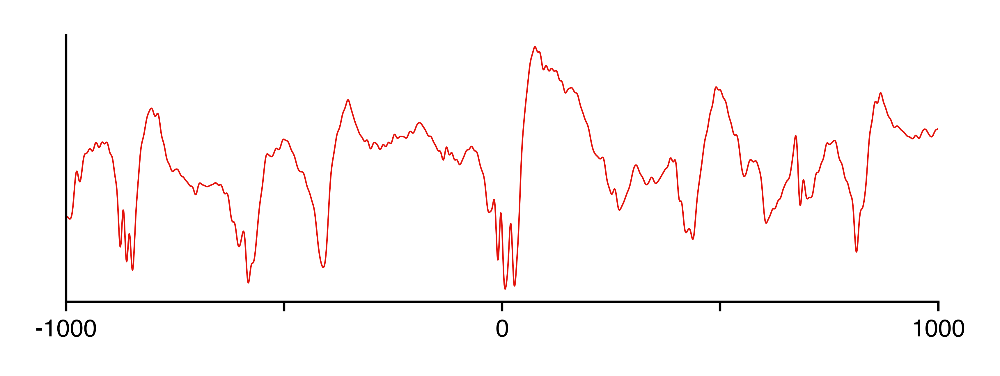

In [2077]:
# Plot single spike-triggered LFP examples.
figsize = (colws[2], colws[2]*0.4)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 7, 'annot': 6}
lw = 0.3
ticklen = 2
tickpad = 1.5
labelpad = 3
spine_lw = 0.5
n_samp = 1

idx = [int(x) for x in np.random.rand(n_samp) * steegs['obs'].shape[0]]

plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

xvals = np.arange(-steeg_dur, steeg_dur+1)
fig, ax = plot_trace(steegs['obs'][idx, :], nwin=1, figsize=figsize, dpi=dpi, fig=fig, ax=ax,
                     x_units='ms', x_inds=xvals,
                     sampling_rate=event_eeg.sr, create_spread=True, conv_to_muv=False,
                     colors=[_colors['obs']]*n_samp, linewidths=[lw]*n_samp,
                     tickfontsize=font['tick'], labelfontsize=font['label'])
iax = 0
_ax = ax[iax]
_ax.tick_params(which='both', labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw)
xticks_steeg = np.linspace(-steeg_dur, steeg_dur, 5).astype(int)
_ax.set_xticks(xticks_steeg[::2])
_ax.set_xticks(xticks_steeg[1::2], minor=True)
_ax.set_xticklabels(xticks_steeg[::2])
_ax.set_yticks([])
_ax.set_xlabel('')
_ax.set_ylabel('')

fig.show()

In [1990]:
# Calculate spike train autocorrelation.
pad = 1200

timer = Timer()

corrs = od([])
for key in ['spike_times', 'spike_times_ma']:
    spike_times = np.sort(np.concatenate([y for y in event_time_spikes.apply(lambda x: x['start_time'] + x[key], axis=1).tolist()
                                          if len(y) > 0]))
    spike_times -= (spike_times[0] - pad)
    spike_train = np.zeros(spike_times[-1] + pad + 1)
    spike_train[spike_times] = 1
    nbins = spike_train.size
    _spike_train = spike_train - np.mean(spike_train)
    corrs[key] = np.array([np.dot(_spike_train[pad:nbins-pad],
                                  _spike_train[pad+step:nbins-pad+step])
                           / np.sum(_spike_train**2)
                           for step in range(-pad, pad+1)])

print(timer)

Ran in 53.5s


U518_ses0-39-1, LMH-LMH, max_z_mrl 30.3, 17Hz


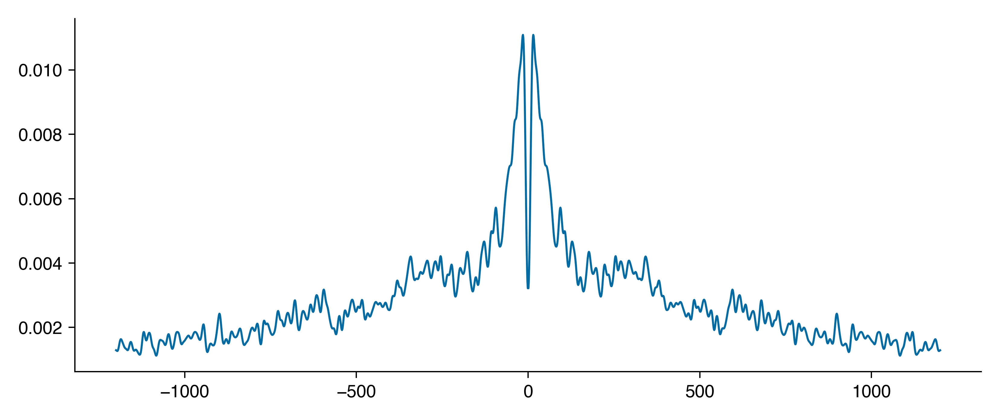

In [1991]:
from scipy.ndimage import gaussian_filter1d

fwhm = 10

# -------------------
sigma = fwhm / 2.35482004503

plt.close()
fig, ax = plt.subplots()
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

for key in ['spike_times_ma']:#corrs:
    xvals = np.concatenate((np.arange(-pad, 0), np.arange(1, pad+1)))
    yvals = gaussian_filter1d(np.concatenate((corrs[key][0:pad], corrs[key][pad+1:])), sigma)
    _ax.plot(xvals, yvals)

print(subj_sess_unit,
      '{}-{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi']),
      'max_z_mrl {:.1f}, {}Hz'.format(unit_lfp['max_z_mrl'], unit_lfp['max_z_mrl_freq']),
      sep=', ')
fig.show()

U539_ses0-27-1, LMH-LMH, max_z_mrl 24.4, 2Hz


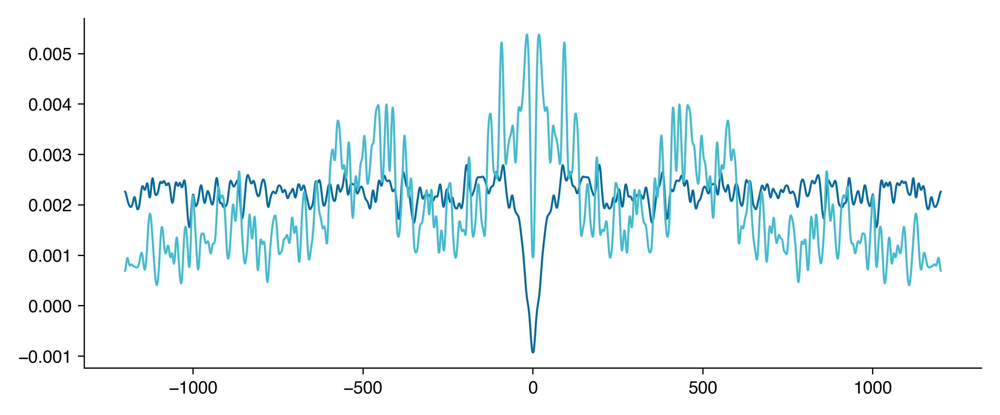

In [462]:
fwhm = 10

# -------------------
sigma = fwhm / 2.35482004503

plt.close()
fig, ax = plt.subplots()
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]

for key in corrs:
    xvals = np.concatenate((np.arange(-pad, 0), np.arange(1, pad+1)))
    yvals = gaussian_filter1d(np.concatenate((corrs[key][0:pad], corrs[key][pad+1:])), sigma)
    _ax.plot(xvals, yvals)

print(subj_sess_unit,
      '{}-{}'.format(unit_lfp['unit_hemroi'], unit_lfp['lfp_hemroi']),
      'max_z_mrl {:.1f}, {}Hz'.format(unit_lfp['max_z_mrl'], unit_lfp['max_z_mrl_freq']),
      sep=', ')
fig.show()

# Region-to-region heatmaps

## Average across subjects

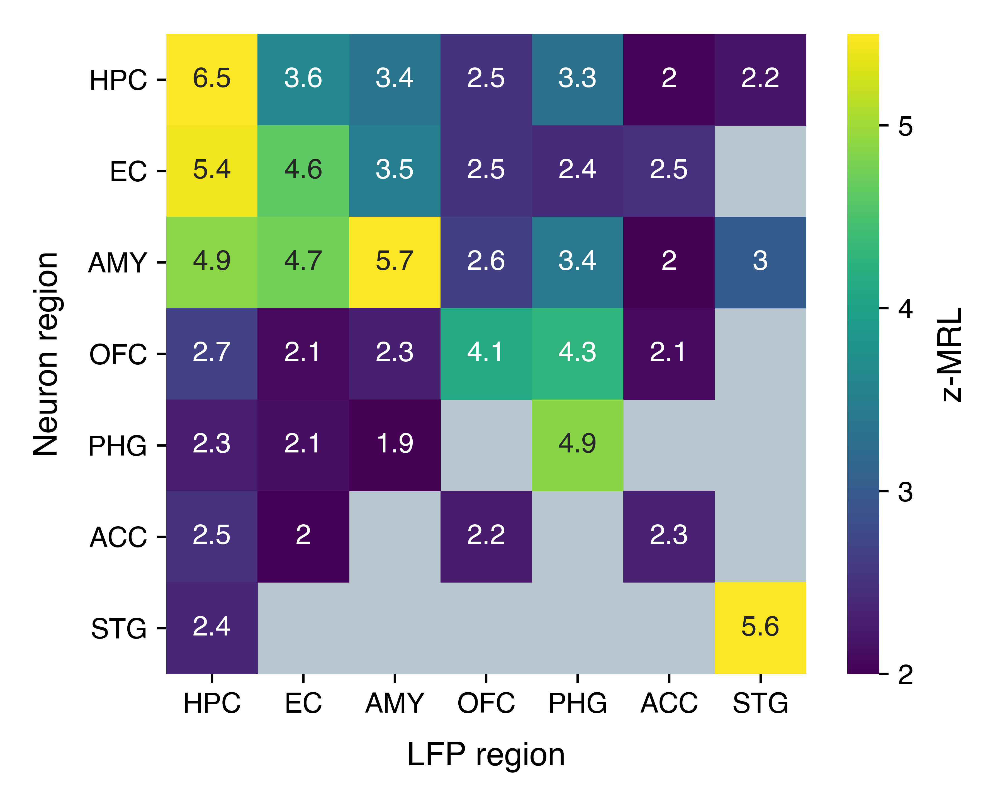

In [3204]:
min_units = 5
min_subj = 4
figsize = (colws[2], colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ax_facecolor = co['x2']
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
xticks = np.arange(len(gen_rois)) + 0.5
xticklabs = gen_rois
yticks = xticks
yticklabs = xticklabs
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'viridis'
vmin = 2
vmax = 5.5
cbarticks = [2, 3, 4, 5]
cbarlab = 'z-MRL'

# --------------------
# Get the data.
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['subj', 'unit_roi_gen', 'lfp_roi_gen'])
      .agg({'max_z_mrl': [len, np.mean]}))
df.columns = ['n_units', 'max_z_mrl']
df = (df
      .query("(n_units>={})".format(min_units))
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({'max_z_mrl': [len, np.mean]}))
df.columns = ['n_subj', 'max_z_mrl']
df = df.unstack('lfp_roi_gen')
mask = np.invert(df['n_subj'] >= min_subj)
dat = df['max_z_mrl']

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat, mask=mask, vmin=vmin, vmax=vmax, ax=_ax, 
                  square=True, cmap=cmap, cbar=True, annot=True)

_ax.set_facecolor(ax_facecolor)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

fig.show()

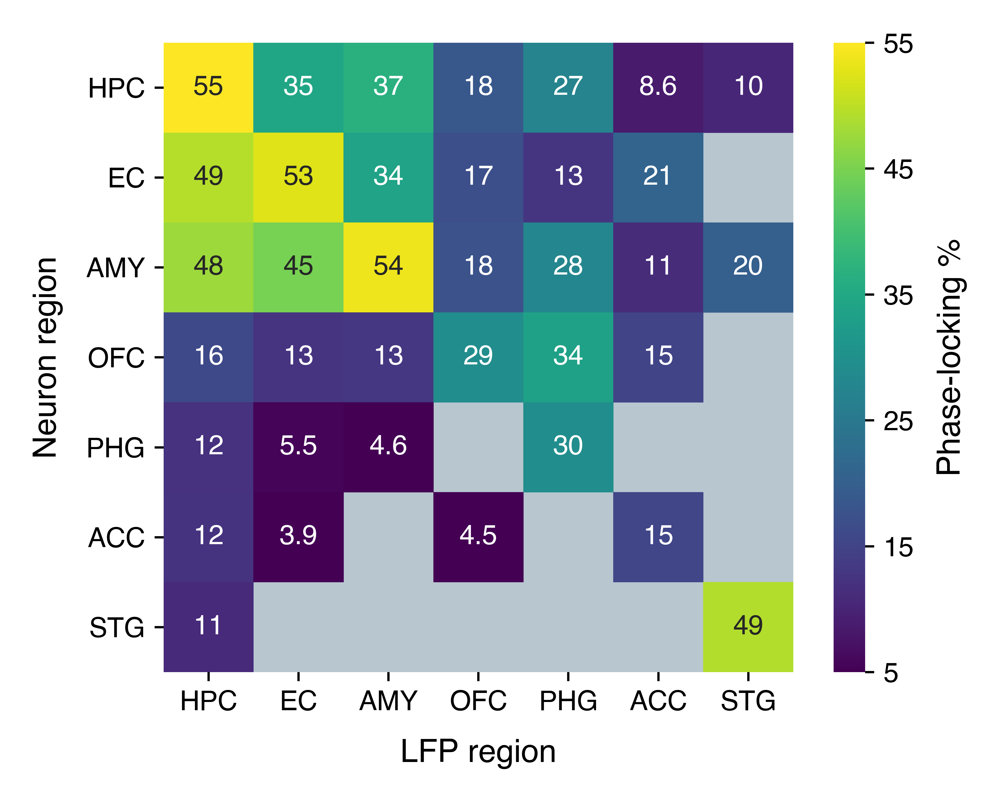

In [3190]:
sig_col = 'sig'
min_units = 5
min_subj = 4
figsize = (colws[2], colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ax_facecolor = co['x2']
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
xticks = np.arange(len(gen_rois)) + 0.5
xticklabs = gen_rois
yticks = xticks
yticklabs = xticklabs
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'viridis'
vmin = 5
vmax = 55
cbarticks = [5, 15, 25, 35, 45, 55]
cbarlab = 'Phase-locking %'

# --------------------
# Get the data.
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['subj', 'unit_roi_gen', 'lfp_roi_gen'])
      .agg({sig_col: [len, np.mean]}))
df.columns = ['n_units', sig_col]
df = (df
      .query("(n_units>={})".format(min_units))
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({sig_col: [len, np.mean]}))
df.columns = ['n_subj', sig_col]
df = df.unstack('lfp_roi_gen')
mask = np.invert(df['n_subj'] >= min_subj)
dat = df[sig_col]
dat *= 100

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat, mask=mask, vmin=vmin, vmax=vmax, ax=_ax,
                  square=True, cmap=cmap, cbar=True, annot=True)

_ax.set_facecolor(ax_facecolor)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

fig.show()

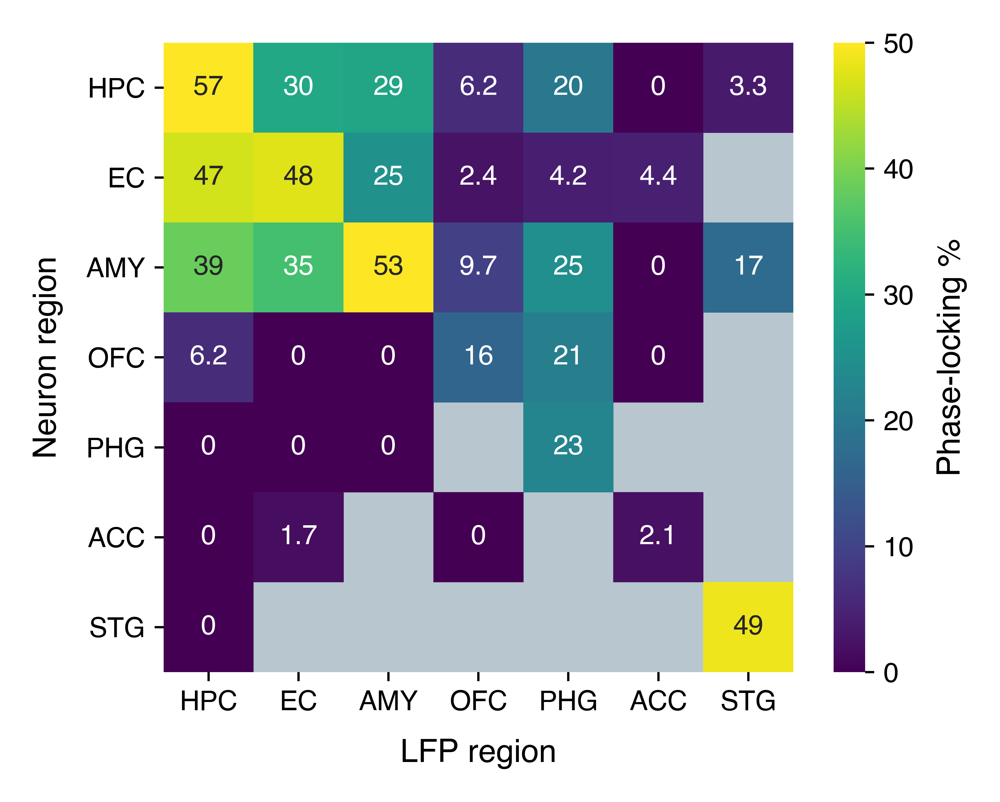

In [3192]:
sig_col = 'sig_fdr'
min_units = 5
min_subj = 4
figsize = (colws[2], colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ax_facecolor = co['x2']
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
xticks = np.arange(len(gen_rois)) + 0.5
xticklabs = gen_rois
yticks = xticks
yticklabs = xticklabs
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'viridis'
vmin = 0
vmax = 50
cbarticks = [0, 10, 20, 30, 40, 50]
cbarlab = 'Phase-locking %'

# --------------------
# Get the data.
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['subj', 'unit_roi_gen', 'lfp_roi_gen'])
      .agg({sig_col: [len, lambda x: 1 * np.mean(x)]}))
df.columns = ['n_units', sig_col]
df = (df
      .query("(n_units>={})".format(min_units))
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({sig_col: [len, np.mean]}))
df.columns = ['n_subj', sig_col]
df = df.unstack('lfp_roi_gen')
mask = np.invert(df['n_subj'] >= min_subj)
dat = df[sig_col]
dat *= 100

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat, mask=mask, vmin=vmin, vmax=vmax, ax=_ax,
                  square=True, cmap=cmap, cbar=True, annot=True)

_ax.set_facecolor(ax_facecolor)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

fig.show()

In [3197]:
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({'subj_sess_unit': lambda x: np.unique(x).size,
            sig_col: lambda x: 1 * np.mean(x)}))
df.columns = ['n_units', sig_col]
df

n_units   sig_fdr
unit_roi_gen lfp_roi_gen                   
HPC          HPC              334  0.583832
             EC               192  0.260417
             AMY              212  0.287736
             OFC              151  0.046358
             PHG              153  0.196078
             ACC               89  0.000000
             STG               59  0.047619
EC           HPC              260  0.423077
             EC               304  0.404605
             AMY              197  0.197970
             OFC              139  0.028777
             PHG              139  0.043165
             ACC              110  0.063636
             STG               66  0.000000
AMY          HPC              335  0.298507
             EC               257  0.217899
             AMY              366  0.459016
             OFC              181  0.127072
             PHG              148  0.195946
             ACC              136  0.000000
             STG               51  0.089552
OFC          HPC              157  0.044586
             EC               108  0.000000
             AMY              135  0.000000
             OFC              167  0.167665
             PHG               42  0.238095
             ACC               55  0.000000
             STG               25  0.000000
PHG          HPC              166  0.000000
             EC               118  0.000000
             AMY              156  0.000000
             OFC               47  0.000000
             PHG              182  0.236264
             ACC               11  0.000000
             STG               16  0.111111
ACC          HPC              106  0.000000
             EC                89  0.044944
             AMY               65  0.000000
             OFC               76  0.052632
             PHG                9  0.000000
             ACC              125  0.056000
             STG                3  0.000000
STG          HPC              127  0.000000
             EC                55  0.000000
             AMY               79  0.000000
             OFC               30  0.000000
             PHG               40  0.000000
             ACC               21  0.000000
             STG              126  0.507937

## Average across neurons

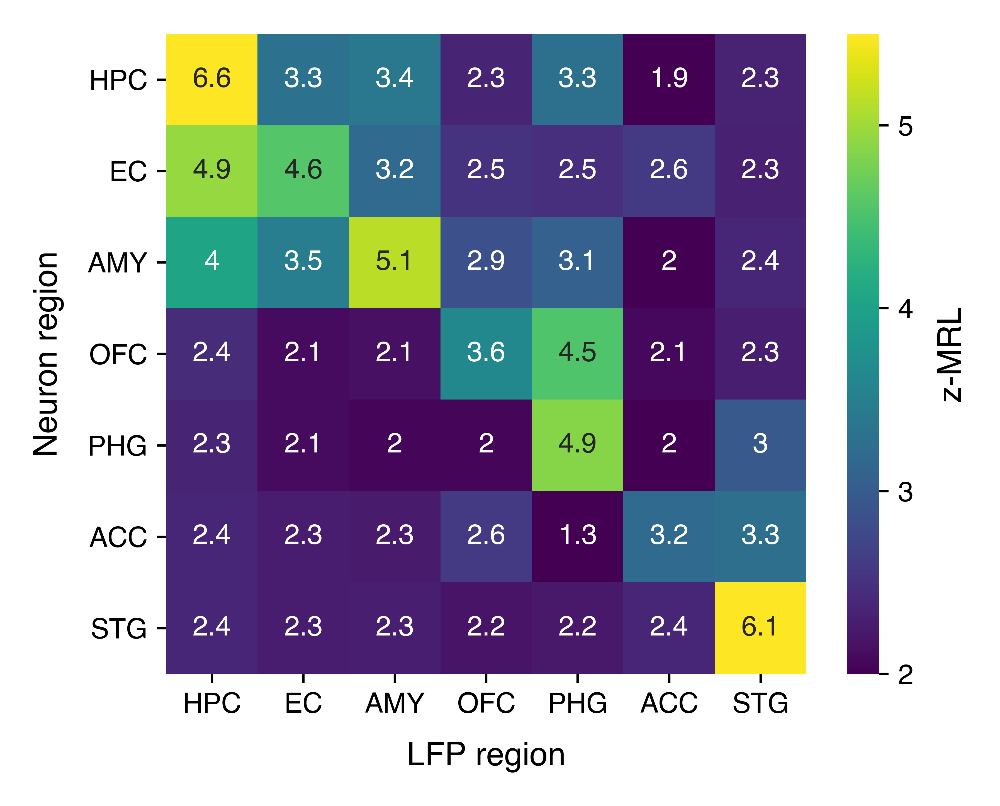

In [3205]:
stat_col = 'max_z_mrl'
min_units = 5
min_subj = 4
figsize = (colws[2], colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ax_facecolor = co['x2']
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
xticks = np.arange(len(gen_rois)) + 0.5
xticklabs = gen_rois
yticks = xticks
yticklabs = xticklabs
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'viridis'
vmin = 2
vmax = 5.5
cbarticks = [2, 3, 4, 5]
cbarlab = 'z-MRL'

# --------------------
# Get the data.
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({'subj_sess_unit': lambda x: np.unique(x).size,
            stat_col: lambda x: 1 * np.mean(x)}))
df.columns = ['n_units', stat_col]
df = df.unstack('lfp_roi_gen')
dat = df[stat_col]

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat, vmin=vmin, vmax=vmax, ax=_ax,
                  square=True, cmap=cmap, cbar=True, annot=True)

_ax.set_facecolor(ax_facecolor)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

fig.show()

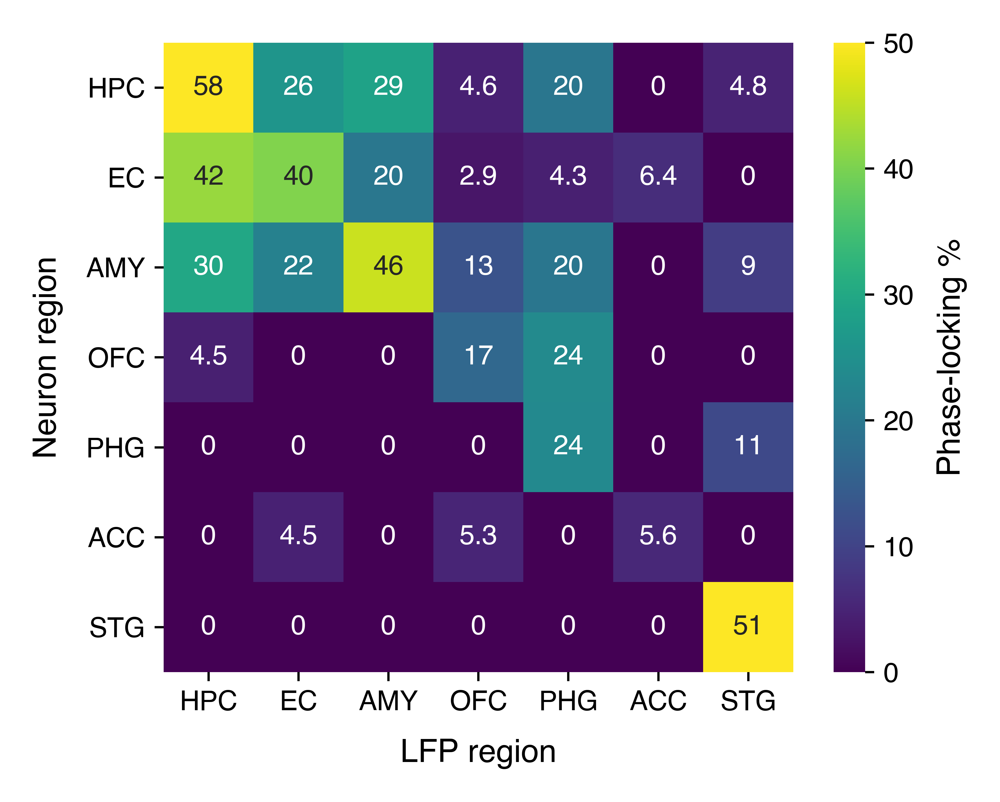

In [3198]:
sig_col = 'sig_fdr'
min_units = 5
min_subj = 4
figsize = (colws[2], colws[2]*0.8)
dpi = 1200
font = {'tick': 6, 'label': 7, 'fig': 11, 'annot': 6}
ax_facecolor = co['x2']
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
xticks = np.arange(len(gen_rois)) + 0.5
xticklabs = gen_rois
yticks = xticks
yticklabs = xticklabs
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'viridis'
vmin = 0
vmax = 50
cbarticks = [0, 10, 20, 30, 40, 50]
cbarlab = 'Phase-locking %'

# --------------------
# Get the data.
df = (pl_mrls
      .query("((same_roi_gen==True) & (is_local==True)) | (same_roi_gen==False)")
      .groupby(['unit_roi_gen', 'lfp_roi_gen'])
      .agg({'subj_sess_unit': lambda x: np.unique(x).size,
            sig_col: lambda x: 1 * np.mean(x)}))
df.columns = ['n_units', sig_col]
df = df.unstack('lfp_roi_gen')
dat = df[sig_col]
dat *= 100

# Make the plot.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat, vmin=vmin, vmax=vmax, ax=_ax,
                  square=True, cmap=cmap, cbar=True, annot=True)

_ax.set_facecolor(ax_facecolor)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

fig.show()

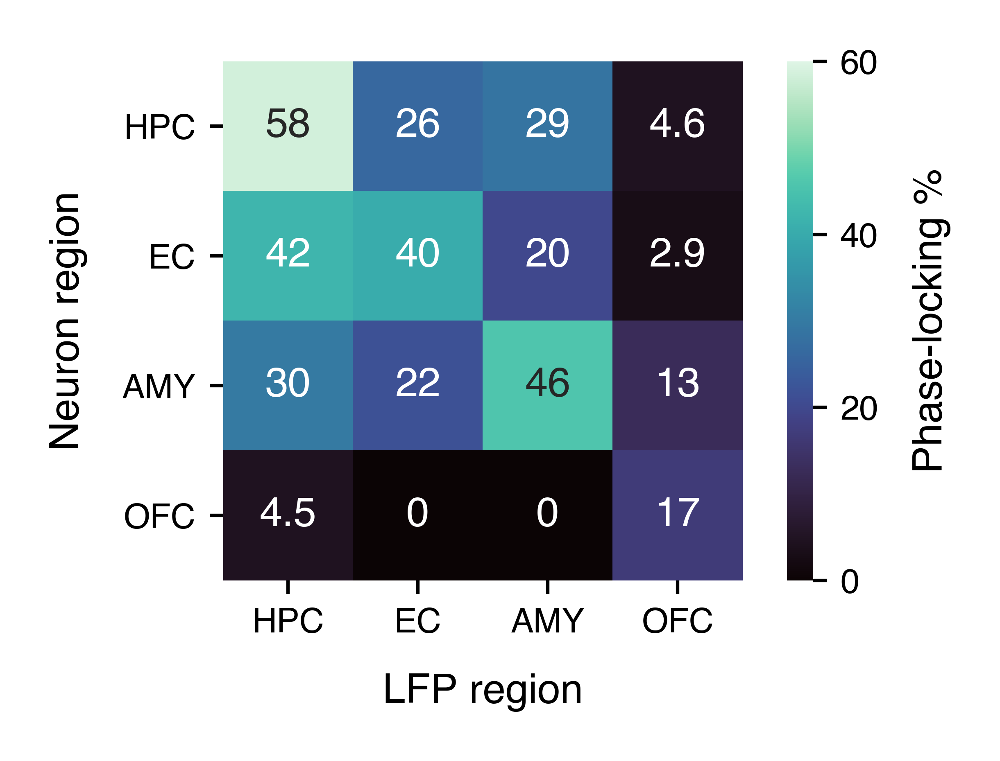

In [3206]:
savefig = 0
overwrite = 0
figsize = (colws[1]*1.5, colws[1]*1.5*0.6)
dpi = 1200
font = {'tick': 5, 'label': 6, 'fig': 8, 'annot': 5}
spine_lw = 0.5
ticklen = 2
tickpad = 2
labelpad = 5
keep_lfp_rois = ['HPC', 'EC', 'AMY', 'OFC']
xticks = np.arange(len(keep_lfp_rois)) + 0.5
xticklabs = keep_lfp_rois
keep_unit_rois = ['HPC', 'EC', 'AMY', 'OFC']
yticks = np.arange(len(keep_unit_rois)) + 0.5
yticklabs = keep_unit_rois
xlab = 'LFP region'
ylab = 'Neuron region'
cmap = 'mako'
vmin = 0
vmax = 60
cbarticks = [0, 20, 40, 60]
cbarlab = 'Phase-locking %'

# --------------------
# Get the data.
dat = (zmrls
       .query("(band=='all')") #  & (unit_roi!=lfp_roi)
       .query("(unit_roi=={}) & (lfp_roi=={})".format(keep_unit_rois, keep_lfp_rois))
       .reset_index()
       .copy())
dat['unit_roi'] = dat['unit_roi'].astype(pd.CategoricalDtype(keep_unit_rois, ordered=True))
dat['lfp_roi'] = dat['lfp_roi'].astype(pd.CategoricalDtype(keep_lfp_rois, ordered=True))
dat = (dat
       .sort_values(['unit_roi', 'lfp_roi'])
       .set_index(['unit_roi', 'lfp_roi'])
       .unstack('lfp_roi'))
#        ['pct_units'])

# ---------------------
# Plot the data.
plt.close()
fig, ax = plt.subplots(1, 1, figsize=figsize, dpi=dpi)
ax = np.ravel(ax)

iax = 0
_ax = ax[iax]
_ax = sns.heatmap(dat['pct_units'],
                  vmin=vmin, vmax=vmax, ax=_ax,
                  square=True, cmap=cmap, cbar=True, annot=True)
_ax.tick_params(labelsize=font['tick'], pad=tickpad, length=ticklen, width=spine_lw, rotation=0)
_ax.set_xticks(xticks)
_ax.set_xticklabels(xticklabs)
_ax.set_xlabel(xlab, fontsize=font['label'], labelpad=labelpad)
_ax.set_yticks(yticks)
_ax.set_yticklabels(yticklabs)
_ax.set_ylabel(ylab, fontsize=font['label'], labelpad=labelpad)
cbar = _ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=font['tick'], length=ticklen, pad=tickpad, width=spine_lw)
cbar.set_ticks(cbarticks)
cbar.set_ticklabels(cbarticks)
cbar.set_label(cbarlab, fontsize=font['label'], labelpad=labelpad)

if savefig:
    filename = op.join('/home1/dscho/projects/unit_activity_and_hpc_theta',
                       'figs2', 'pct_sig', 
                       'pct-sig-fdr_{}-neurons.pdf'
                       .format('-'.join(keep_unit_rois)))
    if overwrite or not op.exists(filename):
        fig.savefig(filename, format='pdf', bbox_inches='tight', pad_inches=0)
        print('Saved {}'.format(filename))
        
fig.show()

# Osc sync analysis

In [5]:
# Load oscillatory sync dataframes.
expmts = ['goldmine', 'ycab']

# ----------------------
data_dirs = {'goldmine': '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine/nav/p_episode',
             'ycab': '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/ycab/p_episode'}

osc_sync = pd.concat([dio.open_pickle(op.join(data_dirs[expmt], 'osc_sync.pkl'))
                      for expmt in expmts], axis=0).reset_index(drop=True)
osc_sync['overlap'] = osc_sync['overlap'].apply(lambda x: [val*100 for val in x])

print('osc_sync: {}'.format(osc_sync.shape))

osc_sync: (330, 11)


In [6]:
def _match(x, osc_sync, return_col='overlap'):
    try:
        return (osc_sync.query("(subj_sess=='{}') & (hemroi1=='{}') & (hemroi2=='{}')"
                        .format(x['subj_sess'],
                                x['unit_hemroi'],
                                x['lfp_hemroi']))[return_col].iloc[0])
    except IndexError:
        return np.nan

In [7]:
pl_mrls['overlap'] = np.nan
idx = pl_mrls.loc[((pl_mrls['edge']=='ctx-hpc') & (pl_mrls['same_hem']==True))].index.tolist()
pl_mrls.loc[idx, 'overlap'] = pl_mrls.loc[idx].apply(lambda x: _match(x, osc_sync, 'overlap'), axis=1)

In [8]:
min_spikes = 50

qry = "(edge=='ctx-hpc') & (same_hem==True) & (max_n_spikes_mask>={}) & (sig==True)".format(min_spikes)

df = pl_mrls.query(qry).copy()
cols = ['expmt', 'subj', 'subj_sess_unit', 'unit_hemroi', 'unit_roi_gen',
        'lfp_hemroi', 'lfp_hpc_div', 'lfp_roi_gen', 'max_z_mrl', 'max_z_mrl_freq',
        'n_spikes_mask', 'peps', 'overlap']
df = df[cols]
for col in ['n_spikes_mask', 'peps', 'overlap']:
    df[col] = df.apply(lambda x: x[col][freqs.tolist().index(x['max_z_mrl_freq'])], axis=1)
df['log_n_spikes_mask'] = df['n_spikes_mask'].apply(np.log10)

,expmt,subj,subj_sess_unit,unit_hemroi,unit_roi_gen,lfp_hemroi,lfp_hpc_div,lfp_roi_gen,max_z_mrl,max_z_mrl_freq,n_spikes_mask,peps,overlap
2,ycab,U369,U369_ses1-1-0,RA,A,RMH,post,HPC,3.925751,7,204.000000,11.763224,46.350693
4,ycab,U369,U369_ses1-17-14,RST,O,RMH,post,HPC,7.364367,7,2568.750000,11.763224,74.347835
19,ycab,U369,U369_ses1-21-18,RST,O,RMH,post,HPC,4.925193,7,1575.250000,11.763224,74.347835
22,ycab,U369,U369_ses1-21-19,RST,O,RMH,post,HPC,4.165393,7,746.875000,11.763224,74.347835
52,ycab,U369,U369_ses1-27-29,RPS,O,RMH,post,HPC,3.350987,7,51.125000,11.763224,4.513472
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5444,goldmine_nav,U539,U539_ses0-39-1,REC,EC,RMH,post,HPC,8.138235,3,125.625000,3.772292,30.019553
5446,goldmine_nav,U539,U539_ses0-50-1,LEC,EC,LMH,post,HPC,8.303659,6,28.250000,2.983358,41.877110
5449,goldmine_nav,U539,U539_ses0-55-1,LEC,EC,LMH,post,HPC,9.244359,4,54.125000,5.181385,42.114090
5478,goldmine_nav,U540,U540_ses0-22-2,RFSG,PHG-FSG,RAH,ant,HPC,4.657114,2,51.714287,4.213849,5.937659


In [14]:
df[['max_z_mrl', 'peps', 'overlap', 'n_spikes_mask', 'log_n_spikes_mask']].corr()

,max_z_mrl,peps,overlap,n_spikes_mask,log_n_spikes_mask
max_z_mrl,1.000000,0.270579,0.097065,0.447513,0.427840
peps,0.270579,1.000000,0.207291,0.511250,0.571965
overlap,0.097065,0.207291,1.000000,0.073858,0.166428
n_spikes_mask,0.447513,0.511250,0.073858,1.000000,0.639745
log_n_spikes_mask,0.427840,0.571965,0.166428,0.639745,1.000000


(array([  1.,   0.,   2.,   8.,  31.,  89., 115.,  67.,  29.,   5.]),
 array([-0.84509802, -0.33924897,  0.16660009,  0.67244914,  1.1782982 ,
         1.68414725,  2.18999631,  2.69584536,  3.20169442,  3.70754347,
         4.21339253]),
 <a list of 10 Patch objects>)

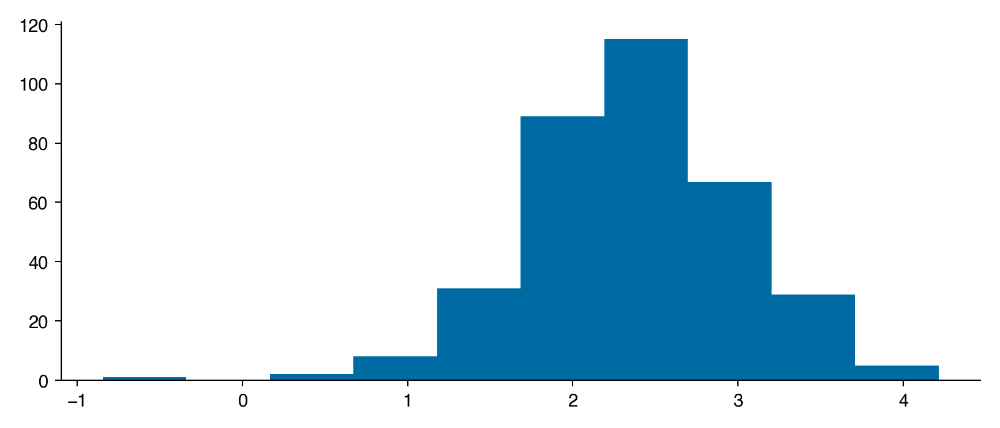

In [12]:
plt.close()
plt.hist(np.log10(df['n_spikes_mask'].values))

In [24]:
mod = smf.mixedlm("max_z_mrl ~ overlap", df, groups=df["subj"])
fit = mod.fit()

print(fit.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: max_z_mrl 
No. Observations: 347     Method:             REML      
No. Groups:       26      Scale:              20.6051   
Min. group size:  2       Log-Likelihood:     -1031.0616
Max. group size:  41      Converged:          Yes       
Mean group size:  13.3                                  
---------------------------------------------------------
            Coef.  Std.Err.    z    P>|z|  [0.025  0.975]
---------------------------------------------------------
Intercept   5.424     0.610  8.886  0.000   4.228   6.620
overlap     0.048     0.020  2.404  0.016   0.009   0.086
Group Var   2.743     0.296                              



In [19]:
mod = smf.mixedlm("max_z_mrl ~ overlap + log_n_spikes_mask", df, groups=df["subj"])
fit = mod.fit()

print(fit.summary())

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  max_z_mrl
No. Observations:    347      Method:              REML     
No. Groups:          26       Scale:               17.4298  
Min. group size:     2        Log-Likelihood:      -999.9463
Max. group size:     41       Converged:           Yes      
Mean group size:     13.3                                   
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         -1.461    0.991 -1.474 0.140 -3.403  0.481
overlap            0.018    0.018  1.011 0.312 -0.017  0.054
log_n_spikes_mask  3.224    0.390  8.269 0.000  2.460  3.988
Group Var          1.765    0.227                           



In [33]:
mod = smf.mixedlm("max_z_mrl ~ peps + overlap + log_n_spikes_mask",
                  df.query("(expmt=='ycab')"),
                  groups=df.query("(expmt=='ycab')")["subj"])
fit = mod.fit()

print(fit.summary())

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  max_z_mrl
No. Observations:    261      Method:              REML     
No. Groups:          17       Scale:               16.2881  
Min. group size:     2        Log-Likelihood:      -743.6638
Max. group size:     41       Converged:           Yes      
Mean group size:     15.4                                   
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         -0.938    1.092 -0.859 0.391 -3.079  1.203
peps               0.077    0.055  1.401 0.161 -0.031  0.185
overlap            0.011    0.021  0.532 0.595 -0.030  0.052
log_n_spikes_mask  2.845    0.488  5.823 0.000  1.887  3.802
Group Var          1.324    0.209                           



In [31]:
mod = smf.mixedlm("max_z_mrl ~ peps + overlap + log_n_spikes_mask",
                  df.query("(expmt=='goldmine_nav')"),
                  groups=df.query("(expmt=='goldmine_nav')")["subj"])
fit = mod.fit()

print(fit.summary())

           Mixed Linear Model Regression Results
Model:               MixedLM  Dependent Variable:  max_z_mrl
No. Observations:    86       Method:              REML     
No. Groups:          9        Scale:               21.0655  
Min. group size:     2        Log-Likelihood:      -257.6757
Max. group size:     28       Converged:           Yes      
Mean group size:     9.6                                    
------------------------------------------------------------
                  Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------
Intercept         -2.014    2.655 -0.759 0.448 -7.219  3.190
peps               0.014    0.091  0.152 0.879 -0.165  0.193
overlap            0.027    0.039  0.686 0.493 -0.050  0.104
log_n_spikes_mask  3.338    1.150  2.903 0.004  1.084  5.592
Group Var          4.544    0.829                           



# Working

In [3278]:
min_spikes = np.count_nonzero(~spike_phases.mask, axis=2) # (chan, freq)

In [3385]:
spike_phases.compressed().size

42799

In [3290]:
n_chan, n_freq = spike_phases.shape[:2]

(7, 30, 6741)

In [3327]:
np.where(np.invert(spike_phases.mask)[iChan, iFreq, :])[0]

array([ 612,  613,  614,  615,  616,  752,  753,  754, 1725, 1726, 3647,
       3648, 3649, 3650, 3651, 3652, 3653, 3654, 3655, 3656, 3657, 3733,
       3734, 3735, 3736, 3737, 3738, 3739, 3740, 3741, 3742, 3743, 3744,
       3745, 4414, 4796, 4797, 4798, 4799, 4800, 4801, 4802, 4803, 5368,
       5549, 5550, 5551, 5552, 5553, 5842, 5843])

In [3335]:
n_chan, n_freq = spike_phases.mask.shape[:2]
_mask = np.ones(spike_phases.mask.shape, dtype=bool)
for iChan in range(n_chan):
    for iFreq in range(n_freq):
        iSpikes = np.random.choice(np.where(np.invert(spike_phases.mask)[iChan, iFreq, :])[0],
                                                      size=np.max((0, min_spikes[iChan, iFreq]-1)),
                                                      replace=False)
        _mask[iChan, iFreq, iSpikes] = False

spike_phases.mask = _mask

In [3337]:
type(spike_phases)

numpy.ma.core.MaskedArray

In [3363]:
def subsample_mask(mask_in, size):
    """Return a randomly subsampled mask, without replacement.
    
    Samples are taken over the last axis. mask_in must be
    3-dimensional, envisioned as chan x freq x spike but
    technically it doesn't *have* to be like this.
    
    Parameters
    ----------
    mask_in : array, shape=(chan, freq, spike), dype=bool
        True = masked values, False = unmasked values.
    size : array, shape=(chan, freq)
        How many unmasked to subsample, without replacement,
        at each channel and frequency.
        
    Returns
    -------
    mask_out : array, shape=mask_in.shape, dtype=bool
        Note if size == np.count_nonzero(~mask_in, axis=2),
        the original mask is returned.
    """
    shp = mask_in.shape
    unmask_in = np.invert(mask_in)
    mask_out = np.ones(mask_in.shape, dtype=bool)
    for ii in range(shp[0]):
        for jj in range(shp[1]):
            kk = np.random.choice(np.where(unmask_in[ii, jj, :])[0],
                                  size=size[ii, jj],
                                  replace=False)
            mask_out[ii, jj, kk] = False
    
    return mask_out

In [3405]:
subj_sess_unit = 'U518_ses1-36-1'
pl_mrls.query("(subj_sess_unit=='{}')".format(subj_sess_unit))

,expmt,subj_sess_unit,subj,subj_sess,unit,unit_hemroi,unit_roi,unit_roi_gen,unit_roi_gen2,n_spikes,fr,lfp_hemroi,lfp_hpc_div,lfp_roi,lfp_roi_gen,lfp_roi_gen2,lfp_chans,edge,is_local,same_hem,same_roi_gen,peps,max_pep,max_pep_freq,n_spikes_mask,max_n_spikes_mask,n_spikes_mask_null,max_n_spikes_mask_null,mrls,max_mrl,max_mrl_freq,mrls_null,max_mrl_null,max_mrl_freq_null,mean_mrls_null,std_mrls_null,pref_phases,max_pref_phase,max_z_pref_phase,z_n_spikes_mask,z_mrls,zmax_zmrl,max_z_mrl,max_z_mrl_freq,max_z_mrl_null,max_z_mrl_freq_null,pval,sig,pval_fdr,sig_fdr
4961,goldmine_nav,U518_ses1-36-1,U518,U518_ses1,36-1,LMH,MH,HPC,HPC,11026,5.10463,LA,,A,AMY,MTL,"[25, 26, 27, 28, 29, 30, 31, 32]",hpc-ctx,False,True,False,"[3.102512254901961, 3.6336213235294115, 3.4784...",3.633621,2,"[374.625, 441.625, 381.75, 365.125, 281.125, 2...",441.625000,"[[383.75, 436.0, 436.875, 391.875, 303.875, 26...",464.763885,"[0.063994765, 0.0612069, 0.06523159, 0.0542710...",0.090001,15,"[[0.06195966154336929, 0.049899905920028687, 0...",0.082344,30,"[0.052947266412898895, 0.039363311611115934, 0...","[0.011492825748097136, 0.009308694804721709, 0...","[-2.1493516, 2.4917343, 3.0837796, 1.9246683, ...",-0.279843,3.083780,"[-1.192869, -1.1504266, -2.7463264, -2.4666305...","[0.9612517505198825, 2.3465790242842526, 3.067...",1.178979,3.067539,3,2.093619,7,0.120879,False,0.211079,False
4962,goldmine_nav,U518_ses1-36-1,U518,U518_ses1,36-1,LMH,MH,HPC,HPC,11026,5.10463,LMH,post,MH,HPC,HPC,"[34, 35, 37, 38, 39, 40]",hpc-local,True,True,True,"[2.3467075163398694, 15.36766339869281, 20.963...",20.963962,3,"[301.33334, 1874.8334, 2429.3333, 1184.8334, 3...",2429.333252,"[[273.5, 1908.8334, 2487.8333, 1323.5, 421.333...",2566.720703,"[0.12076901, 0.16245654, 0.1411905, 0.10689696...",0.335394,14,"[[0.07616202533245087, 0.04174530506134033, 0....",0.115698,1,"[0.08650956067070364, 0.019766942268237473, 0....","[0.023666388695789513, 0.00739028808308957, 0....","[-2.6887035, 2.9724708, 2.803341, 2.8108833, 2...",-1.158491,-1.210320,"[1.3290573, -0.9315508, -2.677126, -4.8682423,...","[1.4475993259374604, 19.307718235200955, 20.65...",38.218292,32.162934,16,2.179522,2,0.000999,True,0.001324,True
4963,goldmine_nav,U518_ses1-36-1,U518,U518_ses1,36-1,LMH,MH,HPC,HPC,11026,5.10463,LSTS,,STS,STG,CTX,"[57, 58, 59, 60, 61, 62, 63, 64]",hpc-ctx,False,True,False,"[6.388645833333334, 20.04018995098039, 20.9639...",20.963928,3,"[817.0, 2532.0, 2543.75, 1039.5, 252.75, 175.1...",2543.750000,"[[878.125, 2518.625, 2612.625, 1029.75, 218.75...",2600.493408,"[0.050249834, 0.025165793, 0.023856824, 0.0204...",0.133899,19,"[[0.057716771960258484, 0.01489670854061842, 0...",0.122353,16,"[0.03364700703229755, 0.01589445797353983, 0.0...","[0.010123945648154591, 0.006170819318170126, 0...","[-2.2032182, -0.10742103, 0.36804274, -2.35846...",1.977679,1.977679,"[-0.44752336, 0.27998874, -1.0043412, -1.97194...","[1.6399561157623308, 1.502447908947428, 1.4739...",0.599066,2.657482,19,2.157040,1,0.248751,False,0.594406,False
4964,goldmine_nav,U518_ses1-36-1,U518,U518_ses1,36-1,LMH,MH,HPC,HPC,11026,5.10463,LPHG,,PHG,PHG,MTL,"[41, 42, 43, 44, 45, 46, 48]",hpc-ctx,False,True,False,"[2.979908963585434, 2.7068557422969186, 3.9055...",3.905504,3,"[364.7143, 302.2857, 460.0, 325.2857, 201.4285...",460.000000,"[[363.42856, 342.2857, 494.2857, 344.2857, 213...",501.278870,"[0.037792485, 0.058549706, 0.05833265, 0.04529...",0.130814,15,"[[0.07843956351280212, 0.052326686680316925, 0...",0.125122,14,"[0.05724491172283888, 0.047695654951035976, 0....","[0.01233862787422367, 0.011230648568664799, 0....","[-1.7551364, 1.1558332, 1.9805367, 2.7572942, ...",-1.667413,1.980537,"[-0.054132488, -3.184735, -2.178228, -1.796259...","[-1.5765469802486884, 0.9664669743161357, 2.27...",0.231802,2.270416,3,2.118606,12,0.372627,False,0.557656,False


In [3696]:
subj_sess_unit = 'U518_ses1-36-1'
unit = spikes.query("(subj_sess_unit=='{}')".format(subj_sess_unit)).iloc[0]

timer = Timer()

def unit_to_lfp_phase_locking_goldmine_game_states(
    unit,
    n_rois=8,
    keep_same_hem=[True, False],
    keep_edges=['hpc-local', 'hpc-hpc', 'hpc-ctx', 'ctx-local', 'ctx-hpc', 'ctx-ctx'],
    exclude_gen_rois=[],
    mask_phase=True,
    match_spikes=True,
    n_perm=1000,
    data_dir='/home1/dscho/projects/unit_activity_and_hpc_theta/data2',
    output_dir='/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine/game_states/phase_locking',
    save_output=True,
    overwrite=True
):
    """Calculate unit's phase-locking to hippocampal oscillations
    across all 4 Goldmine game states (Delay1, Encoding, Delay2, Retrieval)
    and in each state, separately (matched for spikes within each
    channel, frequency pair).

    Parameters
    ----------
    unit : dict or series
        Contains the spike times vector and identifying info for a unit.
    expmt : str, 'goldmine' | 'ycab'
        Indicates which dataset we're working with.
    game_states : array
        Event intervals to include in the analysis.
    freqs : array
        Frequencies at which spike-phase relations are analyzed.
    n_rois : int
        Number of meta-regions to assign for categorization.
    keep_same_hem : list[bool]
        Which hemispheric connections to process. Default is to run both
        ipsilateral and contralateral.
    keep_edges : list[str]
        Define the edges to be processed. Default is to analyze all
        electrode pairs.
    exclude_gen_rois : list[str]
        Exclude LFP gen_roi regions in this list.
    match_spikes : bool
        If True, will find the minimum number of spikes between
        'lfp_and_unit' and 'lfp_not_unit' masks at each channel and
        frequency, and subsample that many spikes (without replacement)
        from each mask.
    n_perm : int
        Number of permutations drawn to construst the null distribution.
        For each permutation, spike times are circ-shifted at random
        within each event, and phase-locking values at each frequency
        are recalculcated across events.
    alpha : float
        Defines the significance threshold for the phase-locking
        empirical p-value.
    data_dir : str
        Filepath to the location where saved inputs are stored.
    output_dir : str | None
        Filepath to the location where the output file is saved.
    save_output : bool
        Output is saved only if True.
    overwrite : bool
        If False and saved output already exists, it is simply returned
        at the top of this function. Otherwise phase-locking is
        calculated and, if save_output is True, any existing output file
        is overwritten.
    verbose : bool
        If True, some info is printed to the standard output.
        
    Returns
    -------
    pl_mrls : dataframe
        Each row corresponds to one unit -> LFPs from one microwire
        bundle.
    """
    expmt = 'goldmine'
    game_states = ['Delay1', 'Encoding', 'Delay2', 'Retrieval']
    
    # ------------------------------------
    mont = spike_preproc.get_montage(unit['subj_sess'])
    roi_map = spike_preproc.roi_mapping(n=n_rois)
    hpc_rois = ['AH', 'MH', 'PH']
    process_pairs = _get_process_pairs(mont,
                                       unit['hemroi'],
                                       keep_same_hem,
                                       keep_edges,
                                       exclude_gen_rois,
                                       roi_map)

    pl_mrls = []
    for (unit_hemroi, lfp_hemroi) in process_pairs:
        # ------------------------------------
        # Data loading

        # Determine which regions we're looking at.
        same_hem = (unit_hemroi[0] == lfp_hemroi[0])
        edge = _get_edge(unit_hemroi, lfp_hemroi)
        unit_roi_gen = roi_map[unit_hemroi[1:]]
        lfp_roi_gen = roi_map[lfp_hemroi[1:]]
        same_roi_gen = (unit_roi_gen == lfp_roi_gen)        

        event_times = {}
        event_time_spikes = {}
        phase = {}
        osc_mask = {}
        for game_state in game_states:
            # Load event_times.
            event_times[game_state] = load_event_times(unit['subj_sess'],
                                                       expmt=expmt,
                                                       game_states=[game_state],
                                                       data_dir=data_dir)

            # Calculate spike times relative to the start of each event.
            event_time_spikes[game_state] = load_event_time_spikes(event_times[game_state],
                                                                   unit['spike_times'])

            delay_and_nav = np.all((np.any(np.isin(game_states, ['Delay1', 'Delay2'])),
                                    np.any(np.isin(game_states, ['Encoding', 'Retrieval']))))

            # Load phase values for each event.
            _data_dir = op.join(data_dir, 'goldmine', 'delay' if 'Delay' in game_state else 'nav')
            basename_lfp = '{}-{}.pkl'.format(unit['subj_sess'], lfp_hemroi)
            phase[game_state] = dio.open_pickle(op.join(_data_dir, 'spectral', 'phase', basename_lfp))
            phase[game_state] = phase[game_state].sel(gameState=game_state)
            if (phase[game_state].buffer > 0) & (not phase[game_state].clip_buffer):
                phase[game_state] = phase[game_state].loc[:, :, :, phase[game_state].buffer:phase[game_state].time.size-phase[game_state].buffer-1]
                phase[game_state].attrs['clip_buffer'] = True
            lfp_chans = [chan for chan in phase[game_state].chan.values
                         if chan not in [unit['chan']]]
            if unit['chan'] in phase[game_state].chan:
                phase[game_state] = phase[game_state].loc[{'chan': lfp_chans}]
            if not np.array_equal(phase[game_state].freq.values, freqs):
                phase[game_state] = phase[game_state].loc[{'freq': [freq for freq in phase[game_state].freq.values
                                                                    if freq in freqs]}]
            if np.nanmax(phase[game_state].values) > np.pi:
                phase[game_state] -= np.pi # convert values back to -π to π, with -π being the trough.

            # Load the P-episode mask for each event.
            osc_mask[game_state] = dio.open_pickle(op.join(_data_dir, 'p_episode', basename_lfp))
            osc_mask[game_state] = osc_mask[game_state].sel(gameState=game_state)
            if (osc_mask[game_state].buffer > 0) & (not osc_mask[game_state].clip_buffer):
                osc_mask[game_state] = osc_mask[game_state].loc[:, :, :, osc_mask[game_state].buffer:osc_mask[game_state].time.size-osc_mask[game_state].buffer-1]
                osc_mask[game_state].attrs['clip_buffer'] = True
            if unit['chan'] in osc_mask[game_state].chan:
                osc_mask[game_state] = osc_mask[game_state].loc[{'chan': lfp_chans}]
            if not np.array_equal(osc_mask[game_state].freq.values, freqs):
                osc_mask[game_state] = osc_mask[game_state].loc[{'freq': [freq for freq in osc_mask[game_state].freq.values
                                                                          if freq in freqs]}]

            # Ensure that phase, oscillation mask, and spike_times are all in the same event order.
            assert np.array_equal(phase[game_state].trial.values, osc_mask[game_state].trial.values)
            assert np.array_equal(phase[game_state].trial.values, event_time_spikes[game_state]['trial'].values)

        # Remove channels that aren't common to all game states.
        keep_chans = list(set(phase['Delay1'].chan.values) & set(phase['Encoding'].chan.values))
        for game_state in game_states:
            phase[game_state] = phase[game_state].loc[{'chan': keep_chans}]
            osc_mask[game_state] = osc_mask[game_state].loc[{'chan': keep_chans}]
        assert np.array_equal(phase['Delay2'].chan.values, osc_mask['Retrieval'].chan.values)

        # Calculate P-episode at each frequency, across channels and events.
        peps = {}
        max_pep = {}
        max_pep_freq = {}
        for game_state in game_states:
            peps[game_state] = 100 * osc_mask[game_state].mean(dim=('trial', 'chan', 'time')).values
            max_pep[game_state] = peps[game_state].max()
            max_pep_freq[game_state] = freqs[peps[game_state].argmax()]
        for key in ['all', 'all_matched']:
            peps[key] = np.mean([peps['Delay1'],
                                 peps['Encoding'], peps['Encoding'], peps['Encoding'],
                                 peps['Delay2'],
                                 peps['Retrieval'], peps['Retrieval'], peps['Retrieval']],
                                axis=0)
            max_pep[key] = peps[key].max()
            max_pep_freq[key] = peps[key].argmax()

        # ------------------------------------
        # Calculate real phase-locking
        n_chan = phase['Delay1'].chan.size
        n_freq = phase['Delay1'].freq.size
        mask_keys = ['all', 'all_matched'] + game_states

        # Get a masked array of spike phases, across events, during active
        # oscillations at each channel and frequency.
        spike_phases = {}
        for game_state in game_states:
            event_dur = phase[game_state].time.size
            if mask_phase:
                spike_phases[game_state] = np.ma.concatenate(event_time_spikes[game_state].apply(
                    lambda x: get_spike_phases(x['spike_times'],
                                               phase[game_state].values[x['event_idx'], :, :, :],
                                               mask=np.invert(osc_mask[game_state].values[x['event_idx'], :, :, :]),
                                               event_dur=event_dur,
                                               circshift=False),
                    axis=1).tolist(), axis=-1) # chan x freq x spike
            else:
                spike_phases[game_state] = np.ma.concatenate(event_time_spikes[game_state].apply(
                    lambda x: get_spike_phases(x['spike_times'],
                                               phase[game_state].values[x['event_idx'], :, :, :],
                                               mask=None,
                                               event_dur=event_dur,
                                               circshift=False),
                    axis=1).tolist(), axis=-1) # chan x freq x spike

        # Calculate mean resultant lengths for each channel and frequency.
        mrls = {}
        n_spikes_mask = {}
        pref_phases = {}
        mrls['all'] = np.nanmean([[
            circstats.circmoment(np.concatenate([spike_phases[game_state][iChan, iFreq, :].compressed()
                                                 for game_state in game_states]))[1]
            for iFreq in range(n_freq)]
            for iChan in range(n_chan)],
            axis=0).astype(np.float32) # (freq,)

        # Log how many spikes were counted per frequency,
        # taking the mean across channels.
        n_spikes_mask['all'] = np.nanmean([[
            np.concatenate([spike_phases[game_state][iChan, iFreq, :].compressed()
                            for game_state in game_states]).size
            for iFreq in range(n_freq)]
            for iChan in range(n_chan)],
            axis=0).astype(np.float32) # (freq,)

        # Get the preferred phase at each frequency, across channels.
        pref_phases['all'] = np.array([
            circstats.circmoment(np.concatenate([spike_phases[game_state][:, iFreq, :].flatten().compressed()
                                                 for game_state in game_states]))[0]
            for iFreq in range(n_freq)]).astype(np.float32) # (freq,)

        # Match the number of spikes sampled between game states, at each channel and frequency.
        if match_spikes:
            n_spikes = np.min([np.count_nonzero(~spike_phases[game_state].mask, axis=2)
                               for game_state in game_states], axis=0) # (chan, freq)
            for game_state in game_states:
                spike_phases[game_state].mask = subsample_mask(spike_phases[game_state].mask, size=n_spikes)

        # Calculate mean resultant lengths for each channel and frequency.
        mrls['all_matched'] = np.nanmean([[
            circstats.circmoment(np.concatenate([spike_phases[game_state][iChan, iFreq, :].compressed()
                                                 for game_state in game_states]))[1]
            for iFreq in range(n_freq)]
            for iChan in range(n_chan)],
            axis=0).astype(np.float32) # (freq,)

        # Log how many spikes were counted per frequency,
        # taking the mean across channels.
        n_spikes_mask['all_matched'] = np.nanmean([[
            np.concatenate([spike_phases[game_state][iChan, iFreq, :].compressed()
                            for game_state in game_states]).size
            for iFreq in range(n_freq)]
            for iChan in range(n_chan)],
            axis=0).astype(np.float32) # (freq,)

        # Get the preferred phase at each frequency, across channels.
        pref_phases['all_matched'] = np.array([
            circstats.circmoment(np.concatenate([
                spike_phases[game_state][:, iFreq, :].flatten().compressed()
                for game_state in game_states]))[0]
            for iFreq in range(n_freq)]).astype(np.float32) # (freq,)

        for game_state in game_states:
            # Calculate mean resultant lengths for each channel and frequency.
            mrls[game_state] = np.nanmean([[
                circstats.circmoment(spike_phases[game_state][iChan, iFreq, :].compressed())[1]
                for iFreq in range(spike_phases[game_state].shape[1])]
                for iChan in range(spike_phases[game_state].shape[0])],
                axis=0).astype(np.float32) # (freq,)

            # Log how many spikes were counted per frequency,
            # taking the mean across channels.
            n_spikes_mask[game_state] = np.nanmean([[spike_phases[game_state][iChan, iFreq, :].flatten().compressed().size
                                                     for iFreq in range(spike_phases[game_state].shape[1])]
                                                    for iChan in range(spike_phases[game_state].shape[0])], axis=0).astype(np.float32) # (freq,)

            # Get the preferred phase at each frequency, across channels.
            pref_phases[game_state] = np.array([circstats.circmoment(spike_phases[game_state][:, iFreq, :].flatten().compressed())[0]
                                                for iFreq in range(spike_phases[game_state].shape[1])]).astype(np.float32) # (freq,)

        # ------------------------------------
        # Calculate null phase-locking
        mrls_null = {key: [] for key in mask_keys}
        n_spikes_mask_null = {key: [] for key in mask_keys}
        for iPerm in range(n_perm):
            # Get a masked array of spike phases, across events, during active
            # oscillations at each channel and frequency.
            _spike_phases_null = {}
            for game_state in game_states:
                event_dur = phase[game_state].time.size
                if mask_phase:
                    _spike_phases_null[game_state] = np.ma.concatenate(event_time_spikes[game_state].apply(
                        lambda x: get_spike_phases(x['spike_times'],
                                                   phase[game_state].values[x['event_idx'], :, :, :],
                                                   mask=np.invert(osc_mask[game_state].values[x['event_idx'], :, :, :]),
                                                   event_dur=event_dur,
                                                   circshift=True),
                        axis=1).tolist(), axis=-1) # chan x freq x spike
                else:
                    _spike_phases_null[game_state] = np.ma.concatenate(event_time_spikes[game_state].apply(
                        lambda x: get_spike_phases(x['spike_times'],
                                                   phase[game_state].values[x['event_idx'], :, :, :],
                                                   mask=None,
                                                   event_dur=event_dur,
                                                   circshift=True),
                        axis=1).tolist(), axis=-1) # chan x freq x spike

            # Calculate mean resultant lengths for each channel and frequency.
            mrls_null['all'].append(np.nanmean([[
                circstats.circmoment(np.concatenate([_spike_phases_null[game_state][iChan, iFreq, :].compressed()
                                                     for game_state in game_states]))[1]
                for iFreq in range(n_freq)]
                for iChan in range(n_chan)],
                axis=0).astype(np.float32).tolist()) # (freq,)

            # Log how many spikes were counted per frequency,
            # taking the mean across channels.
            n_spikes_mask_null['all'].append(np.nanmean([[
                np.concatenate([_spike_phases_null[game_state][iChan, iFreq, :].compressed()
                                for game_state in game_states]).size
                for iFreq in range(n_freq)]
                for iChan in range(n_chan)],
                axis=0).astype(np.float32).tolist()) # (freq,)

            # Match the number of spikes sampled between game states, at each channel and frequency.
            if match_spikes:
                n_spikes_null = np.min([np.count_nonzero(~_spike_phases_null[game_state].mask, axis=2)
                                        for game_state in game_states], axis=0) # (chan, freq)
                for game_state in game_states:
                    _spike_phases_null[game_state].mask = subsample_mask(_spike_phases_null[game_state].mask, size=n_spikes_null)

            # Calculate mean resultant lengths for each channel and frequency.
            mrls_null['all_matched'].append(np.nanmean([[
                circstats.circmoment(np.concatenate([_spike_phases_null[game_state][iChan, iFreq, :].compressed()
                                                     for game_state in game_states]))[1]
                for iFreq in range(n_freq)]
                for iChan in range(n_chan)],
                axis=0).astype(np.float32).tolist()) # (freq,)

            # Log how many spikes were counted per frequency,
            # taking the mean across channels.
            n_spikes_mask_null['all_matched'].append(np.nanmean([[
                np.concatenate([_spike_phases_null[game_state][iChan, iFreq, :].compressed()
                                for game_state in game_states]).size
                for iFreq in range(n_freq)]
                for iChan in range(n_chan)],
                axis=0).astype(np.float32).tolist()) # (freq,)

            for game_state in game_states:
                # Calculate mean resultant lengths for each channel and frequency.
                mrls_null[game_state].append(np.nanmean([[
                    circstats.circmoment(_spike_phases_null[game_state][iChan, iFreq, :].compressed())[1]
                    for iFreq in range(_spike_phases_null[game_state].shape[1])]
                    for iChan in range(_spike_phases_null[game_state].shape[0])],
                    axis=0).astype(np.float32).tolist()) # (freq,)

                # Log how many spikes were counted per frequency,
                # taking the mean across channels.
                n_spikes_mask_null[game_state].append(np.nanmean([[
                    _spike_phases_null[game_state][iChan, iFreq, :].flatten().compressed().size
                    for iFreq in range(_spike_phases_null[game_state].shape[1])]
                    for iChan in range(_spike_phases_null[game_state].shape[0])],
                    axis=0).astype(np.float32).tolist()) # (freq,)

        mrls_null = {key: np.array(mrls_null[key]) for key in mrls_null} # (perm, freq)
        n_spikes_mask_null = {key: np.array(n_spikes_mask_null[key]) for key in n_spikes_mask_null} # (perm, freq)

        # ------------------------------------
        # Statistics

        # Z-score MRLs against the null distribution,
        # and calculate empirical P-values.
        mean_mrls_null = {key: np.nanmean(mrls_null[key], axis=0) for key in mask_keys}
        std_mrls_null = {key: np.nanstd(mrls_null[key], axis=0) for key in mask_keys}
        z_mrls = {key: (mrls[key] - mean_mrls_null[key]) / std_mrls_null[key] # (freq,)
                  for key in mask_keys}
        z_mrls_null = {key: (mrls_null[key] - mean_mrls_null[key][None, :])
                            / std_mrls_null[key][None, :] # (perm, freq)
                       for key in mask_keys}
        max_z_mrl = {key: np.nanmax(z_mrls[key]) for key in mask_keys}
        max_z_mrl_freq = {key: freqs[np.nanargmax(z_mrls[key])] for key in mask_keys}
        pval = {key: (1 + np.nansum(np.nanmax(z_mrls_null[key], axis=1) >= max_z_mrl[key]))
                     / (1 + n_perm)
                for key in mask_keys}
        sig = {key: pval[key] < alpha for key in mask_keys}

        mean_n_spikes_mask_null = {key: np.nanmean(n_spikes_mask_null[key], axis=0)
                                   for key in mask_keys}
        std_n_spikes_mask_null = {key: np.nanstd(n_spikes_mask_null[key], axis=0)
                                  for key in mask_keys}
        z_n_spikes_mask = {key: (n_spikes_mask[key] - mean_n_spikes_mask_null[key])
                                / std_n_spikes_mask_null[key]
                           for key in mask_keys}

        # ------------------------------------
        # Add results to dataframe.
        for key in mask_keys:
            pl_mrls.append([
                unit['subj'],
                unit['subj_sess'],
                '{}-{}'.format(unit['chan'], unit['unit']),
                unit['hemroi'],
                unit['roi_gen'],
                unit['n_spikes'],
                unit['fr'],
                lfp_hemroi,
                lfp_roi_gen,
                lfp_chans,
                edge,
                same_hem,
                same_roi_gen,
                key,
                peps[key],
                max_pep[key],
                max_pep_freq[key],
                n_spikes_mask[key],
                n_spikes_mask_null[key],
                mrls[key],
                mrls_null[key],
                mean_mrls_null[key].tolist(),
                std_mrls_null[key].tolist(),
                pref_phases[key],
                z_n_spikes_mask[key],
                z_mrls[key],
                max_z_mrl[key],
                max_z_mrl_freq[key],
                pval[key],
                sig[key]
            ])

    # Create the output dataframe.
    cols = ['subj', 'subj_sess', 'unit', 'unit_hemroi', 'unit_roi_gen', 'n_spikes', 'fr',
            'lfp_hemroi', 'lfp_roi_gen', 'lfp_chans', 'edge', 'same_hem', 'same_roi_gen',
            'mask', 'peps', 'max_pep', 'max_pep_freq', 'n_spikes_mask', 'n_spikes_mask_null',
            'mrls', 'mrls_null', 'mean_mrls_null', 'std_mrls_null', 'pref_phases',
            'z_n_spikes_mask', 'z_mrls', 'max_z_mrl', 'max_z_mrl_freq', 'pval', 'sig']
    pl_mrls = pd.DataFrame(pl_mrls, columns=cols)

    # Save the output.
    if save_output:
        dio.save_pickle(pl_mrls, output_f, verbose)

    if verbose:
        print('pl_mrls: {}'.format(pl_mrls.shape))
        print(timer)

    return pl_mrls

Ran in 20.5s


In [3682]:
pd.DataFrame(data=np.array(pl_mrls.query("(subj_sess_unit=='{}') & (is_local==True)"
                                         .format(subj_sess_unit)).iloc[0][['mrls', 'z_mrls']].tolist()).T,
             index=freqs, columns=['mrl', 'z_mrl'])
             
             

,mrl,z_mrl
1,0.120769,1.447599
2,0.162457,19.307718
3,0.141190,20.651331
4,0.106897,12.405890
5,0.114084,6.352714
6,0.055840,0.236425
7,0.040102,-0.842023
8,0.132726,2.338093
9,0.114010,1.422918
10,0.124902,1.679596


In [3]:
data_dir = '/home1/dscho/projects/unit_activity_and_hpc_theta/data2/goldmine'
output_dir = op.join(data_dir, 'game_states', 'phase_locking')
fname = op.join(output_dir, 'U518_ses1-12-1.pkl')
dat = dio.open_pickle(fname)

In [4]:
dat

,subj,subj_sess,unit,unit_hemroi,unit_roi_gen,n_spikes,fr,lfp_hemroi,lfp_roi_gen,lfp_chans,edge,same_hem,same_roi_gen,mask,peps,max_pep,max_pep_freq,n_spikes_mask,n_spikes_mask_null,mrls,mrls_null,mean_mrls_null,std_mrls_null,pref_phases,z_n_spikes_mask,z_mrls,max_z_mrl,max_z_mrl_freq,pval,sig


In [3646]:
for game_state in ['all', 'all_matched'] + game_states:
    print(game_state,
          '-'*len(game_state),
          (pd.DataFrame(data=np.vstack((mrls[game_state].tolist(), n_spikes_mask[game_state].tolist())).T,
                        index=freqs,
                        columns=['mrl', 'n_spikes'])
           .rename_axis('freq')
           .query("(n_spikes>={})".format(min_spikes))),
#           np.ma.MaskedArray(mrls[game_state], n_spikes_mask[game_state]<min_spikes),
          sep='\n', end='\n'*2)

all
---
           mrl     n_spikes
freq                       
1     0.115603   476.500000
2     0.155436  2408.500000
3     0.138963  3248.000000
4     0.113845  1604.166626
5     0.123171   519.500000
6     0.080961   233.666672
7     0.056523   156.500000
8     0.123889   109.166664
9     0.123688    88.666664
10    0.121729    87.166664
11    0.108332   107.166664
12    0.189704   152.333328
13    0.298162   414.666656
14    0.328027   940.500000
15    0.321506  1553.500000
16    0.308387  1940.500000
17    0.306017  1989.833374
18    0.307528  1798.666626
19    0.302037  1440.666626
20    0.300345  1058.500000
21    0.297224   735.500000
22    0.277280   491.666656
23    0.248789   333.666656
24    0.233621   237.500000
25    0.217030   179.000000
26    0.211712   156.666672
27    0.187258   143.500000
28    0.177397   138.833328
29    0.183043   135.500000
30    0.185362   138.833328

all_matched
-----------
           mrl     n_spikes
freq                       
1     0.110332 